## Library import

In [1]:
import pandas as pd
from rdkit import Chem
from rdkit.Chem.Draw import IPythonConsole
from rdkit.Chem import AllChem
from rdkit.Chem.Scaffolds.MurckoScaffold import GetScaffoldForMol
from rdkit.Chem.Scaffolds.MurckoScaffold import MurckoScaffoldSmiles
from rdkit.Chem.Scaffolds.MurckoScaffold import MakeScaffoldGeneric
from rdkit.DataManip.Metric import GetTanimotoDistMat
from rdkit.DataManip.Metric import GetTanimotoSimMat
from rdkit.Chem import DataStructs


#descripts
from rdkit.Chem import Lipinski
from rdkit.Chem import rdMolDescriptors
from rdkit.Chem import Descriptors

from rdkit.Chem.Lipinski import NumAromaticHeterocycles
from rdkit.Chem.Lipinski import NumAliphaticRings
from rdkit.Chem.Lipinski import NumAromaticHeterocycles
from rdkit.Chem.Lipinski import NumAromaticRings

from rdkit.Chem.SaltRemover import SaltRemover

from rdkit.Chem.Draw import IPythonConsole
from rdkit.Chem import Draw

from scipy.spatial import distance
from sklearn import manifold
from sklearn import decomposition
from sklearn import preprocessing
from sklearn.decomposition import PCA

# plots
from matplotlib import pyplot
import seaborn

import itertools
from itertools import combinations

import numpy as np

from sklearn.metrics import jaccard_score

import os

## Nacitani dat, vypocet Tanimota similarity a unikatnich scaffoldu, spojeni vsech targetu do jednoho datasetu aby nasledne slo pouzit pro vypocet statistiky
Funkce function_pro je napsana pro vypocet prumerne Tanimotove vzdalenosti a poctu zastupcu jednotliveho biologickeho cilu

In [76]:
def vypocet_sim_dist(df):
    list_uniq_scaffoldu = pd.unique(pd.Series(df))
    mfp_un = [AllChem.GetMorganFingerprintAsBitVect\
              (Chem.MolFromSmiles(x), 3, nBits = 2048) for x in list_uniq_scaffoldu]
        
    distmat_un = GetTanimotoDistMat(mfp_un)
    simmat_un = GetTanimotoSimMat(mfp_un)
    sim_mean = simmat_un.mean()
    dist_mean = distmat_un.mean()
    pocet_scaffoldu = len(list_uniq_scaffoldu)
    return sim_mean, dist_mean, pocet_scaffoldu
    

In [77]:
def function_pro(df):
    df.head()
    prumery = pd.DataFrame(columns = ['pref_name','pocet_slouc', 
                                      'Tanim_sim_murc', 
                                      'unik_scaf_murc',
                                      'Tanim_sim_gener', 
                                      'unik_scaf_gener',
                                      'Tanim_sim_csk', 
                                       'unik_scaf_csk'])
    
    #vezmeme unikatni scaffoldy, prevedeme na morgan fingerprin a pak vypocitame 
    #sim a dist Tanimotovou
    sim_mean_murcko, dist_mean_murcko, pocet_scaffoldu_murcko = vypocet_sim_dist\
                                                        (df['scaffolds_murcko'])
    
    sim_mean_generic, dist_mean_generic, pocet_scaffoldu_generic = vypocet_sim_dist\
                                                        (df['scaffolds_generic'])
    
    sim_mean_csk, dist_mean_csk, pocet_scaffoldu_csk = vypocet_sim_dist\
                                                        (df['scaffolds_csk'])
    
      
    #pref_name = f"{df['pref_name'][0]}_{df['stand_type'][0]}"
    pref_name = f"{df['pref_name'][0]}"
    pocet_sloucenin = df.shape[0]   

    prumery.loc[0] = [pref_name,pocet_sloucenin,sim_mean_murcko,
                      pocet_scaffoldu_murcko,sim_mean_generic,
                      pocet_scaffoldu_generic,sim_mean_csk,
                      pocet_scaffoldu_csk]
    #display(prumery)
    return prumery

Vizualizace jednotlive diversity ligandu, pomoci shlukove analyzy T-SNE

In [78]:
def vizualiza_T_SNE(df,names):
    #mfp = []
    #mfp = [[df['mfp'][x]] for x in range(len(df))]
    #print(mfp)
    #print(mfp.shape)
    #pca = PCA(n_components=50)
    #pca.fit(mfp)
    #pca_ = pca.transform(dist_mat)
    #print(pca_.shape)
    #sparse_mat = distance.pdist(list(df["mfp"]),metric="jaccard")
    #dist_mat = distance.squareform(sparse_mat)
    #print(dist_mat.shape)
    #clf = manifold.TSNE(n_components=2, metric="precomputed")
    #X_tsne = clf.fit_transform(pca_)
    #df = df.join(pd.DataFrame(X_tsne, columns=["tsne_x_after_PCA", "tsne_y_after_PCA"]))
    
    clf = manifold.TSNE(n_components=2, metric="precomputed")
    X_tsne = clf.fit_transform(dist_mat)
    df = df.join(pd.DataFrame(X_tsne, columns=["tsne_x", "tsne_y"]))
    fig, ax = pyplot.subplots(figsize=(15,10))
    p=seaborn.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue="pref_name",
                      legend="brief",
                      ax=ax,
                      alpha=1
                     ).set(title=f't-SNE pro {names} biologicke cile')
    


In [79]:
#Funkce pro opravu problemu z SF5- prevede na CF3
#funkce od Wima
rxn = AllChem.ReactionFromSmarts\
('[*:0][S:1]([F:2])([F:3])([F:4])([F:5])[F:6]>>[*:0]-[C](-[F])(-[F])-[F].[*:1]([*:2])([*:3])([*:4])([*:5])[*:6]')
def MakeScaffoldGeneric_fixed(mol):
    for i in range(len(mol.GetSubstructMatches(Chem.MolFromSmiles("S(F)(F)(F)(F)F")))):
        products = rxn.RunReactants((mol,)) # tuple
        if len(products)>0:
            mol = products[0][0]
    return MakeScaffoldGeneric(mol)

Nacitani jednotlivych dat, podle promenne "name" se meni trida ktera bude nacitana

In [80]:
#Nacitani dat a prevod na scaffoldy a posilani pro prevod na morganuv fingerprint a vypocet similarity
def nacitani_dat_zpracovani(names):
    df = pd.DataFrame(columns = ['molregno', 'stand_type', 
                                    'pchembl_value', 'stand_value',
                                    'canonical_smiles', 'stand_inchi',
                                   'chembl_id', 'tid','pref_name'])
    prumery = pd.DataFrame(columns = ['pref_name','pocet_slouc', 
                                      'Tanim_sim_murc', 
                                      'unik_scaf_murc',
                                      'Tanim_sim_gener', 
                                      'unik_scaf_gener',
                                      'Tanim_sim_csk', 
                                       'unik_scaf_csk'])

    for root, dirs, files in os.walk(f"chembl_data/sets/{names}/", \
                                     topdown=False):
        for name in files:  
            print(name)
            dff = pd.read_csv(f"{root}{name}",header=None)
            dff.columns =['molregno', 'stand_type', 
                                    'pchembl_value', 'stand_value',
                                    'canonical_smiles', 'stand_inchi',
                                   'chembl_id', 'tid','pref_name']
            
            dff['scaffolds_murcko'] = [1 for x in range(len(dff))]
            dff['scaffolds_generic'] = [1 for x in range(len(dff))]
            dff['scaffolds_csk'] = [1 for x in range(len(dff))]
            delete_element = 0
            for x in range(len(dff)):
                #print(x)
                remover = SaltRemover()
                res = remover.StripMol(Chem.MolFromSmiles(dff['canonical_smiles'][x]))
                dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
                if NumAromaticRings(Chem.MolFromSmiles(dff['canonical_smiles'][x])) == 0 and\
                NumAliphaticRings(Chem.MolFromSmiles(dff['canonical_smiles'][x])) == 0:
                    print("Neobsahuje ring")
                    print(dff['canonical_smiles'][x])
                    display(Chem.MolFromSmiles(dff['canonical_smiles'][x]))
                    dff = dff.drop([x])
                    delete_element = 1
                if delete_element != 1:
                    try:
                        dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
                                                    dff['canonical_smiles'][x])
                    except:
                        print("Nepovedlo se udelat murcko scaffold")
                        print("Index",x)
                        print(dff['canonical_smiles'][x])
                        display(Chem.MolFromSmiles(dff['canonical_smiles'][x]))

                    try:
                        dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
                                                (Chem.MolFromSmiles\
                                                 (dff['canonical_smiles'][x])))
                    except:
                        print("Nepovedlo se udelat geneticky scaffold")
                        print("Index",x)
                        print(dff['canonical_smiles'][x])
                        display(Chem.MolFromSmiles(dff['canonical_smiles'][x]))
                        try:
                            mol = MakeScaffoldGeneric_fixed(Chem.MolFromSmiles(dff['canonical_smiles'][x]))
                            display(mol)
                            dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(mol)
                        except:
                            pass
                    
                    try:
                        dff['scaffolds_csk'].loc[x] = MurckoScaffoldSmiles(\
                                         Chem.MolToSmiles(MakeScaffoldGeneric\
                                       (Chem.MolFromSmiles(dff['canonical_smiles'][x]))))
                    except:
                        print("Nepovedlo se udelat generic - murcko scaffold")
                        print("Index",x)
                        print(dff['canonical_smiles'][x])
                        display(Chem.MolFromSmiles(dff['canonical_smiles'][x]))
                        try:
                            mol = MakeScaffoldGeneric_fixed(Chem.MolFromSmiles(dff['canonical_smiles'][x]))
                            display(mol)
                            dff['scaffolds_csk'].loc[x] = MurckoScaffoldSmiles(Chem.MolToSmiles(mol))
                            display(Chem.MolFromSmiles(MurckoScaffoldSmiles(Chem.MolToSmiles(mol))))
                        except:
                            dff = dff.drop([x])
                delete_element = 0
                    
            dff.reset_index(level=0, inplace=True)
            #display(dff[:40])
            prumer = function_pro(dff)
            prumery = pd.concat([prumery, prumer])
            df = pd.concat([df, dff])
            
    df.reset_index(level=0, inplace=True)
    prumery.reset_index(level=0, inplace=True)
    prumery = prumery.drop(['index'], axis = 1)
    prumery = prumery.sort_values(by=['Tanim_sim_murc'],ascending=True )
    #print(f"Pro {names} biologicke cile:")
    #display(prumery)
    #vizualiza_T_SNE(df,names)
    df['index'] = [1 for x in range(len(df))]
    return df,prumery
    

20131.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

240.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

25.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

19.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

12227.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
O=P(O)(CCO)OCCC#CC#CCCCCCC/C=C/I


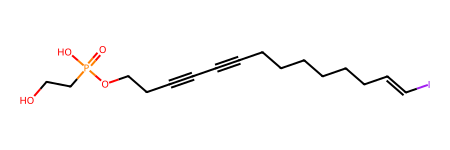

Neobsahuje ring
CCOP(=O)(O)CCO


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

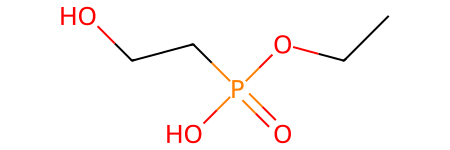

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

56.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

270.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

102694.csv
10133.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

277.csv
174.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

20113.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

64.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

36.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

275.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

103982.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

163.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC/C=C\C/C=C\C/C=C\C/C=C\CC/C=C/C=C/C(=O)O


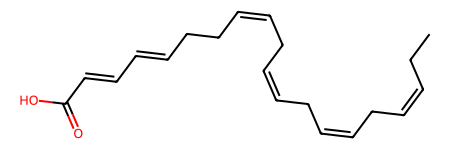

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCCCCCCCCCCCCNS(=O)(=O)NCCC


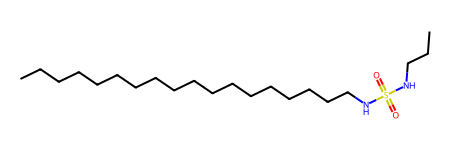

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11269.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

133.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCC/C=C(\C/C=C\CCCCCCCC(=O)O)[N+](=O)[O-]


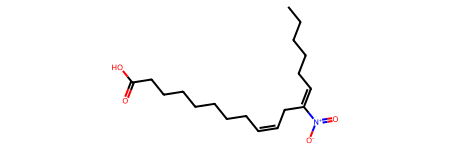

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCC/C=C(\CCCCCCCCCCC(=O)O)[N+](=O)[O-]


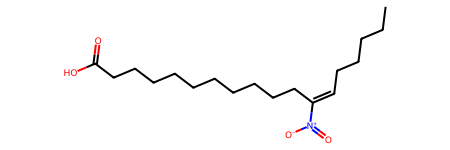

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11180.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

271.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

48.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

In [81]:
nucler_all,prumery_all = nacitani_dat_zpracovani('all_together_nuclear_threshold_100nM')

12000.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

100155.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

10674.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

109455.csv
12396.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11694.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

13000.csv
Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@@H](CC(=O)NO)CC(C)C)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

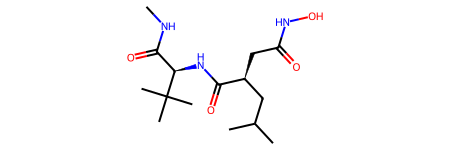

Neobsahuje ring
CCCCCCC[C@H](C[C@@H](O)CS)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

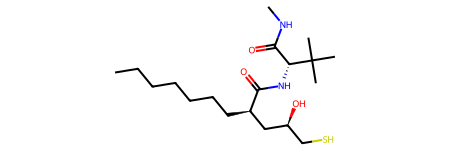

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CCCCCCCCCCCCCCO)CC(=O)NO)C(C)(C)C


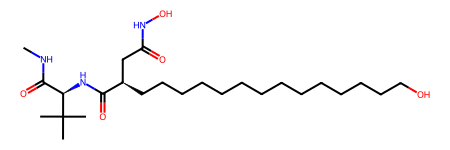

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCC[C@H](C[C@H](O)CS)C(=O)N[C@H](C(=O)NC)C(C)(C)C


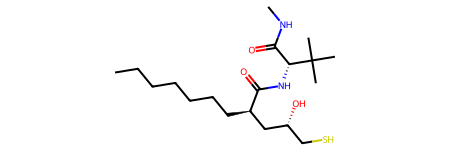

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)C(CC(C)C)C(O)CS)C(C)(C)C


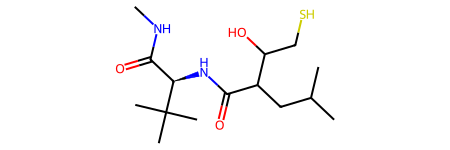

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)C[C@H](O)CS)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

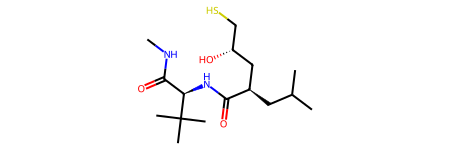

Neobsahuje ring
CC(C)C[C@H](CC(=O)NO)C(=O)N[C@@H](CC(C)C)C(=O)N[C@@H](C)C=O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

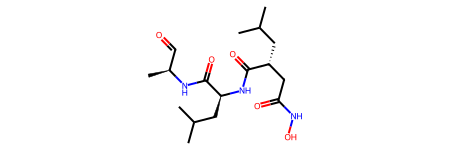

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


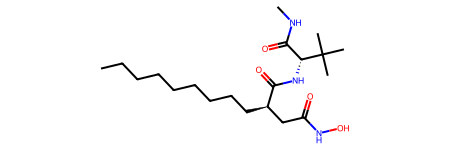

Neobsahuje ring
CC[C@@H](N[C@@H](CC(C)C)C(=O)N[C@@H](CCCCN)C(=O)NC)P(=O)(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

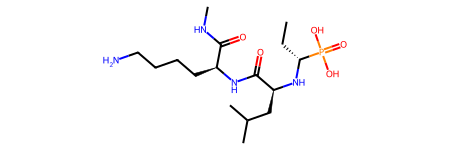

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
C=CC[C@](C)(C(=O)NO)[C@@H](CC(C)C)C(=O)N[C@H](C(=O)NC)C(C)(C)C


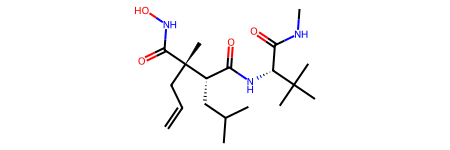

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


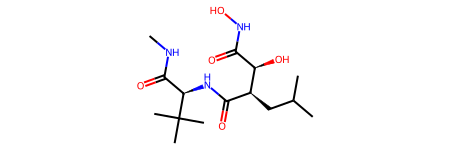

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@@H](C(=O)N(C)C)[C@H](CN(C)S(C)(=O)=O)C(=O)NO


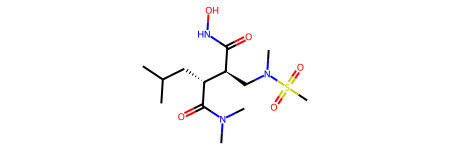

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)C[C@@H](O)CS)C(C)(C)C


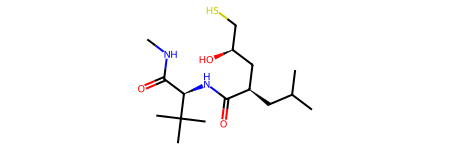

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCOC(=O)[C@H](C)NC(=O)[C@H](CC(C)C)NC(=O)[C@@H](CC(=O)NO)CC(C)C


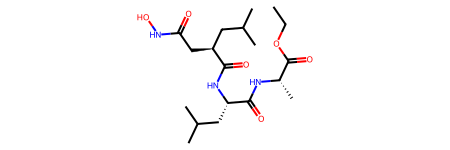

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)C(CC(C)C)C(=O)CS)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

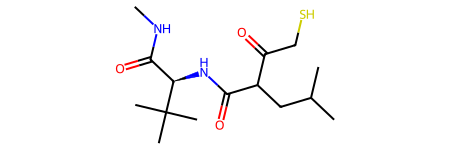

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@@H](CC(=O)CS)CC(C)C)C(C)(C)C


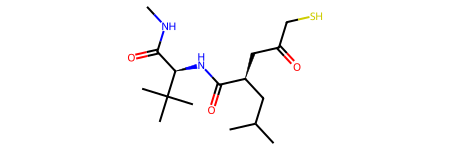

Neobsahuje ring
CC[C@H](N[C@@H](CC(C)C)C(=O)N[C@@H](CCCN(C)C)C(=O)NC)P(=O)(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

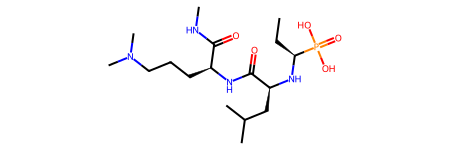

Neobsahuje ring
C=CC[C@H](C(=O)NO)[C@@H](CC(C)C)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

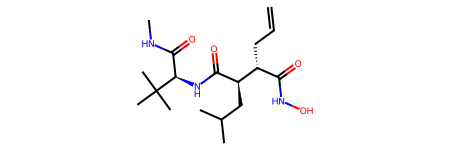

Neobsahuje ring
CNC(=O)C(NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

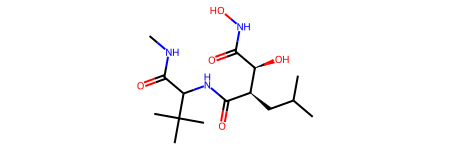

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC[C@H](N[C@@H](CC(C)C)C(=O)N[C@@H](CCCN=C(N)N)C(=O)NC)P(=O)(O)O


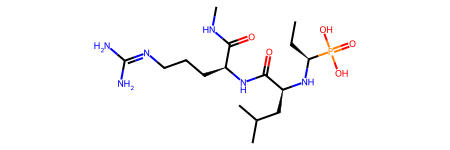

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


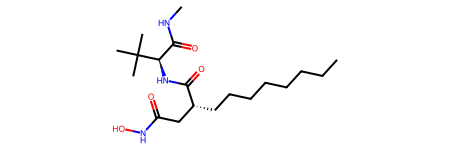

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCC(C(=O)CS)C(=O)N[C@H](C(=O)NC)C(C)(C)C


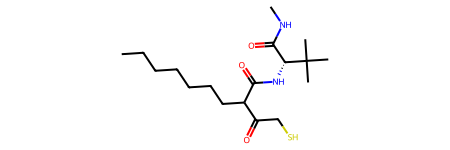

Neobsahuje ring
CCCCCCC[C@H](CC(=O)CS)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

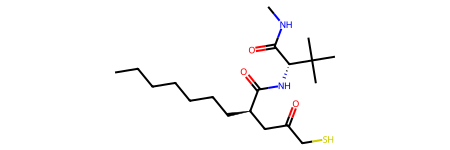

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@@H](CC(=O)NO)CC(C)C)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

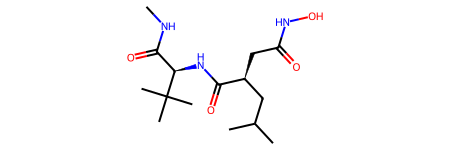

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](CO)C(=O)NO)C(C)(C)C


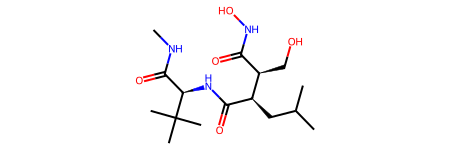

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@@H](C(=O)N[C@H](C(N)=O)C(C)(C)C)[C@H](C)N(O)C=O


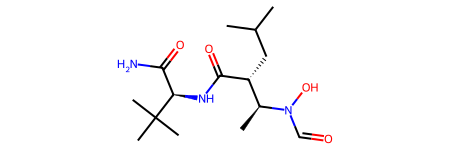

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

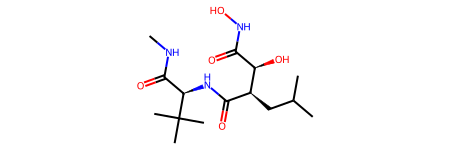

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](C)N(O)C=O)C(C)(C)C


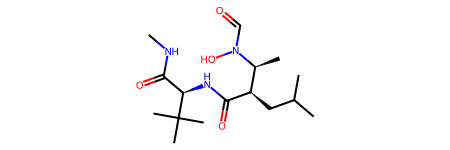

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

236.csv
Neobsahuje ring
CC(C)C[C@@H](CC(=O)N[C@@H](CO)C(=O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

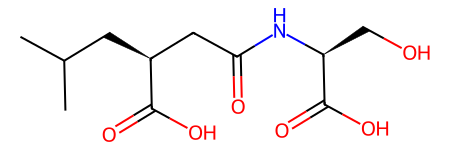

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@@H](CC(=O)O)C(=O)N[C@@H](CO)C(=O)O


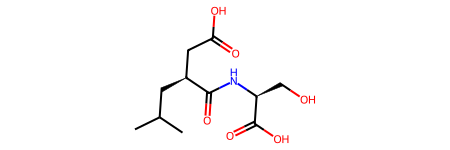

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC[C@@H](C)[C@H](S)C(=O)N[C@@H](C)C(=O)O


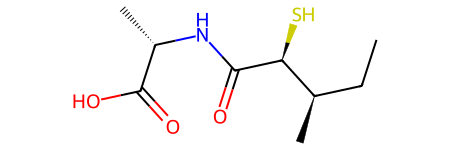

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

10702.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCOC(=O)[C@@H](C)NC(=O)C(O)[C@H](N)CCSCC


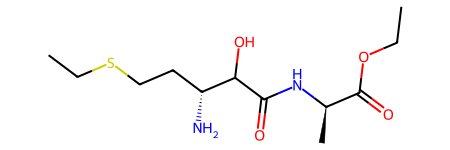

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

101477.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

12725.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@@H](CC(C)C)C(=O)N[C@H](C=O)CCCNC(=N)N


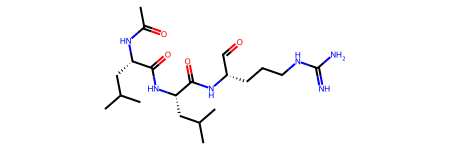

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

12067.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@@H](CC(=O)O)C(=O)N[C@@H](CCC(=O)O)C(=O)N[C@H](C(=O)N[C@H](C=O)CC(=O)O)C(C)C


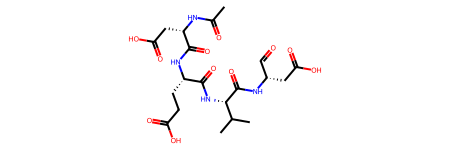

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

38.csv
Neobsahuje ring
CCCCCCCCNC(=O)NCCCCCC


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

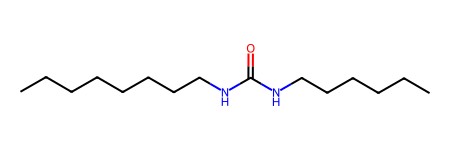

Neobsahuje ring
CCCCCCCCCCCCNC(=O)NCCCC


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

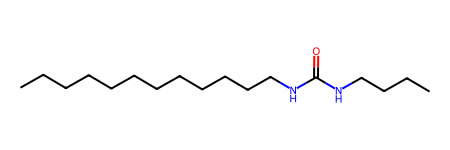

Neobsahuje ring
CCCCCCCCCCCCNC(=O)NCC(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

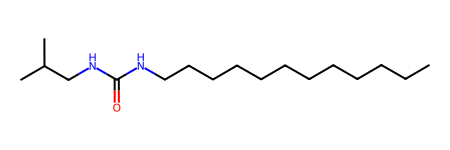

Neobsahuje ring
CCCCCCCCCCCNC(=O)NCCCC


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

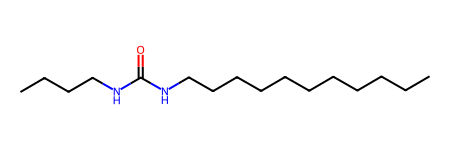

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCCNC(=O)NCCCCC


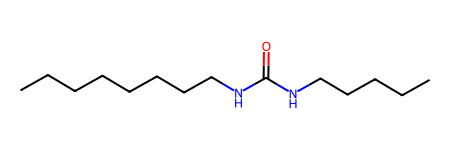

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCCNC(=O)OC


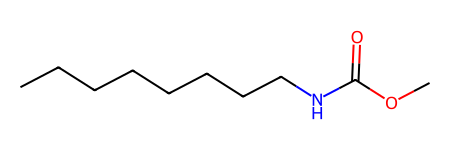

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCCNC(=O)NCCC


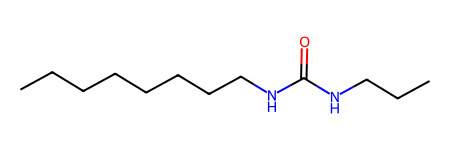

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

10378.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@@H](CC(C)C)C(=O)N[C@H](C=O)CCCNC(=N)N


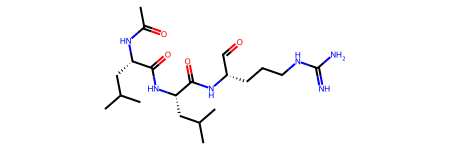

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@@H](CC(C)C)C(=O)N[C@H](C=O)CCCNC(=N)N


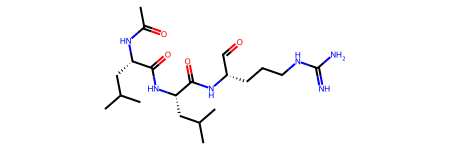

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](C=O)NC(=O)[C@H](CC(C)C)NC(=O)[C@H](CC(C)C)NC(C)=O


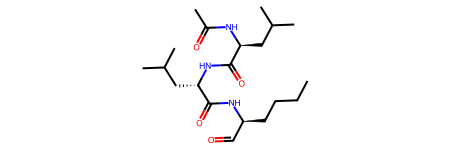

Neobsahuje ring
CCCC[C@H](NC(=O)[C@H](CC(C)C)NC(=O)[C@H](CC(C)C)NC(C)=O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

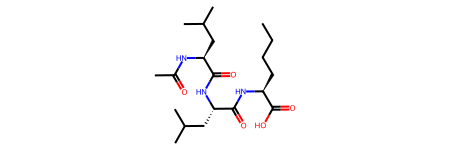

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

184.csv
Neobsahuje ring
O=C(O)CC[C@H](NC(=O)N[C@@H](CCC(=O)O)C(=O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


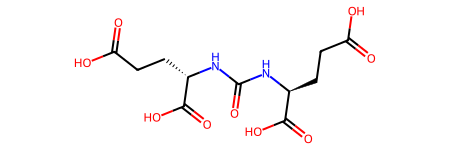

Neobsahuje ring
O=C(O)[C@@H](C[C@@H](F)C(=O)O)CP(=O)(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

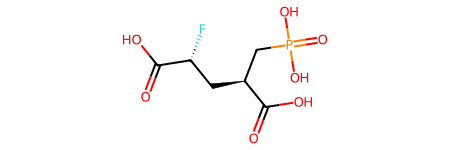

Neobsahuje ring
O=C(O)CCC(CC(=O)NO)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

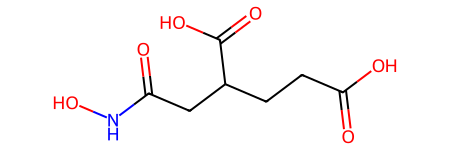

Neobsahuje ring
N[C@@H](CCC(=O)N[C@@H](COP(=O)(O)N[C@@H](CCC(=O)O)C(=O)O)C(=O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

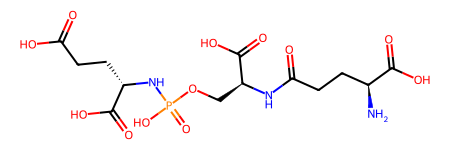

Neobsahuje ring
O=C([O-])CC[C@H](NP(=O)([O-])[O-])C(=O)[O-]


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

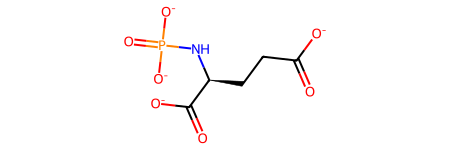

Neobsahuje ring
O=C(O)CCC(CCCC(=O)NO)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


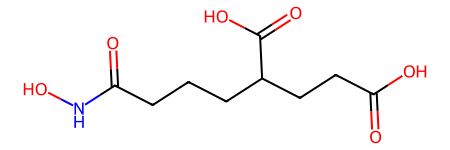

Neobsahuje ring
CC(C)C[C@@H](OC(=O)N[C@@H](CCC(=O)O)C(=O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


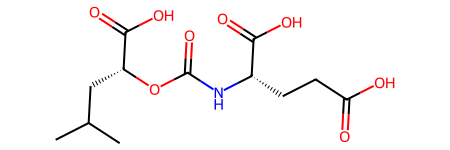

Neobsahuje ring
O=C(O)[C@H](C[C@H](F)C(=O)O)CP(=O)(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


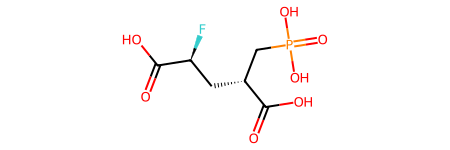

Neobsahuje ring
CC(C)C[C@@H](NC(=O)N[C@@H](CCC(=O)O)C(=O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

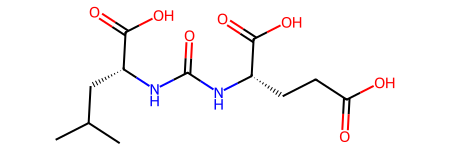

Neobsahuje ring
O=C(O)CCC(CCCS)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


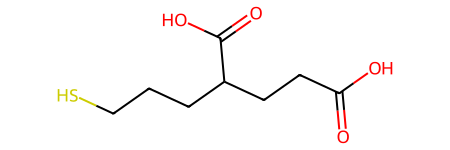

Neobsahuje ring
O=C(O)CCCC(CP(=O)(O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

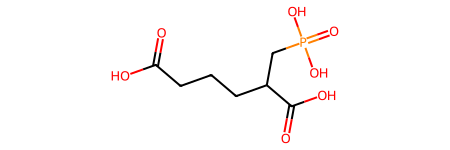

Neobsahuje ring
CC(C)C[C@H](NC(=O)O[C@@H](CCC(=O)O)C(=O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

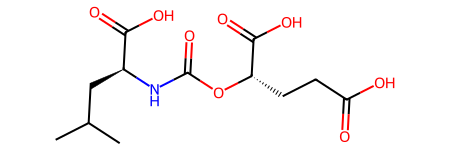

Neobsahuje ring
O=C(O)CC[C@H](CP(=O)(O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


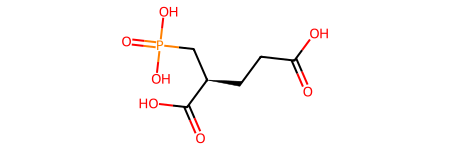

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@H](NC(=O)N[C@@H](CCC(=O)O)C(=O)O)C(=O)O


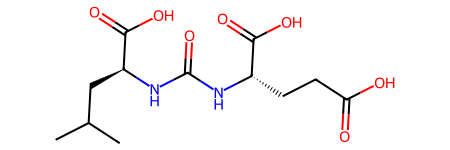

Neobsahuje ring
O=C([O-])CC[C@H](OP(=O)([O-])[O-])C(=O)[O-]


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

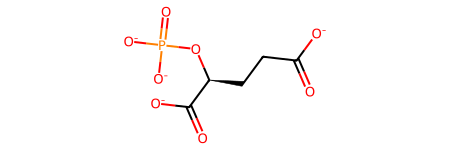

Neobsahuje ring
NCCCC[C@H](NC(=O)N[C@@H](CCC(=O)O)C(=O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

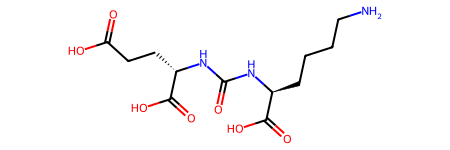

Neobsahuje ring
O=C(O)CC[C@H](NP(=O)(O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

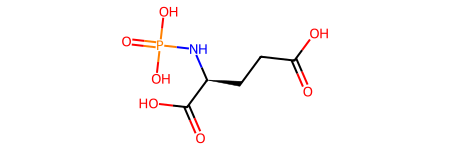

Neobsahuje ring
CC(C)C[C@@H](NC(=O)O[C@@H](CCC(=O)O)C(=O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


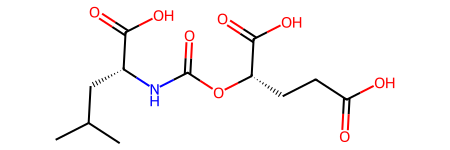

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
O=C(O)C(F)CC(CP(=O)(O)O)C(=O)O


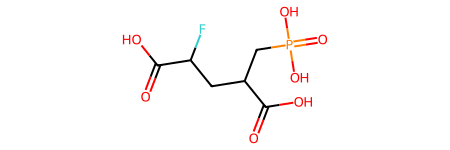

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
O=C(O)[C@H](C[C@@H](F)C(=O)O)CP(=O)(O)O


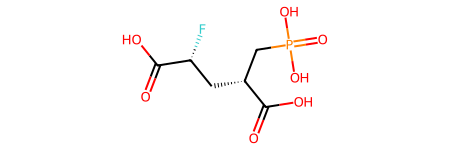

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
O=C(O)CCC(CP(=O)(O)O)C(=O)O


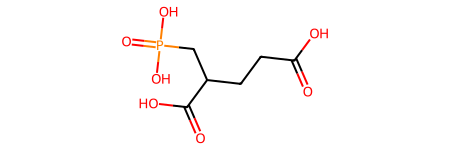

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@H](OC(=O)N[C@@H](CCC(=O)O)C(=O)O)C(=O)O


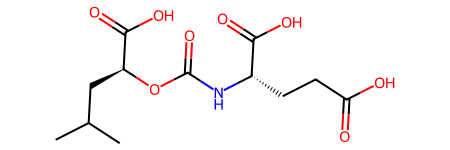

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@H](NC(=O)O[C@H](CCC(=O)O)C(=O)O)C(=O)O


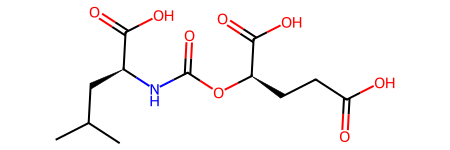

Neobsahuje ring
O=C(O)CCC(CCS)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

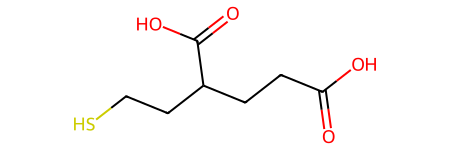

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
N[C@@H](CCC(=O)N[C@@H](COP(=O)([O-])O[C@@H](CCC(=O)O)C(=O)O)C(=O)O)C(=O)O


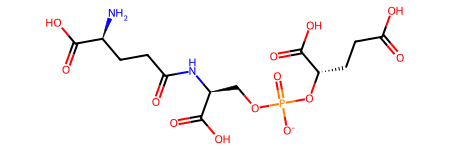

Neobsahuje ring
O=C(O)[C@@H](C[C@H](F)C(=O)O)CP(=O)(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


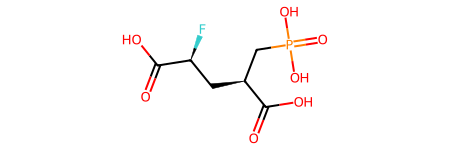

Neobsahuje ring
O=C(O)CC[C@H](NC(=O)N[C@@H](CCC(=O)O)C(=O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

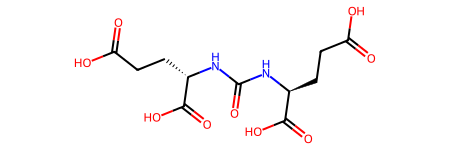

Neobsahuje ring
O=C(O)[C@@H](C[C@@H](F)C(=O)O)CP(=O)(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

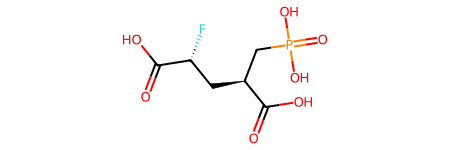

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
O=C(O)CC[C@@H](CP(=O)(O)O)C(=O)O


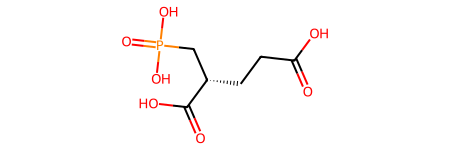

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@H](NC(=O)N[C@@H](CCC(=O)O)C(=O)O)C(=O)O


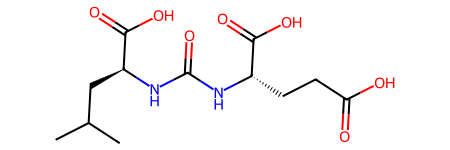

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
NCCCC[C@H](NC(=O)N[C@@H](CCC(=O)O)C(=O)O)C(=O)O


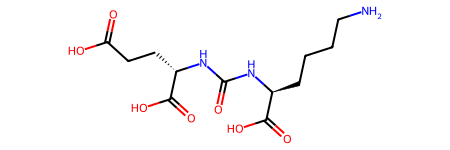

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
O=C(O)CC(CP(=O)(O)O)C(=O)O


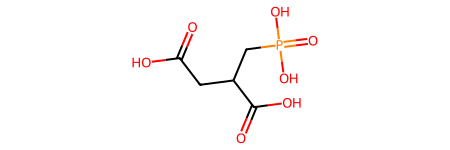

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
O=C(O)C(F)CC(CP(=O)(O)O)C(=O)O


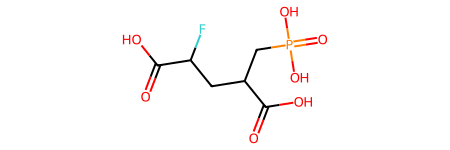

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
O=C(O)[C@H](C[C@H](F)C(=O)O)CP(=O)(O)O


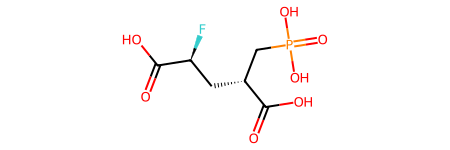

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)NCCCC[C@H](NC(=O)N[C@@H](CCC(=O)O)C(=O)O)C(=O)O


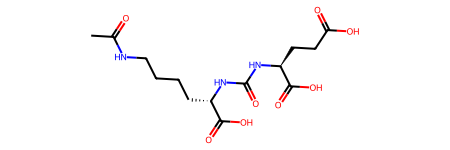

Neobsahuje ring
O=C(O)[C@H](C[C@@H](F)C(=O)O)CP(=O)(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

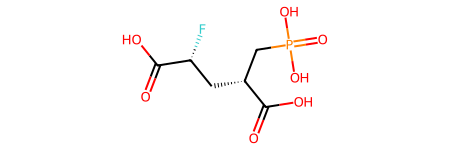

Neobsahuje ring
O=C(O)[C@@H](C[C@H](F)C(=O)O)CP(=O)(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


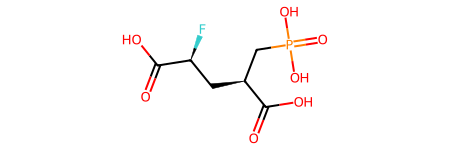

Neobsahuje ring
O=C(O)CCC(CP(=O)(O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


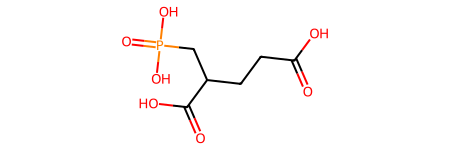

Neobsahuje ring
O=C(O)CC[C@H](CP(=O)(O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

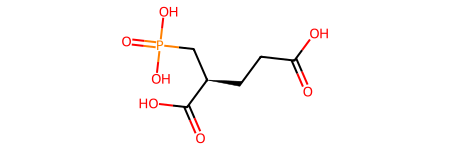

Neobsahuje ring
O=C(O)CC[C@H](NC(=O)N[C@@H](CS)C(=O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

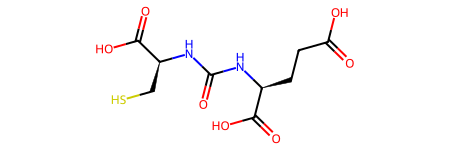

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


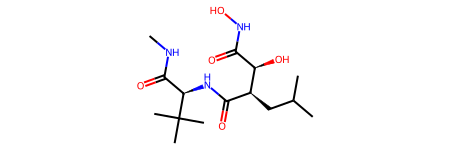

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@@H](CC(=O)NO)CC(C)C)C(C)(C)C


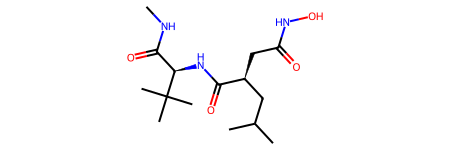

Neobsahuje ring
CCNC(CC(C)C)C(=O)NC(=O)[C@H](CC(C)C)NC(=O)C(CC(C)C)C(=O)CS


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


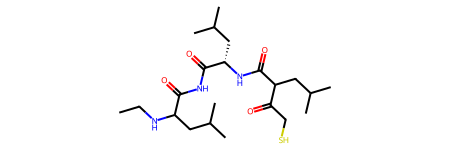

Neobsahuje ring
CCCCCCC[C@H](C[C@@H](O)CS)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

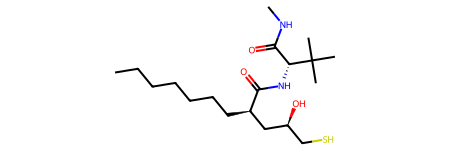

Neobsahuje ring
CCCCCCCC(C(=O)CS)C(=O)N[C@@H](CCCC)C(=O)NC(=O)C(CC(C)C)NCC


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

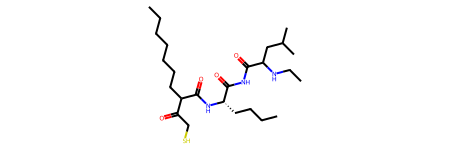

Neobsahuje ring
CCCCCCCC(C(=O)CS)C(=O)N[C@@H](CC(C)C)C(=O)NC(=O)C(CC(C)C)NCC


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

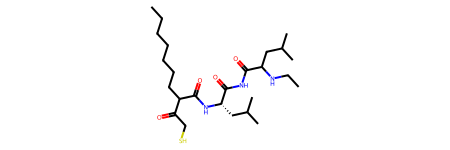

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CCCCCCCCCCCCCCO)CC(=O)NO)C(C)(C)C


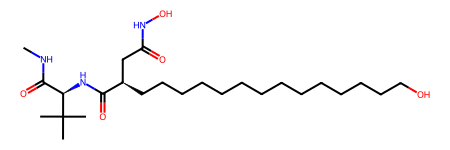

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


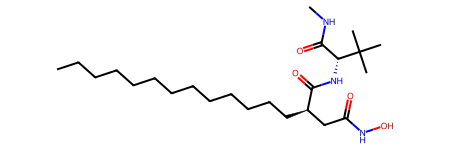

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCC(C(=O)N[C@@H](CC(C)C)C(=O)NC(=O)C(CC(C)C)NCC)C(O)CS


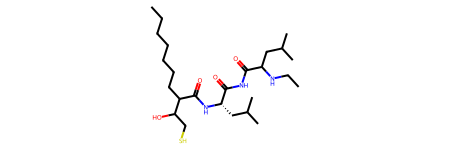

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCC[C@H](C[C@H](O)CS)C(=O)N[C@H](C(=O)NC)C(C)(C)C


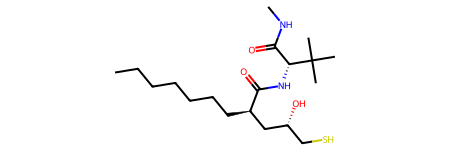

Neobsahuje ring
CCCCCCCC(C(=O)N[C@H](C(=O)NC)C(C)(C)C)C(O)CS


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

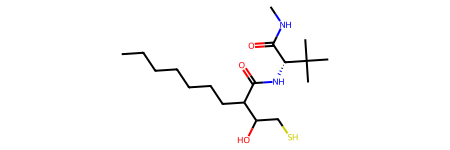

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@H](NC(=O)[C@H](CC(C)C)[C@@H](C)C(=O)NO)C(C)(C)C


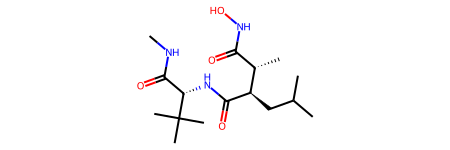

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)C[C@H](O)CS)C(C)(C)C


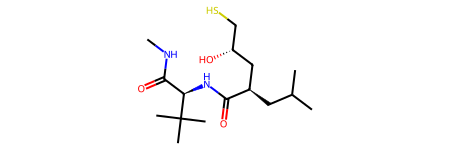

Neobsahuje ring
CCCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

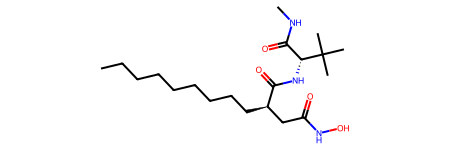

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
C=CC[C@](C)(C(=O)NO)[C@@H](CC(C)C)C(=O)N[C@H](C(=O)NC)C(C)(C)C


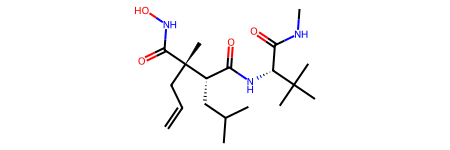

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCC[C@H](C[C@H](O)CS)C(=O)N[C@@H](CC(C)C)C(=O)NC(=O)C(CC(C)C)NCC


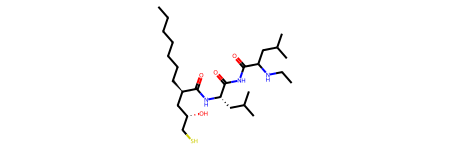

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

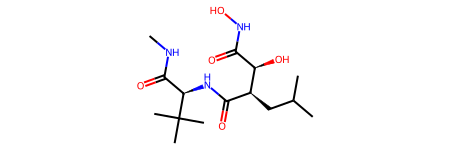

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


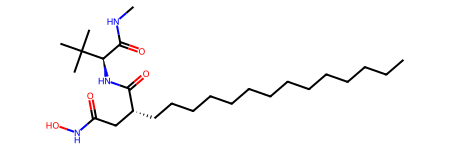

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCC[C@H](CC(=O)CS)C(=O)N[C@@H](CC(C)C)C(=O)NC(=O)C(CC(C)C)NCC


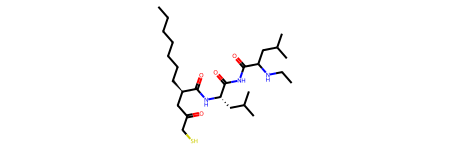

Neobsahuje ring
CCCCCCCCCCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

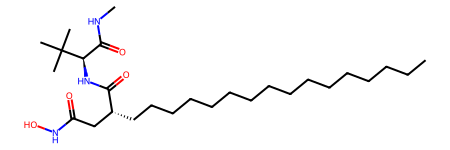

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@H](NC(=O)[C@@H](CC(=O)NO)CC(C)C)C(C)(C)C


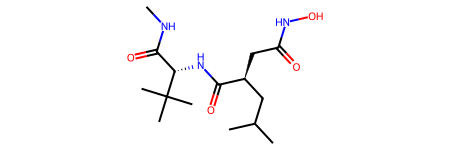

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)C(CC(C)C)C(=O)CS)C(C)(C)C


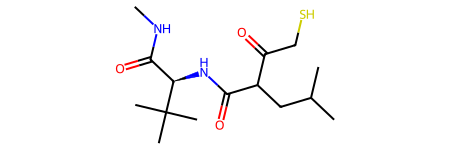

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@@H](CC(=O)CS)CC(C)C)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

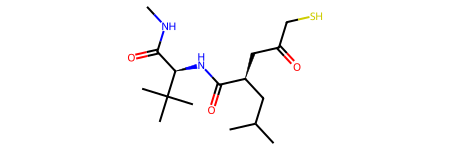

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
C=CC[C@H](C(=O)NO)[C@@H](CC(C)C)C(=O)N[C@H](C(=O)NC)C(C)(C)C


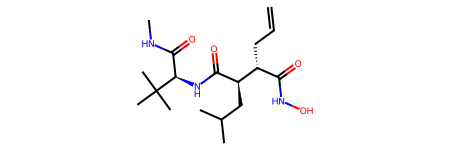

Neobsahuje ring
CNC(=O)C(NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

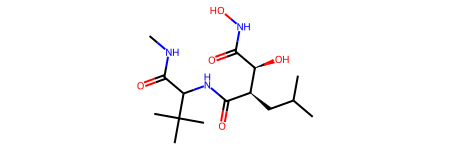

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


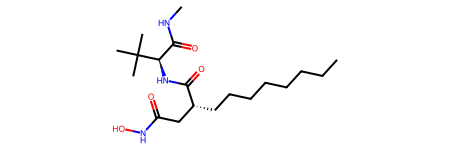

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCC(C(=O)CS)C(=O)N[C@H](C(=O)NC)C(C)(C)C


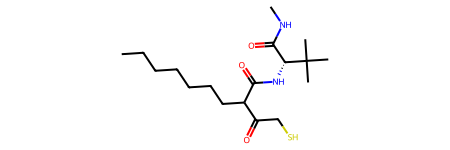

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCC[C@H](CC(=O)CS)C(=O)N[C@H](C(=O)NC)C(C)(C)C


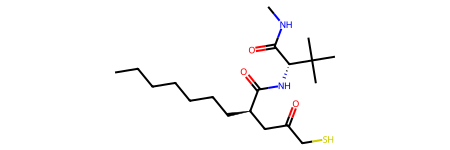

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@@H](CC(=O)NO)CC(C)C)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

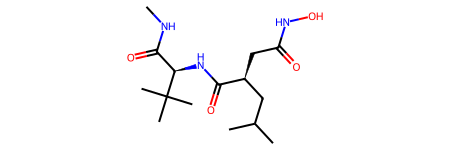

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](CO)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

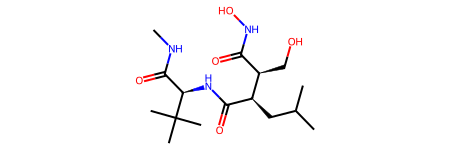

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@@H](C(=O)N[C@H](C(N)=O)C(C)(C)C)[C@H](C)N(O)C=O


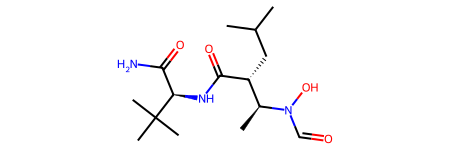

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

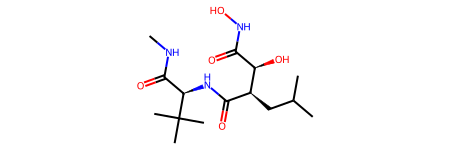

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


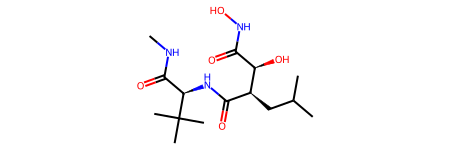

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)C(NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


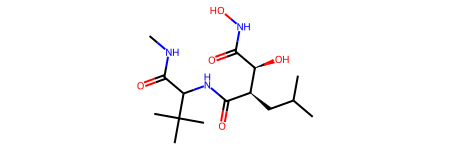

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](CC(C)C)NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO


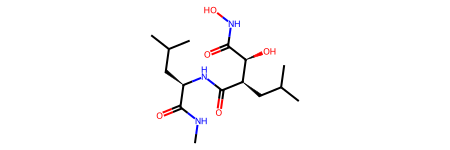

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
O=C(CNS(=O)(=O)C(F)(F)C(F)(F)C(F)(F)C(F)(F)F)NO


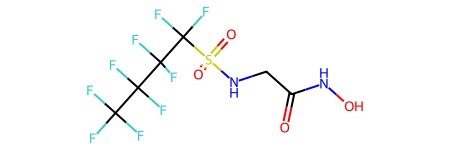

Neobsahuje ring
CC(C)CC(NS(=O)(=O)C(F)(F)C(F)(F)C(F)(F)C(F)(F)F)C(=O)NO


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

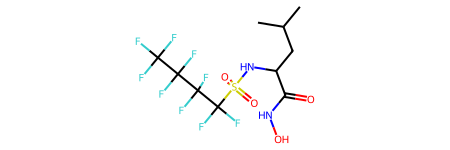

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C(NS(=O)(=O)C(F)(F)C(F)(F)C(F)(F)C(F)(F)F)C(=O)NO


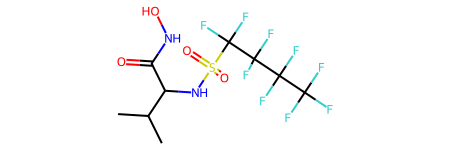

Neobsahuje ring
CCCCCCCCNC(=O)C(CC(C)C)C(=O)NO


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

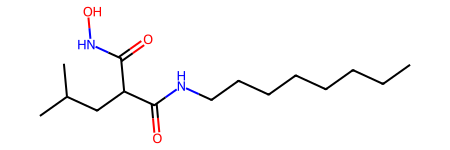

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](CC(C)C)NC(=O)[C@@H](CC(=O)NO)CC(C)C


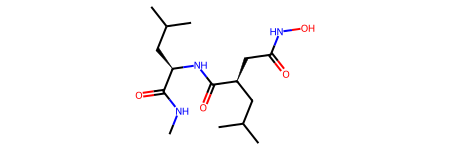

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(NS(=O)(=O)C(F)(F)C(F)(F)C(F)(F)C(F)(F)F)C(=O)NO


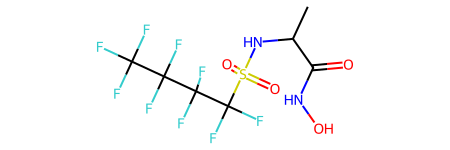

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCC)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

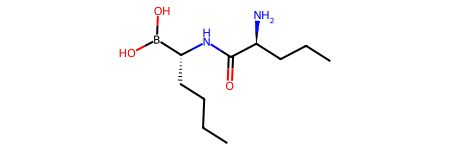

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCCC)B(O)O


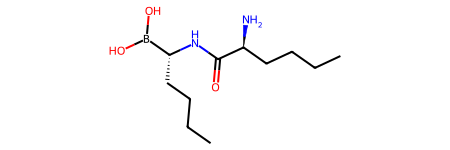

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
C[C@H](NC(=O)[C@H](C)N)B(O)O


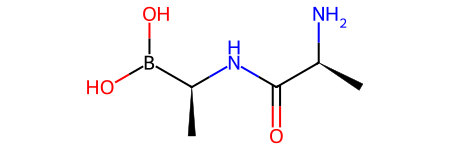

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)[C@H](N)C(=S)N[C@@H](C)B(O)O


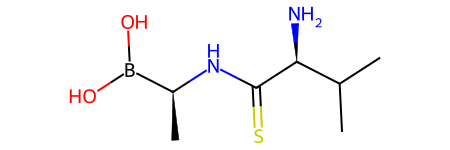

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)[C@H](N)C(=O)N[C@@H](C)B(O)O


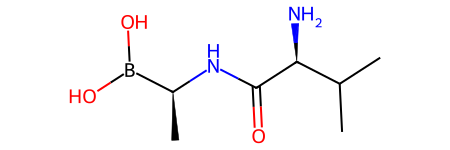

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
C[C@H](NC(=O)[C@@H](N)CCC(=O)O)B(O)O


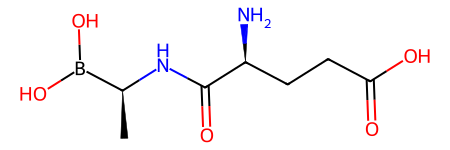

Neobsahuje ring
CCN(CC#N)C(=O)[C@@H](N)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

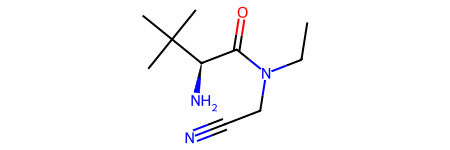

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
C[C@H](NC(=O)[C@@H](N)CCC(N)=O)B(O)O


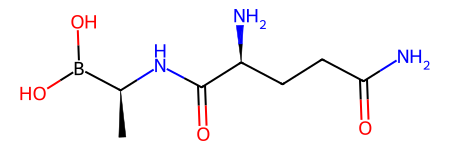

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
C=CCN(CC#N)C(=O)[C@@H](N)C(C)(C)C


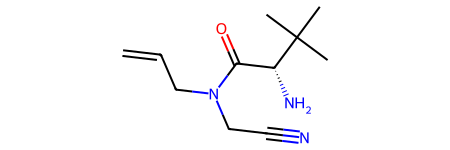

Neobsahuje ring
CN(CC#N)C(=O)[C@@H](N)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

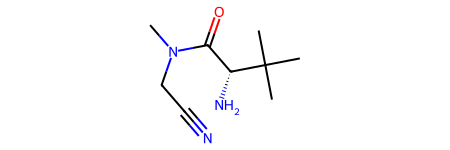

Neobsahuje ring
CC(C)[C@H](N)C(=O)N[C@@H](C)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

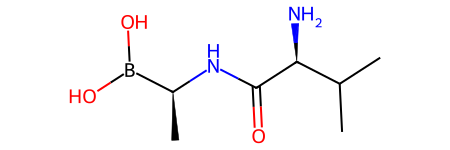

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
C[C@@H](C#N)N(C)C(=O)[C@@H](N)C(C)(C)C


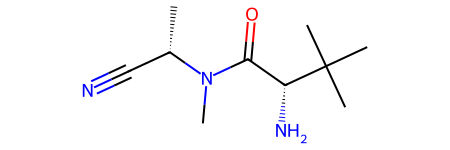

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)[C@H](N)C(=O)N(C)CC#N


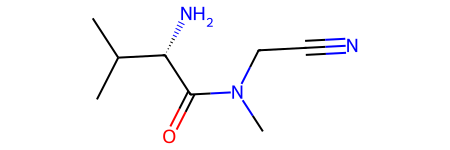

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@@H](CC(=O)NO)CC(C)C)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

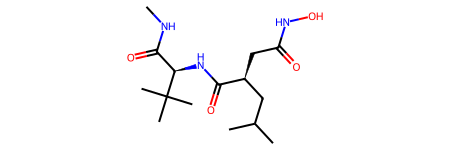

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


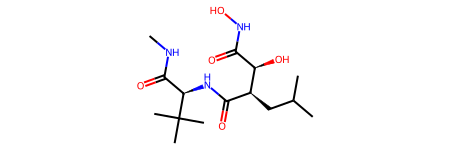

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@H](C(=O)NO)C(=O)N[C@@H](C)C(=O)NCC(N)=O


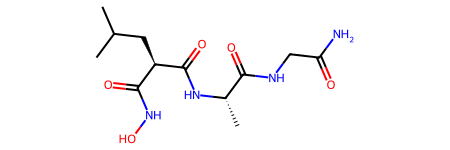

Neobsahuje ring
CC(C)C(C(=O)NO)C(=O)NCCC(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

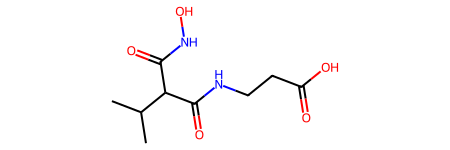

Neobsahuje ring
CC(C)C(C(=O)NO)C(=O)NC(CC(N)=O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

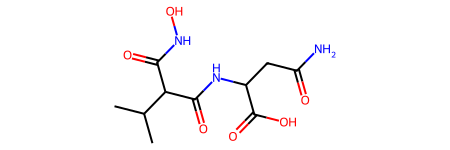

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C(C(=O)NO)C(=O)NCC(=O)O


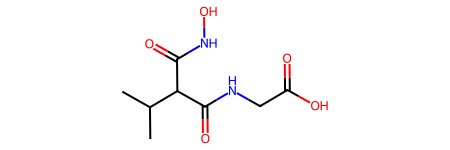

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C(CC(=O)NO)C(=O)NC(CC(N)=O)C(=O)O


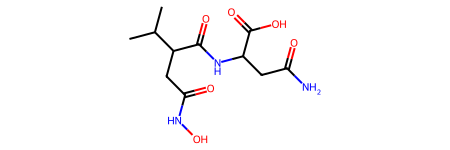

Neobsahuje ring
CC(C)C(CC(=O)NO)C(=O)NCCC(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

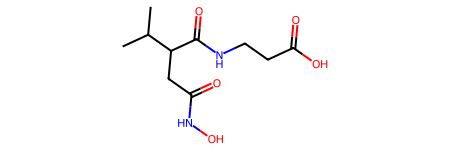

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)CC(=O)N[C@@H](C(=O)N[C@@H](C(=O)NC(CC(C)C)[C@@H](O)CC(=O)N[C@H](C)C(=O)NC(CC(C)C)[C@@H](O)CO)C(C)C)C(C)C


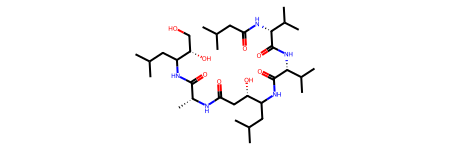

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
COC(=O)[C@H](CCCN=C(N)N)NC(=O)CC(O)[C@H](CC(C)C)NC(=O)[C@H](C)NC(=O)CC(O)[C@H](CC(C)C)NC(=O)[C@@H](NC(=O)[C@@H](NC(=O)CC(C)C)C(C)C)C(C)C


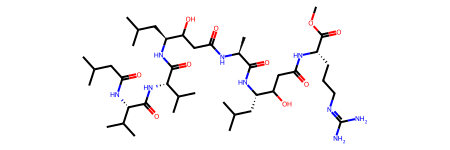

Neobsahuje ring
CC(C)CC(=O)N[C@H](C(=O)N[C@H](C(=O)N[C@@H](CC(C)C)C(O)CC(=O)N[C@@H](C)C(=O)N[C@@H](CC(C)C)C(O)CC(=O)N[C@@H](CCCN=C(N)N)C(=O)O)C(C)C)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

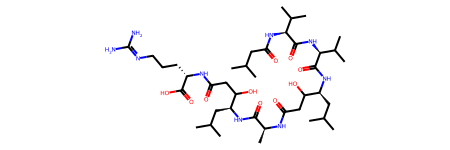

Neobsahuje ring
CC(C)CC(=O)N[C@H](C(=O)N[C@H](C(=O)N[C@@H](CC(C)C)[C@@H](O)CC(=O)N[C@@H](C)C(=O)N[C@@H](CC(C)C)[C@@H](O)CC(=O)O)C(C)C)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

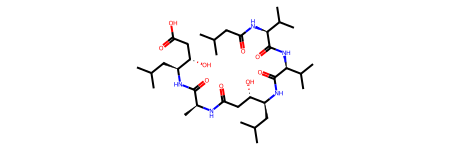

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
N=C(N)NCCC[C@H](NC(=O)[C@H](CCCNC(=N)N)NC(=O)[C@H](CCCNC(=N)N)NC(=O)[C@H](CCCNC(=N)N)NC(=O)[C@@H](N)CCCNC(=N)N)C(=O)O


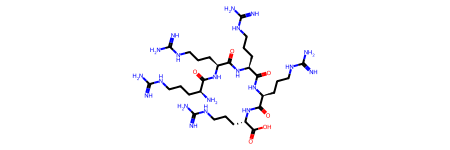

Neobsahuje ring
C[C@H](N)C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@H](C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCNC(=N)N)C(=O)O)[C@@H](C)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

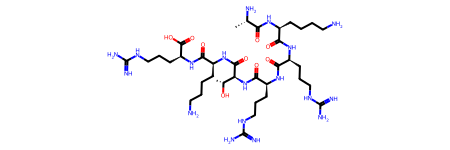

Neobsahuje ring
COC(=O)[C@@H](CC(C)C)NC(=O)CNC(=O)[C@H](NC(=O)CCC(=O)[C@H](CCCN=C(N)N)NC(=O)[C@H](CCCCN)NC(=O)[C@@H](NC(=O)[C@H](CCCN=C(N)N)NC(C)=O)C(C)C)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

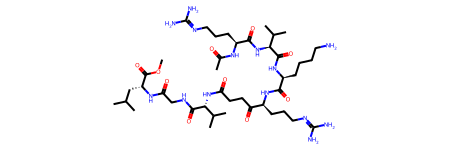

Neobsahuje ring
CC(C)C[C@H](NC(=O)[C@@H](N)CC(C)C)C(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@H](C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCNC(=N)N)C(=O)O)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


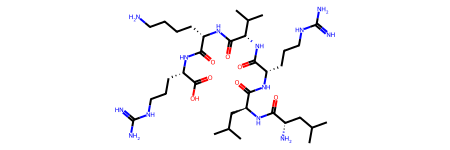

Neobsahuje ring
N=C(N)NCCC[C@H](NC(=O)[C@H](CCCNC(=N)N)NC(=O)[C@H](CCCNC(=N)N)NC(=O)[C@H](CCCNC(=N)N)NC(=O)[C@H](CCCNC(=N)N)NC(=O)[C@@H](N)CCCNC(=N)N)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

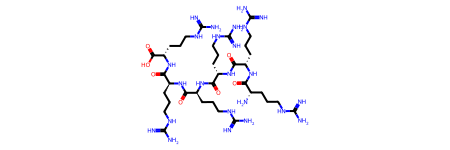

Neobsahuje ring
CC(C)[C@H](N)C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@H](C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCNC(=N)N)C(=O)O)[C@@H](C)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


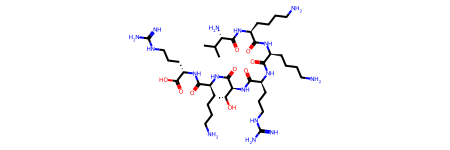

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@@H](CC(C)C)C(=O)N[C@@H](CC(C)C)C(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@H](C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCNC(=N)N)C(N)=O)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


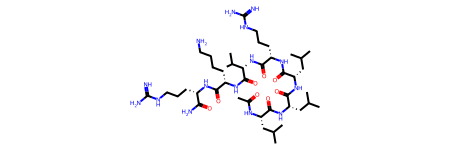

Neobsahuje ring
CCCCCCCCCCN[C@@H](CCCN=C(N)N)C(=O)N[C@H](C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCN=C(N)N)C(=O)CN[C@@H](C)C(=O)N[C@H](C(=O)NCC(=O)OC)C(C)C)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

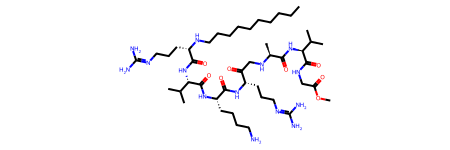

Neobsahuje ring
CCCCCCCCCCN[C@@H](CCCN=C(N)N)C(=O)N[C@H](C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCN=C(N)N)C(=O)CCC(=O)N[C@@H](C(=O)NCC(=O)OC)C(C)C)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


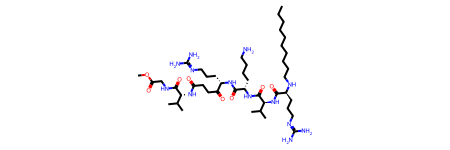

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@H](N)C(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@H](C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCNC(=N)N)C(=O)O)C(C)C


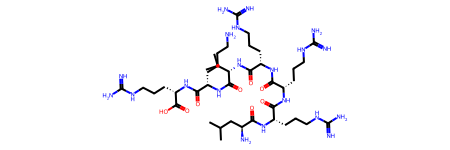

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@H](NC(=O)[C@@H](N)CC(C)C)C(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@@H](C)C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCNC(=N)N)C(=O)O


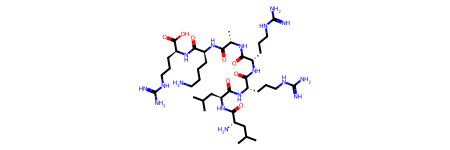

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)[C@H](N)C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@H](C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCNC(=N)N)C(=O)O)C(C)C


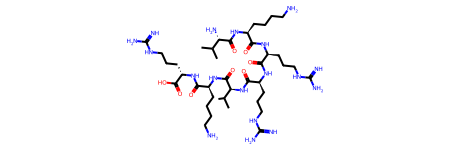

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


Neobsahuje ring
CCCCCCCCCCN[C@@H](CCCN=C(N)N)C(=O)N[C@H](C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCN=C(N)N)C(=O)CN[C@@H](C)C(=O)N[C@H](C(=O)NCC(N)=O)C(C)C)C(C)C


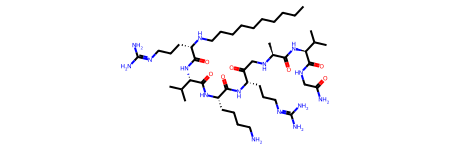

Neobsahuje ring
CC(C)C[C@H](NC(=O)[C@@H](N)CC(C)C)C(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@H](C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCNC(=N)N)C(N)=O)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

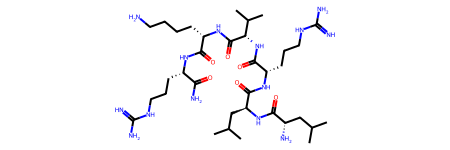

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\


Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@@H](CC(C)C)C(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@H](C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCNC(=N)N)C(N)=O)C(C)C


/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/ipykernel_11891/1112449295.py:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_csk'].loc[x] = MurckoScaffoldSmiles(\


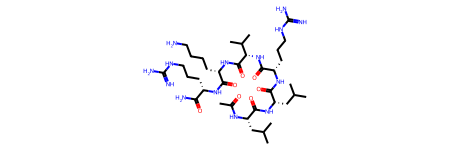

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@H](C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCNC(=N)N)C(N)=O)C(C)C


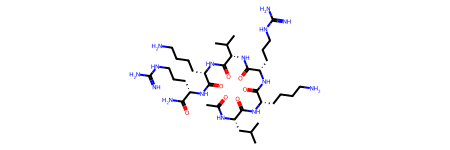

Neobsahuje ring
CCCCCCCCCC(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@H](C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCNC(=N)N)C(=O)CCl)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


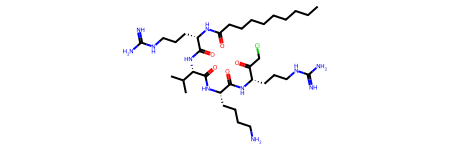

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCCCCN[C@@H](CCCN=C(N)N)C(=O)N[C@H](C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCN=C(N)N)C(=O)CCC(=O)OC)C(C)C


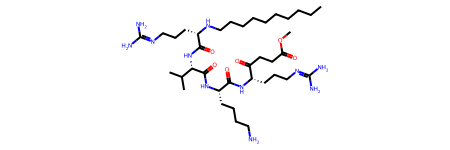

Neobsahuje ring
N=C(N)NCCC[C@H](NC(=O)[C@H](CCCCN)NC(=O)[C@H](CO)NC(=O)[C@H](CCCNC(=N)N)NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](CCCCN)NC(=O)[C@@H](N)CCC(=O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


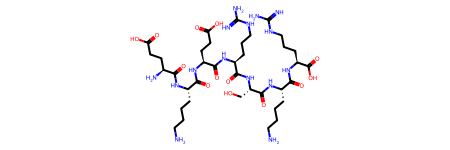

Neobsahuje ring
CCCCCCCCCCN[C@@H](CCCN=C(N)N)C(=O)N[C@H](C(=O)N[C@@H](CCCCN)C(=O)N[C@H](CCCN=C(N)N)C(=O)CN[C@@H](C)C(=O)N[C@H](C(=O)NCC(N)=O)C(C)C)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

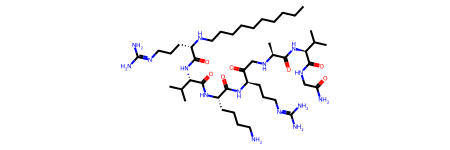

Neobsahuje ring
CCCCCCCCCCN[C@@H](CCCN=C(N)N)C(=O)N[C@H](C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCN=C(N)N)C(=O)CN[C@@H](C)C(=O)OC)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


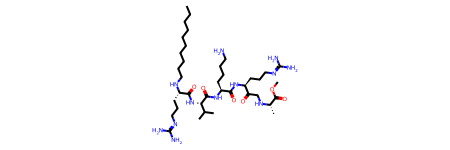

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@@H](CC(=O)NO)CC(C)C)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

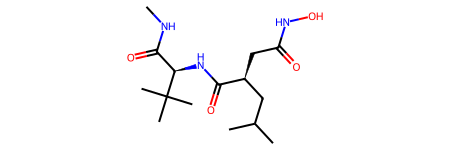

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](SC)C(=O)NO)C(C)(C)C


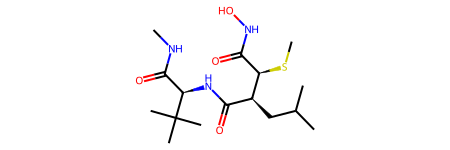

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](OC)C(=O)NO)C(C)(C)C


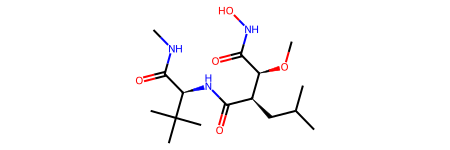

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCS[C@H](C(=O)NO)[C@@H](CC(C)C)C(=O)N[C@H](C(=O)NC)C(C)(C)C


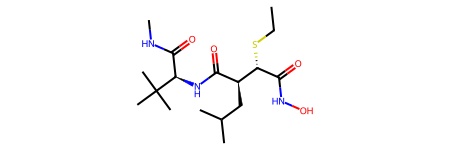

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](NC(C)=O)C(=O)NO)C(C)(C)C


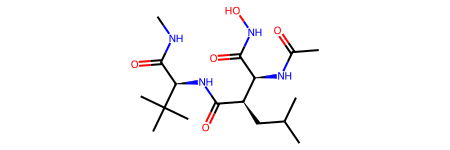

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

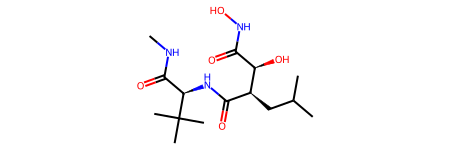

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](NS(C)(=O)=O)C(=O)NO)C(C)(C)C


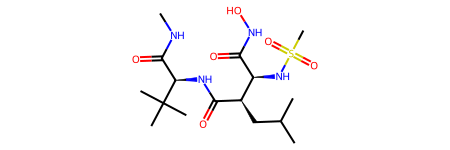

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](NCCCSC)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

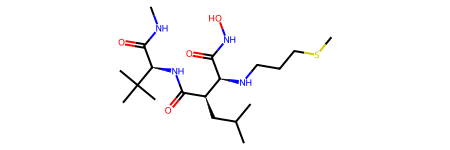

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@@H](CC(=O)NO)CC(C)C)C(C)(C)C


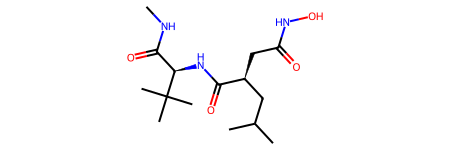

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](CO)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

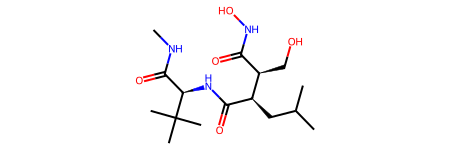

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@@H](C(=O)N[C@H](C(N)=O)C(C)(C)C)[C@H](C)N(O)C=O


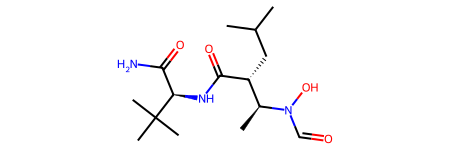

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

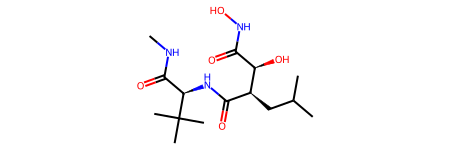

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](C)N(O)C=O)C(C)(C)C


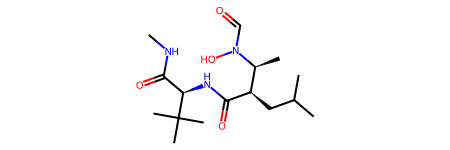

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@H](NC(=O)OC(C)(C)C)C(=O)NCC#N


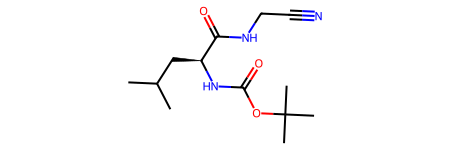

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CSCC[C@H](NC(=O)OC(C)(C)C)C(=O)NCC#N


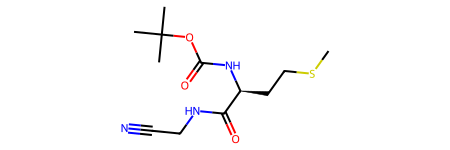

Neobsahuje ring
CCC[C@H](NC(=O)OC(C)(C)C)C(=O)NCC#N


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

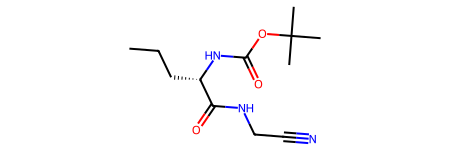

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@H](NC(=O)OC(C)(C)C)C(=O)NCC#N


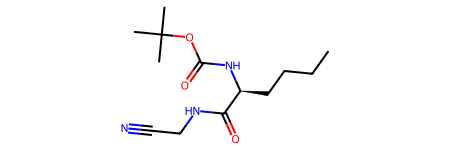

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@@H](CC(=O)O)C(=O)N[C@@H](CCC(=O)O)C(=O)N[C@H](C(=O)N[C@H](C=O)CC(=O)O)C(C)C


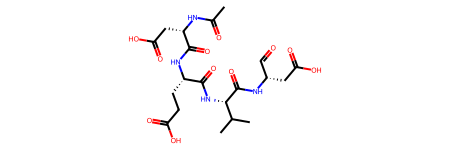

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@@H](CC(=O)O)C(=O)N[C@@H](CCC(=O)O)C(=O)N[C@H](C(=O)N[C@H](CC=O)CC(=O)O)C(C)C


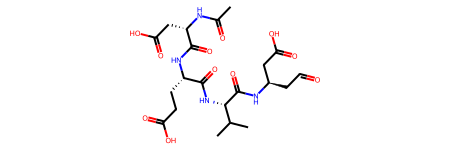

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@H](C(=O)N[C@@H](C)C(=O)N[C@@H](CC(=O)O)C(=O)O)C(C)C


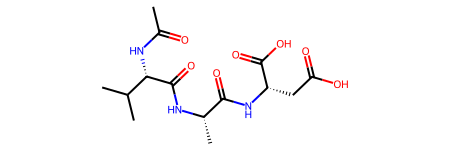

Neobsahuje ring
CC(C)[C@H](NC(=O)CC(Cl)Cl)C(=O)N[C@@H](C)C(=O)N[C@H](C=O)CC(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

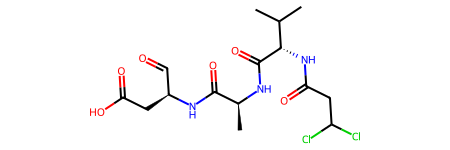

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCNC(=O)N(C)CCCC/C=C\CCCCCCC(=O)O


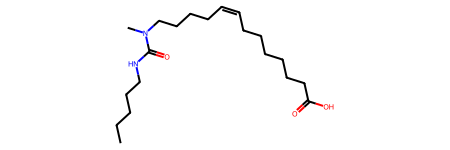

Neobsahuje ring
CCCCCCC(=O)NCCCCCCCC#CCCCC(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

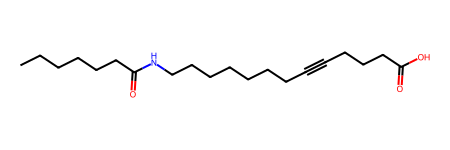

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Nepovedlo se udelat geneticky scaffold
Index 16348
O=C(Nc1cccc(S(F)(F)(F)(F)F)c1)NC12CC3CC(CC(C3)O1)C2


[12:03:08] Explicit valence for atom # 8 C, 6, is greater than permitted


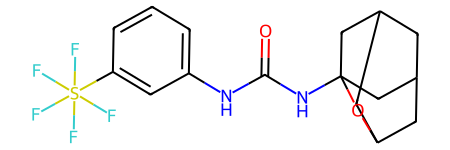

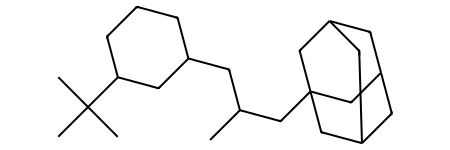

Nepovedlo se udelat generic - murcko scaffold
Index 16348
O=C(Nc1cccc(S(F)(F)(F)(F)F)c1)NC12CC3CC(CC(C3)O1)C2


/tmp/ipykernel_11891/1112449295.py:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(mol)
[12:03:08] Explicit valence for atom # 8 C, 6, is greater than permitted


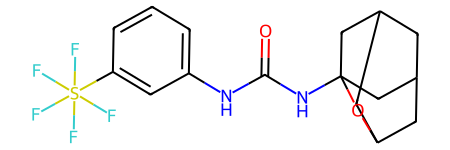

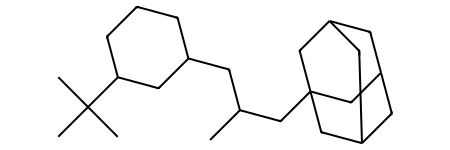

/tmp/ipykernel_11891/1112449295.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_csk'].loc[x] = MurckoScaffoldSmiles(Chem.MolToSmiles(mol))


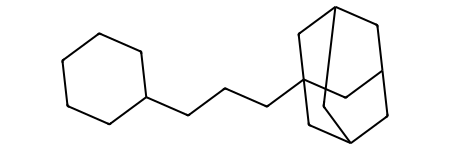

Neobsahuje ring
CCCCCNC(=O)NCCCCC#CCCCCCCC(=O)O


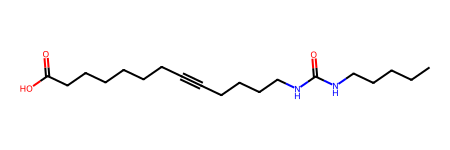

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCNC(=O)NCCCC/C=C\CCCCCCC(=O)N[C@@H](CC(=O)O)C(=O)O


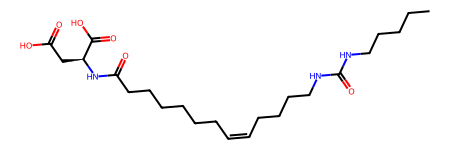

Neobsahuje ring
CCCCCNC(=O)NCCCC/C=C\CCCCCCC(=O)OCCOCCOCCO


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

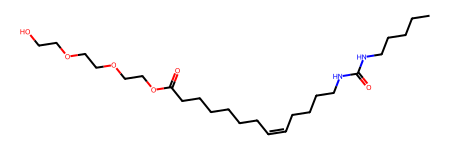

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCNC(=O)NCCCC/C=C\CCCCCCS(=O)(=O)O


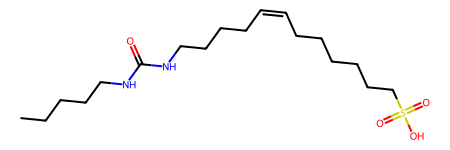

Neobsahuje ring
CCCCNC(=O)NCCCCC/C=C\CCCCCCC(=O)OC


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

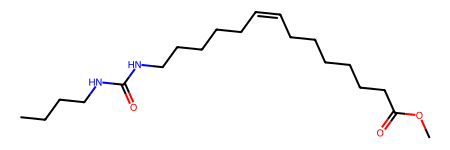

Neobsahuje ring
CCCCCNC(=O)NCCCC/C=C\CCCCCCC(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

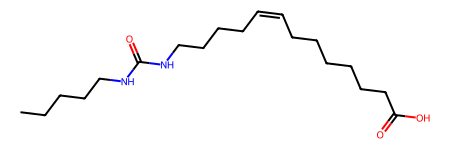

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCNC(=O)NCCCC/C=C\CCCCCCC(=O)N[C@@H](CC(=O)[O-])C(=O)[O-]


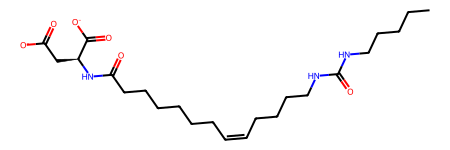

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCNC(=O)NCCCC/C=C\CCCCOCC(=O)O


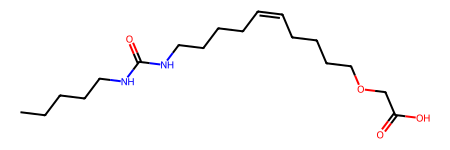

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCC(=O)NCCCC/C=C\CCCCCCC(=O)O


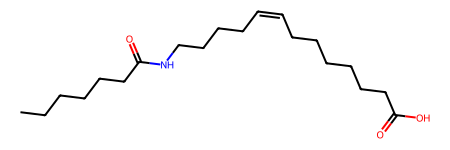

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCNC(=O)NCCCC/C=C\CCCCCCS(=O)(=O)[O-]


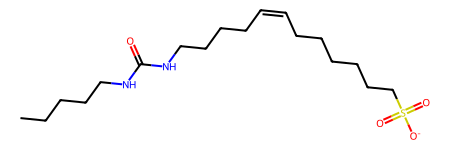

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCNC(=O)NCCCC/C=C\CCCCCCC(=O)NS(C)(=O)=O


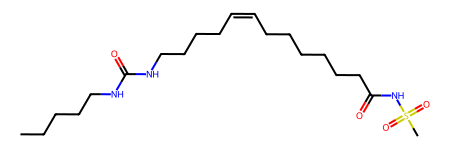

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCNC(=O)CCCC/C=C\CCCCCCC(=O)O


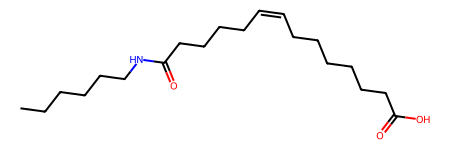

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCNC(=O)NCCCC/C=C\CCCCCCC(=O)N[C@H](CC(=O)O)C(=O)O


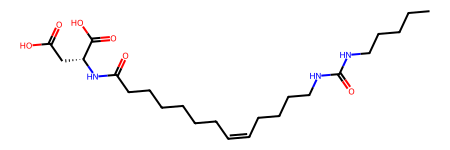

Neobsahuje ring
CCCCCNC(=O)NCCCCCCC/C=C\CCCC(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

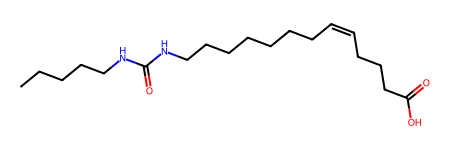

Neobsahuje ring
CCCCCNC(=S)NCCCC/C=C\CCCCCCC(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

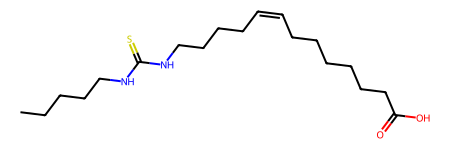

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCNC(=O)NCCC/C=C\CCCCCCC(=O)O


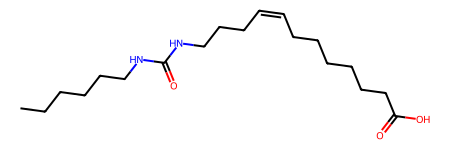

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCNC(=O)NCCCC/C=C/CCCCCCC(=O)O


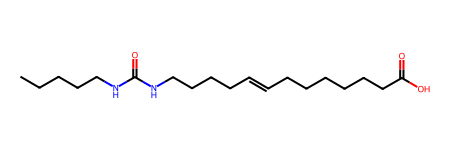

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC[C@@H](C)[C@H](S)C(=O)N[C@@H](C)C(=O)O


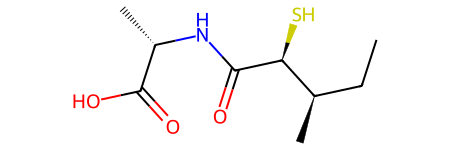

Neobsahuje ring
CC[C@@H](C)[C@H](S)C(=O)NCC(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

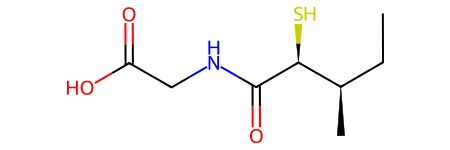

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
N=C(N)NS(=O)(=O)C(F)(F)C(F)(F)C(F)(F)C(F)(F)F


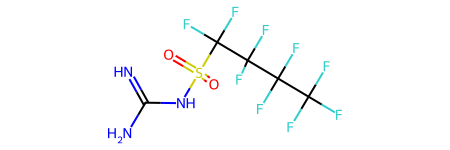

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
COC(=N)NS(=O)(=O)C(F)(F)C(F)(F)C(F)(F)C(F)(F)C(F)(F)C(F)(F)C(F)(F)C(F)(F)F


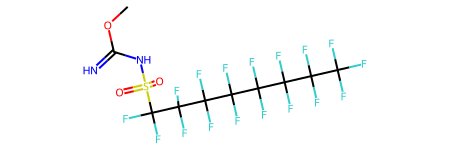

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
COC(=N)NS(=O)(=O)C(F)(F)C(F)(F)C(F)(F)C(F)(F)F


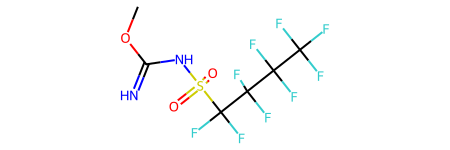

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
N=C(N)NS(=O)(=O)C(F)(F)C(F)(F)C(F)(F)C(F)(F)C(F)(F)C(F)(F)C(F)(F)C(F)(F)F


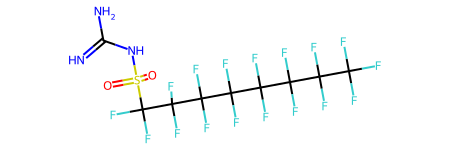

Neobsahuje ring
CC(=O)NCC(=O)NC(CCCN=C(N)N)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

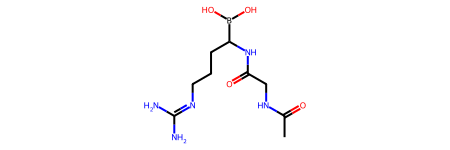

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
COC(=N)NS(=O)(=O)C(F)(F)F


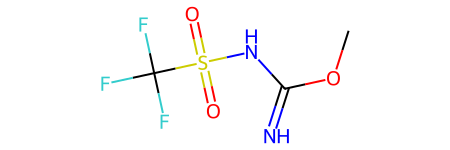

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Nepovedlo se udelat geneticky scaffold
Index 21977
COP(O)(O)(N[C@@H](C(=O)N1CCC[C@H]1C(=O)NCc1ccc(C(=N)N)cc1)C(c1ccccc1)c1ccccc1)OC


[12:03:34] Explicit valence for atom # 2 C, 5, is greater than permitted


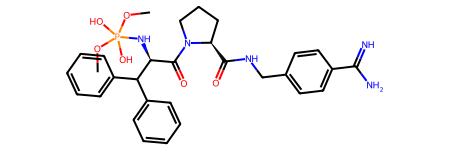

Nepovedlo se udelat generic - murcko scaffold
Index 21977
COP(O)(O)(N[C@@H](C(=O)N1CCC[C@H]1C(=O)NCc1ccc(C(=N)N)cc1)C(c1ccccc1)c1ccccc1)OC


[12:03:34] Explicit valence for atom # 2 C, 5, is greater than permitted
[12:03:34] Explicit valence for atom # 2 C, 5, is greater than permitted


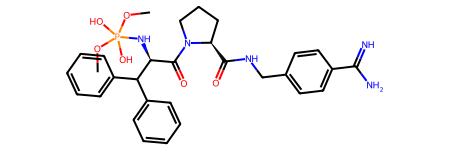

[12:03:34] Explicit valence for atom # 2 C, 5, is greater than permitted
/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff[

Neobsahuje ring
N=C(N)NS(=O)(=O)C(F)(F)F


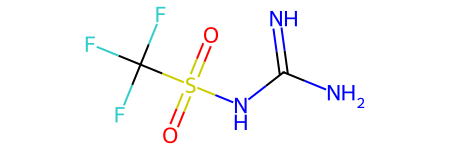

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

104445.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

12.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@@H](NC(C)=O)C(C)C)C(=O)N[C@H](C=O)CC(=O)O


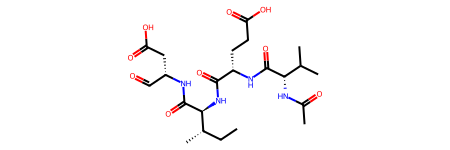

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@@H](CC(=O)O)C(=O)N[C@@H](CCC(=O)O)C(=O)N[C@H](C(=O)N[C@H](C=O)CC(=O)O)C(C)C


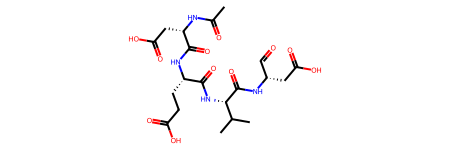

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@H](NC(=O)[C@H](CC(N)=O)NC(=O)[C@@H](NC(=O)[C@@H](N)CCC(=O)O)C(C)C)[C@@H](O)C[C@@H](C)C(=O)N[C@@H](C)C(=O)O


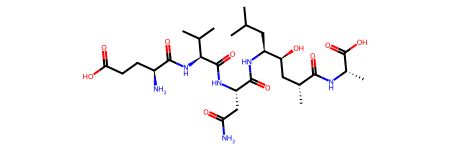

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCNC(=O)[C@H](C)C[C@H](O)[C@H](CC(C)C)NC(=O)[C@H](C)N(C)C(=O)[C@H](CC(C)C)NC(C)=O


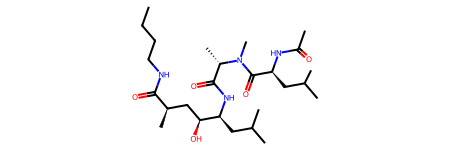

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@H](NC(=O)[C@H](CC(N)=O)NC(=O)[C@@H](NC(=O)[C@@H](N)CCC(=O)O)C(C)C)[C@@H](O)CC(=O)N[C@H](C(=O)N[C@@H](C)C(=O)N[C@@H](CCC(=O)O)C(N)=O)C(C)C


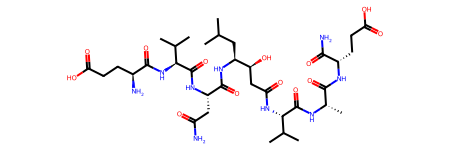

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CSCC[C@H](NC(=O)[C@@H](NC(C)=O)C(C)C)C(=O)NC(CC(C)C)C(O)CC(=O)N[C@H](C(=O)N[C@@H](C)C(=O)N[C@@H](CCC(=O)O)C(=O)O)C(C)C


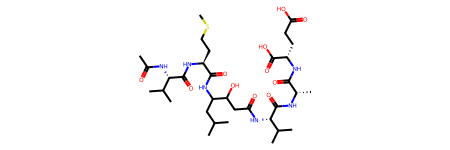

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCNC(=O)[C@H](C)C[C@H](O)[C@H](CC(C)C)NC(=O)[C@H](CCSC)NC(=O)[C@@H](NC(C)=O)C(C)C


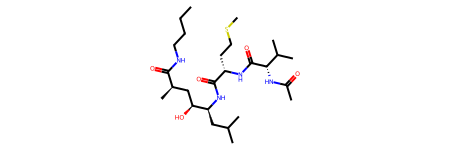

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCNC(=O)[C@H](C)C[C@H](O)[C@H](CC(C)C)NC(=O)[C@H](C)NC(=O)[C@H](CC(C)C)NC(C)=O


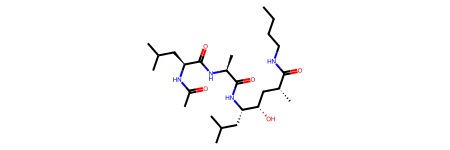

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@H](NC(=O)[C@H](CC(N)=O)NC(=O)[C@@H](NC(=O)[C@@H](N)CCC(=O)O)C(C)C)[C@@H](O)CC(=O)N[C@H](C(=O)N[C@@H](C)C(N)=O)C(C)C


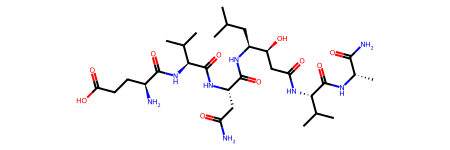

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCNC(=O)[C@H](C)C[C@H](O)[C@H](CC(C)C)NC(=O)[C@H](CCSC)NC(=O)[C@H](CC(C)C)NC(C)=O


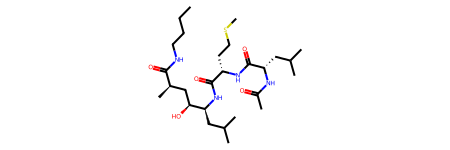

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CSCC[C@H](NC(=O)[C@@H](NC(=O)OC(C)(C)C)C(C)C)C(=O)N[C@@H](CC(C)C)[C@@H](O)C[C@@H](C)C(=O)N[C@H](C(=O)NCC(C)C)C(C)C


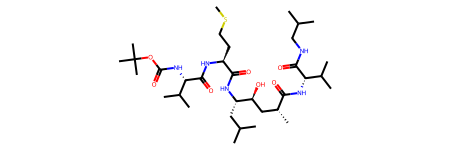

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCC)B(O)O


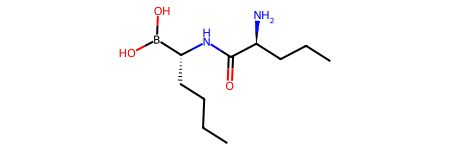

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)C(C)C)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

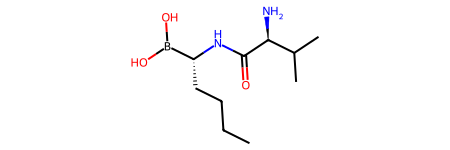

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCCN)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

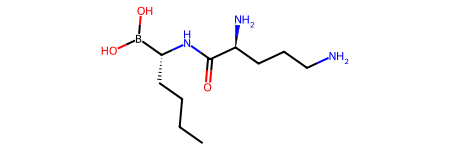

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCN)B(O)O


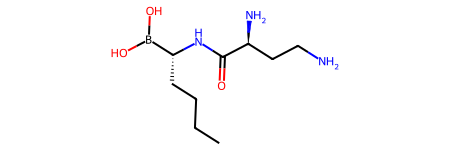

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)[C@H](N)C(=O)N[C@@H](C)B(O)O


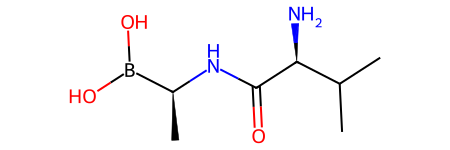

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@H](C)N)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

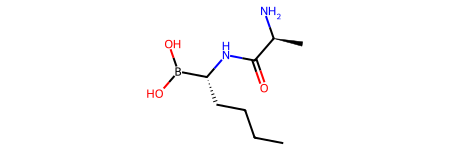

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCCC)B(O)O


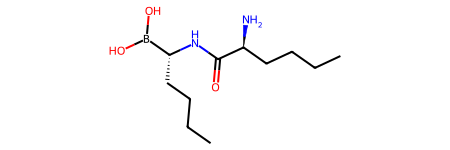

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCCCN)B(O)O


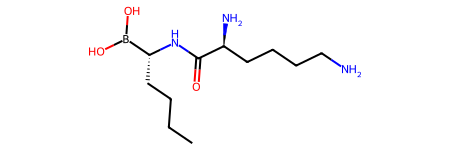

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CC)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

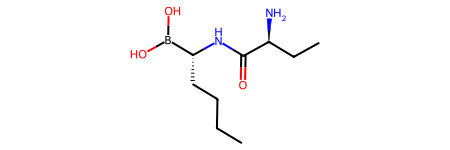

Neobsahuje ring
CCCC[C@H](NC(=O)[C@@H](N)CCN)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

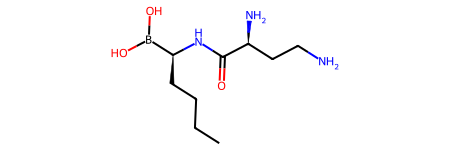

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CN)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

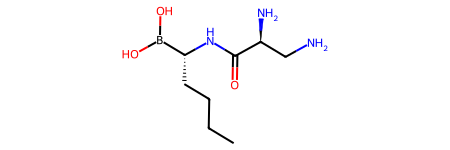

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCC[C@H](C[C@@H](O)CS)C(=O)N[C@H](C(=O)NC)C(C)(C)C


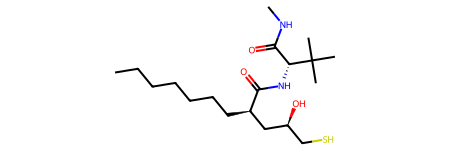

Neobsahuje ring
CCCCCCC[C@H](C[C@H](O)CS)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

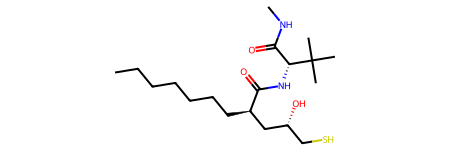

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@@H](CC(=O)NO)CC(C)C)C(C)(C)C


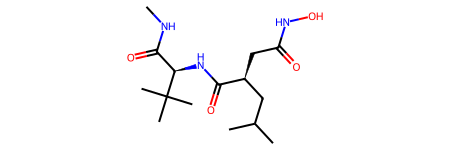

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCC[C@H](C[C@H](O)CS)C(=O)N[C@@H](CC(C)C)C(=O)NC(=O)C(CC(C)C)NCC


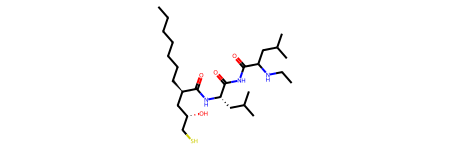

Neobsahuje ring
CCCCCCC[C@H](CC(=O)CS)C(=O)N[C@@H](CC(C)C)C(=O)NC(=O)C(CC(C)C)NCC


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

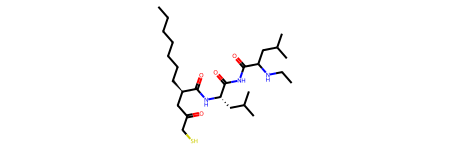

Neobsahuje ring
CNC(=O)[C@H](NC(=O)[C@@H](CC(=O)NO)CC(C)C)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

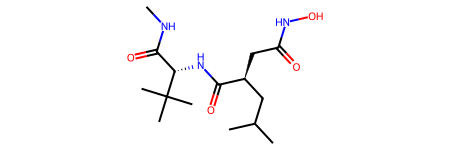

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)C[C@@H](O)CS)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


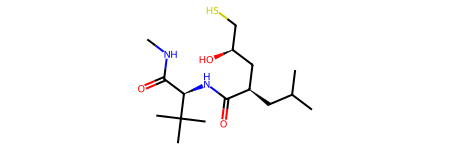

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCC(C(=O)CS)C(=O)N[C@@H](CC(C)C)C(=O)NC(=O)C(CC(C)C)NCC


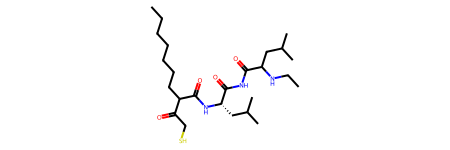

Neobsahuje ring
CNC(=O)[C@H](NC(=O)[C@H](CC(C)C)[C@@H](C)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

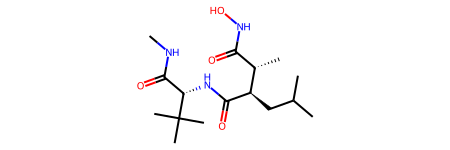

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)C[C@H](O)CS)C(C)(C)C


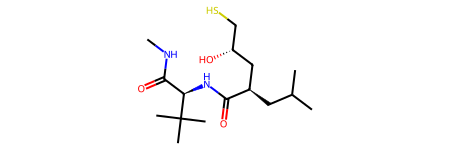

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


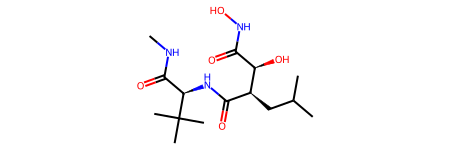

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)C(CC(C)C)C(=O)CS)C(C)(C)C


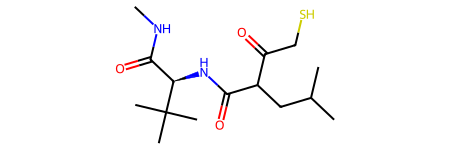

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@@H](CC(=O)CS)CC(C)C)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

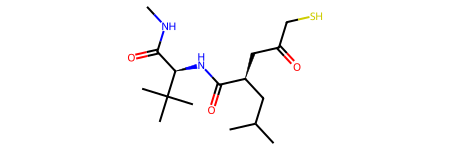

Neobsahuje ring
CNC(=O)C(NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

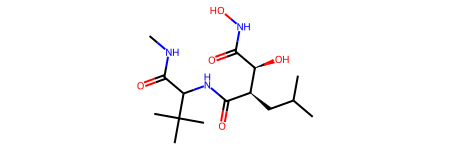

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCC[C@H](CC(=O)CS)C(=O)N[C@H](C(=O)NC)C(C)(C)C


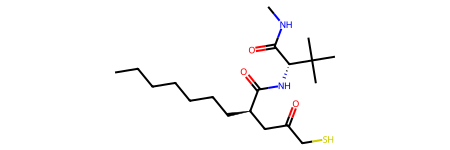

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


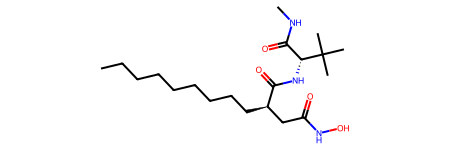

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCC(C(=O)CS)C(=O)N[C@H](C(=O)NC)C(C)(C)C


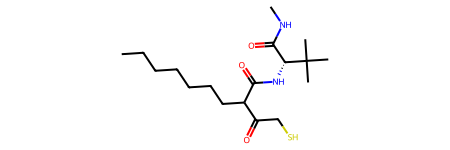

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@@H](CC(=O)NO)CC(C)C)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

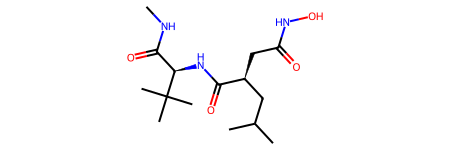

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](CC(C)C)NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO


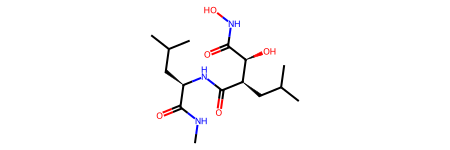

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@@H](C(=O)N[C@H](C(N)=O)C(C)(C)C)[C@H](C)N(O)C=O


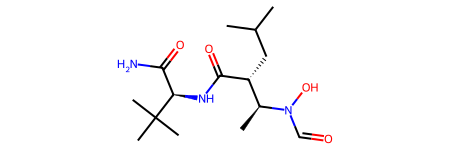

Neobsahuje ring
O=C(CNS(=O)(=O)C(F)(F)C(F)(F)C(F)(F)C(F)(F)F)NO


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

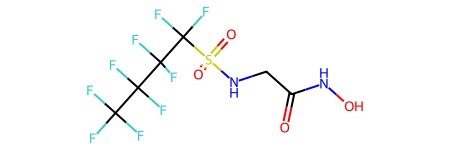

Neobsahuje ring
CC(C)CC(NS(=O)(=O)C(F)(F)C(F)(F)C(F)(F)C(F)(F)F)C(=O)NO


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

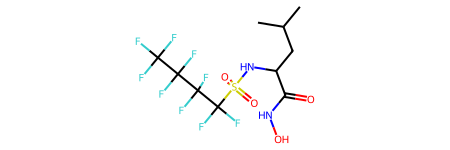

Neobsahuje ring
CCCCC(CC)COCCCNC(=O)C(=O)NO


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

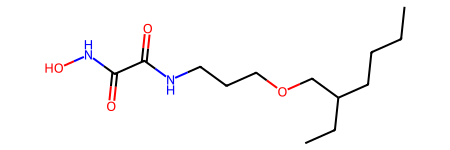

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

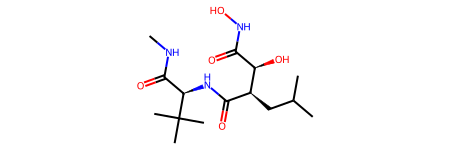

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C(NS(=O)(=O)C(F)(F)C(F)(F)C(F)(F)C(F)(F)F)C(=O)NO


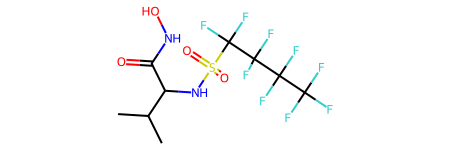

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](CC(C)C)NC(=O)[C@@H](CC(=O)NO)CC(C)C


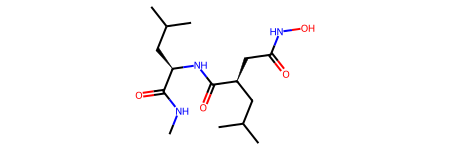

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](C)N(O)C=O)C(C)(C)C


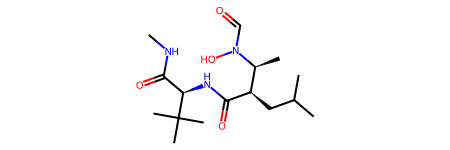

Neobsahuje ring
CC(NS(=O)(=O)C(F)(F)C(F)(F)C(F)(F)C(F)(F)F)C(=O)NO


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

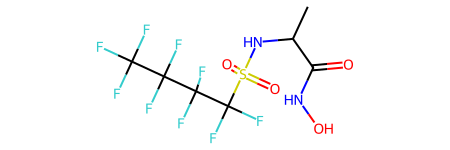

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@@H](CC(C)C)C(=O)N[C@H](C=O)CCCNC(=N)N


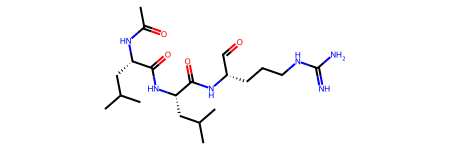

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
C=CC[C@H](C(=O)NO)[C@@H](CC(C)C)C(=O)N[C@H](C(=O)NC)C(C)(C)C


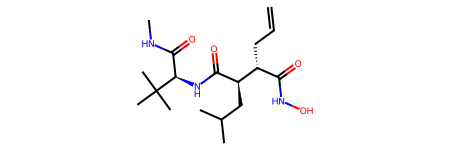

Neobsahuje ring
CNC(=O)C(NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

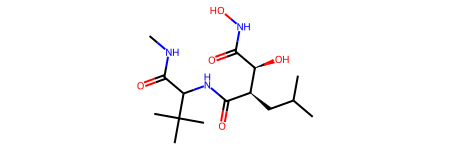

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CCCCCCCCCCCCCCO)CC(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

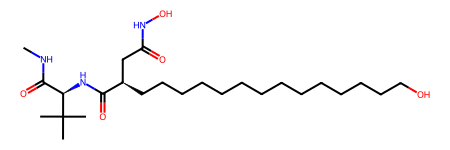

Neobsahuje ring
CCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

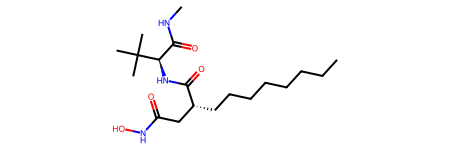

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


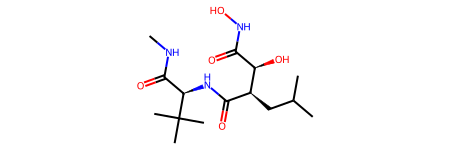

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@@H](C=O)NC(=O)[C@H](CC(C)C)NS(C)(=O)=O


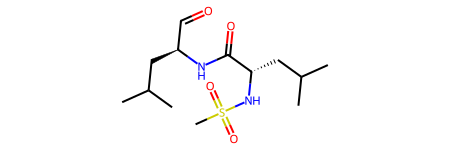

Neobsahuje ring
COC(=O)N[C@@H](CC(C)C)C(=O)N[C@H](C=O)CC(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

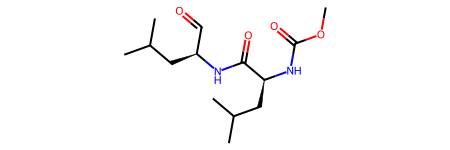

Neobsahuje ring
CC(C)C[C@H](C=O)NC(=O)[C@@H](NS(C)(=O)=O)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

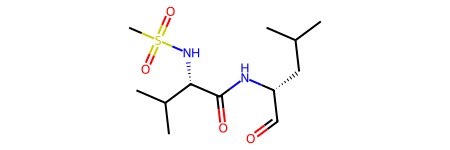

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@@H](CC(C)C)C(=O)N[C@H](C=O)CCCNC(=N)N


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

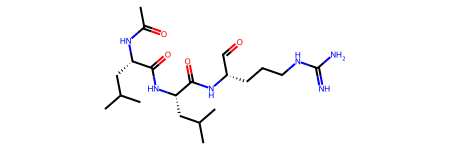

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@H](CC(C)C)C(=O)N[C@@H](C=O)CC(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

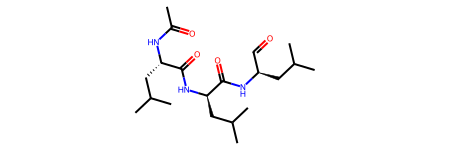

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@H](CC(C)C)C(=O)N[C@@H](C=O)CCCN=C(N)N


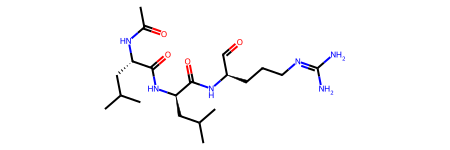

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@H](CC(C)C)C(=O)N[C@H](C=O)CC(C)C


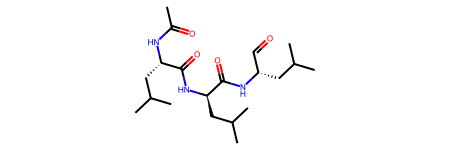

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@H](C=O)CC(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

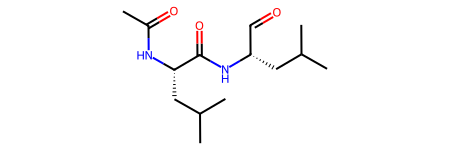

Neobsahuje ring
CC(=O)N[C@@H](C)C(=O)N[C@H](CC(C)C)C(=O)N[C@@H](C=O)CC(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


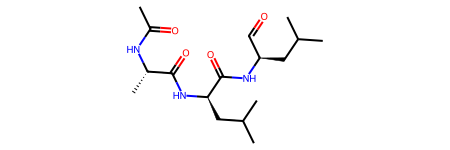

Neobsahuje ring
CSCC[C@@H](C=O)NC(=O)[C@H](CC(C)C)NC(=O)[C@H](CC(C)C)NC(C)=O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

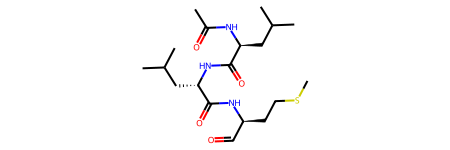

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@@H](COC(C)(C)C)C(=O)N[C@H](CC(C)C)C(=O)N[C@@H](C=O)CC(C)C


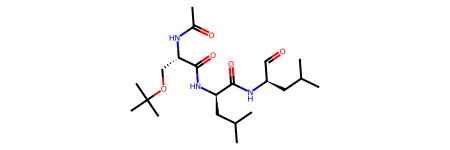

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@H](CC(C)C)C(=O)N[C@@H](C=O)CCCCNC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

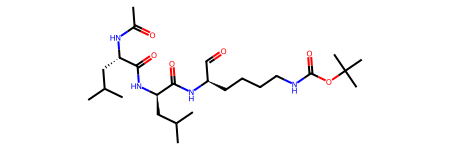

Neobsahuje ring
CCCC[C@H](C=O)NC(=O)[C@@H](CC(C)C)NC(=O)[C@H](CC(C)C)NC(C)=O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

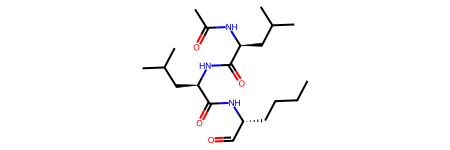

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCNC(=O)CCCNC(=O)[C@H](CC(C)C)NC(=O)OC(C)(C)C


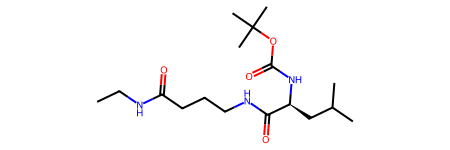

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCNC(=O)CCCNC(=O)[C@H](CC(C)C)NC(=O)N(C)C


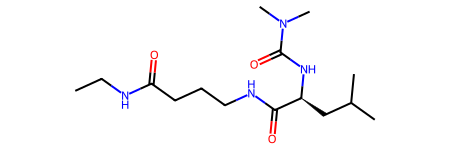

Neobsahuje ring
CCCC[C@H](NC(=O)[C@H](CC(C)C)NC(=O)[C@H](CC(C)C)NC(C)=O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

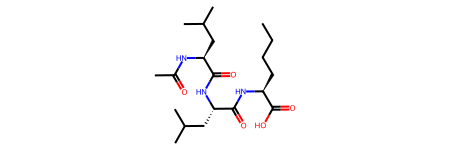

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

12862.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11241.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11968.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

12861.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11871.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

13001.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
C=CC[C@](C)(C(=O)NO)[C@@H](CC(C)C)C(=O)N[C@H](C(=O)NC)C(C)(C)C


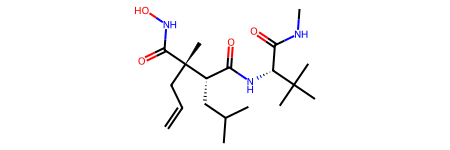

Neobsahuje ring
CCCCCCCCCCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

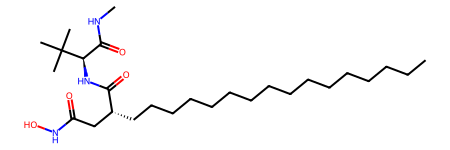

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)P(=O)(O)O


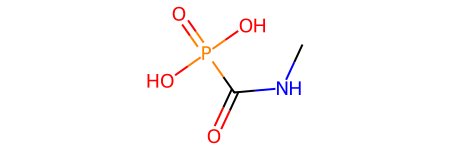

Neobsahuje ring
CNC(=O)C(NC(=O)C(CC(C)C)C(O)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

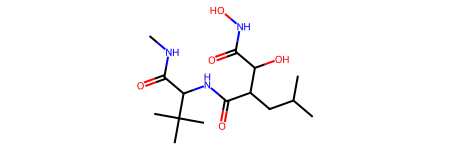

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@@H](CC(=O)NO)CC(C)C)C(C)(C)C


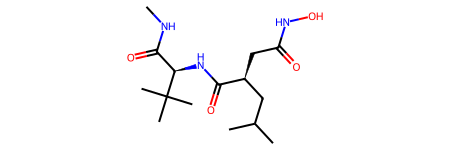

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCCCCCCCCC[C@H](CC(=O)O)C(=O)N[C@H](C(=O)NC)C(C)(C)C


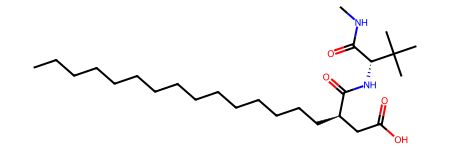

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CCCCCCCCCCCCCCO)CC(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

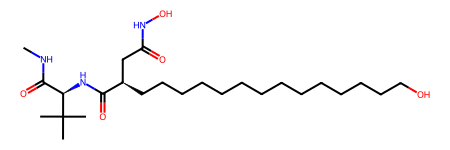

Neobsahuje ring
CCN(CC)C(=O)P(=O)(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

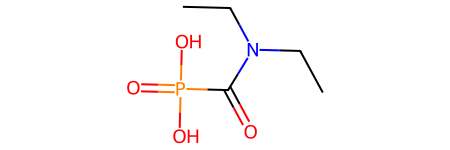

Neobsahuje ring
CCCCCCCCCCCCCCCC[C@H](CC(=O)O)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

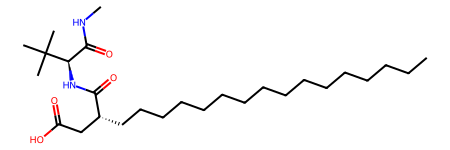

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


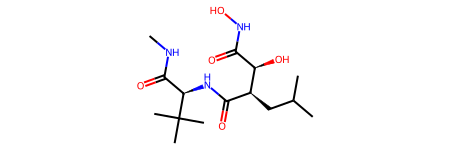

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCCCCCCCC[C@H](CC(=O)O)C(=O)N[C@H](C(=O)NC)C(C)(C)C


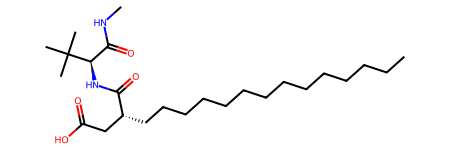

Neobsahuje ring
C=CC[C@H](C(=O)NO)[C@@H](CC(C)C)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

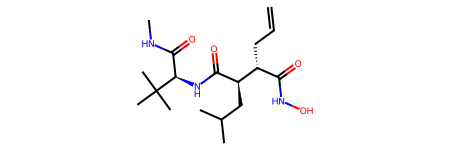

Neobsahuje ring
CNC(=O)C(NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

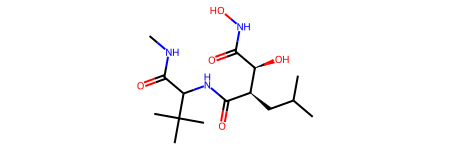

Neobsahuje ring
CCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

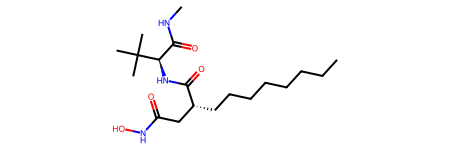

Neobsahuje ring
CCCCCCCC[C@H](CC(=O)O)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

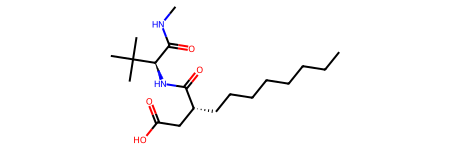

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


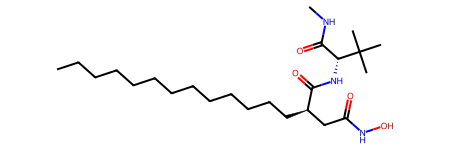

Neobsahuje ring
CC(C)NC(=O)P(=O)(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

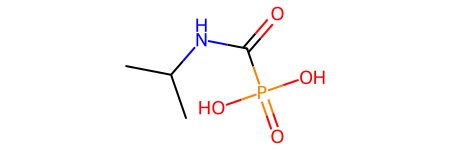

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


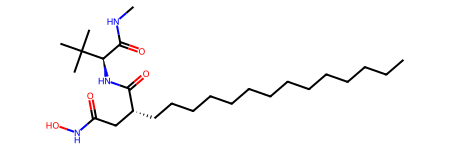

Neobsahuje ring
CCCNC(=O)P(=O)(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

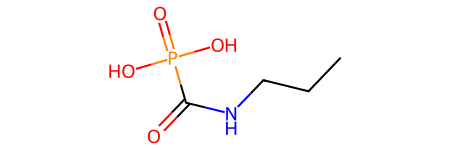

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCCCCCCC[C@H](CC(=O)O)C(=O)N[C@H](C(=O)NC)C(C)(C)C


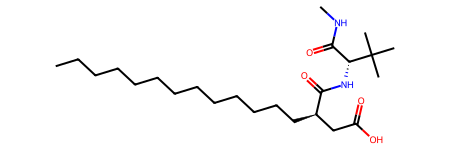

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](CO)C(=O)NO)C(C)(C)C


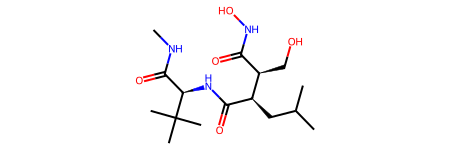

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](CC(C)C)NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO


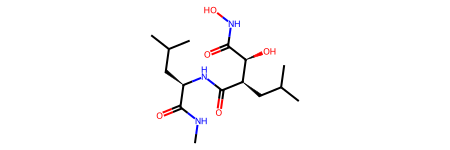

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
O=C(CNS(=O)(=O)C(F)(F)C(F)(F)C(F)(F)C(F)(F)F)NO


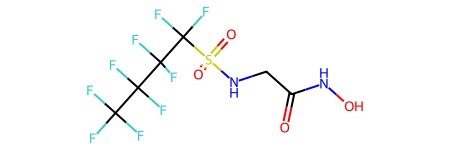

Neobsahuje ring
CC(C)CC(NS(=O)(=O)C(F)(F)C(F)(F)C(F)(F)C(F)(F)F)C(=O)NO


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

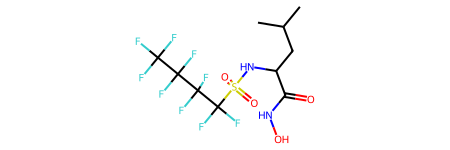

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

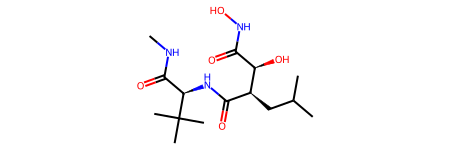

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C(NS(=O)(=O)C(F)(F)C(F)(F)C(F)(F)C(F)(F)F)C(=O)NO


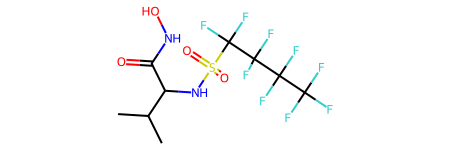

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](CC(C)C)NC(=O)[C@@H](CC(=O)NO)CC(C)C


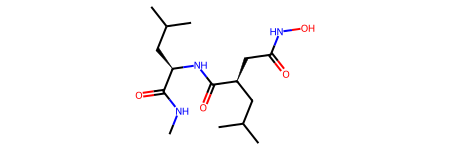

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(NS(=O)(=O)C(F)(F)C(F)(F)C(F)(F)C(F)(F)F)C(=O)NO


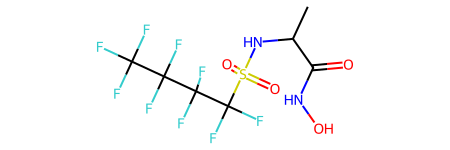

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

105346.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

103991.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11848.csv
Neobsahuje ring
CC[C@@H](C)[C@H](S)C(=O)N[C@@H](C)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

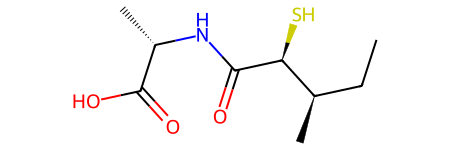

Neobsahuje ring
CC[C@@H](C)[C@H](S)C(=O)NCC(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

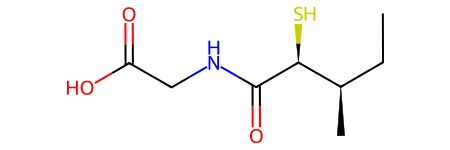

12593.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

12955.csv
Neobsahuje ring
CC(C)C[C@@H](C=O)NC(=O)[C@H](CC(C)C)NS(C)(=O)=O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

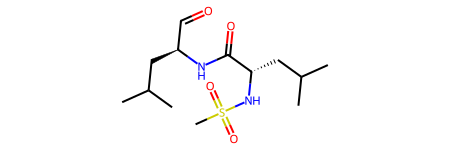

Neobsahuje ring
COC(=O)N[C@@H](CC(C)C)C(=O)N[C@H](C=O)CC(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

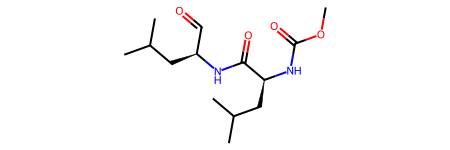

Neobsahuje ring
CC(C)C[C@H](C=O)NC(=O)[C@@H](NS(C)(=O)=O)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

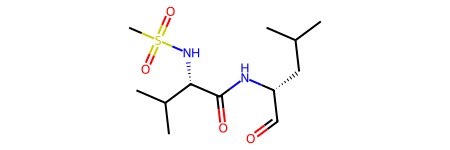

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@@H](CC(C)C)C(=O)N[C@H](C=O)CCCNC(=N)N


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

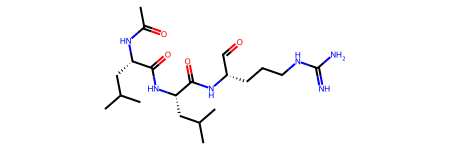

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@H](CC(C)C)C(=O)N[C@@H](C=O)CC(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

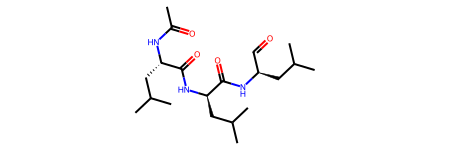

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@H](CC(C)C)C(=O)N[C@@H](C=O)CCCN=C(N)N


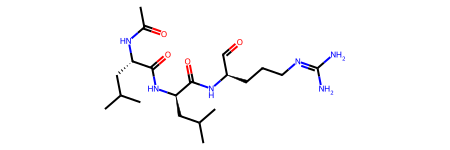

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@H](CC(C)C)C(=O)N[C@H](C=O)CC(C)C


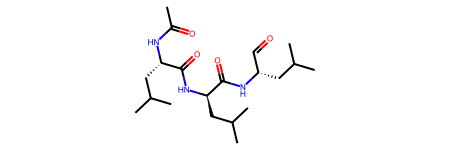

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@H](C=O)CC(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

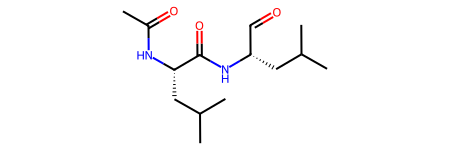

Neobsahuje ring
CC(=O)N[C@@H](C)C(=O)N[C@H](CC(C)C)C(=O)N[C@@H](C=O)CC(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


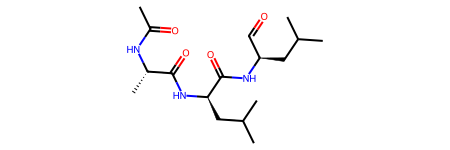

Neobsahuje ring
CSCC[C@@H](C=O)NC(=O)[C@H](CC(C)C)NC(=O)[C@H](CC(C)C)NC(C)=O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

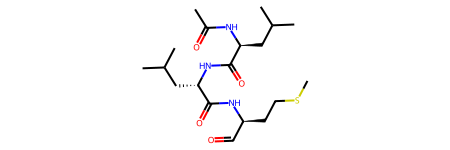

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@@H](COC(C)(C)C)C(=O)N[C@H](CC(C)C)C(=O)N[C@@H](C=O)CC(C)C


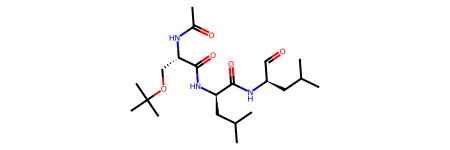

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@H](CC(C)C)C(=O)N[C@@H](C=O)CCCCNC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

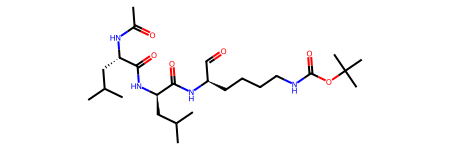

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@H](C=O)NC(=O)[C@@H](CC(C)C)NC(=O)[C@H](CC(C)C)NC(C)=O


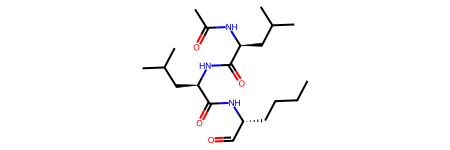

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCNC(=O)CCCNC(=O)[C@H](CC(C)C)NC(=O)OC(C)(C)C


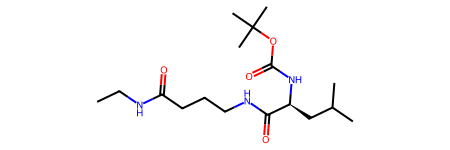

Neobsahuje ring
CCNC(=O)CCCNC(=O)[C@H](CC(C)C)NC(=O)N(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

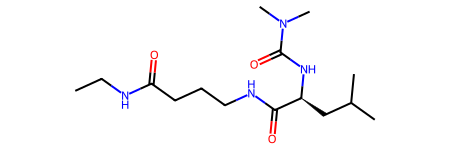

Neobsahuje ring
CCCC[C@H](NC(=O)[C@H](CC(C)C)NC(=O)[C@H](CC(C)C)NC(C)=O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

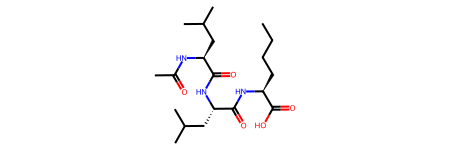

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

100613.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

102753.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

12592.csv
Neobsahuje ring
CCCCCCC[C@H](C[C@@H](O)CS)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

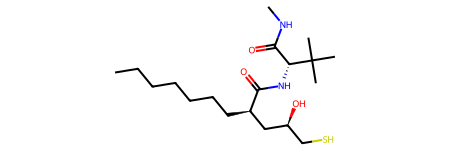

Neobsahuje ring
CCCCCCC[C@H](C[C@H](O)CS)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

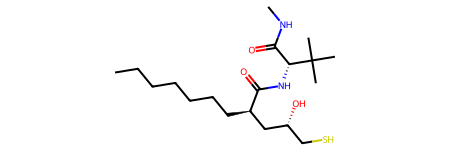

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@@H](CC(=O)NO)CC(C)C)C(C)(C)C


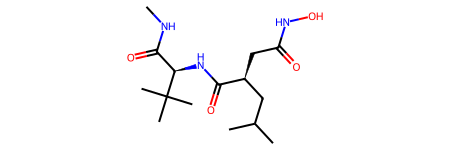

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCC[C@H](C[C@H](O)CS)C(=O)N[C@@H](CC(C)C)C(=O)NC(=O)C(CC(C)C)NCC


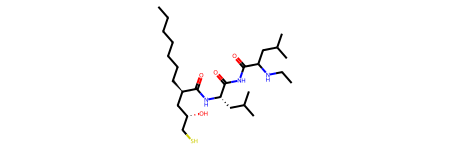

Neobsahuje ring
CCCCCCC[C@H](CC(=O)CS)C(=O)N[C@@H](CC(C)C)C(=O)NC(=O)C(CC(C)C)NCC


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

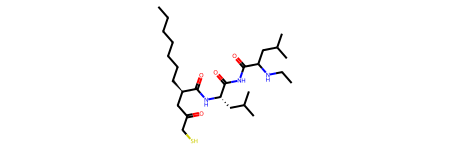

Neobsahuje ring
CNC(=O)[C@H](NC(=O)[C@@H](CC(=O)NO)CC(C)C)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

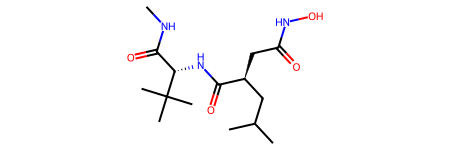

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)C[C@@H](O)CS)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


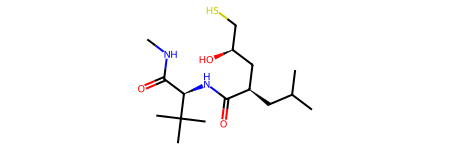

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCC(C(=O)CS)C(=O)N[C@@H](CC(C)C)C(=O)NC(=O)C(CC(C)C)NCC


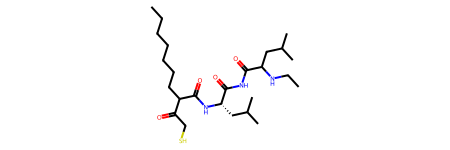

Neobsahuje ring
CNC(=O)[C@H](NC(=O)[C@H](CC(C)C)[C@@H](C)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

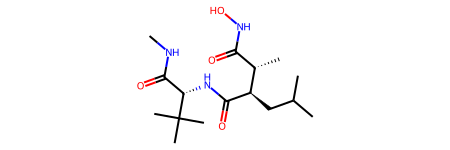

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)C[C@H](O)CS)C(C)(C)C


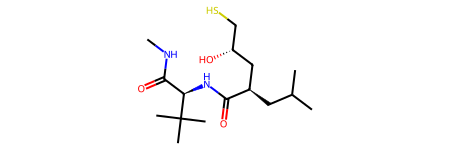

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


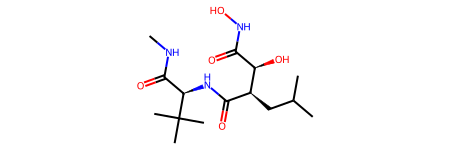

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)C(CC(C)C)C(=O)CS)C(C)(C)C


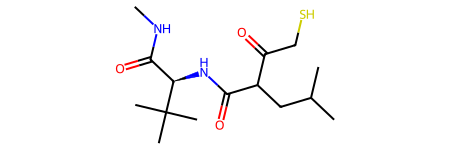

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@@H](CC(=O)CS)CC(C)C)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

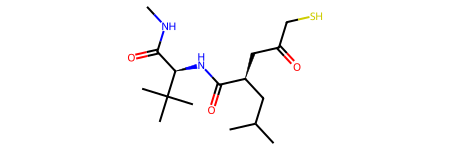

Neobsahuje ring
CNC(=O)C(NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

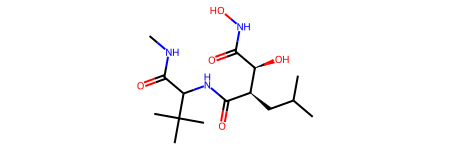

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCC[C@H](CC(=O)CS)C(=O)N[C@H](C(=O)NC)C(C)(C)C


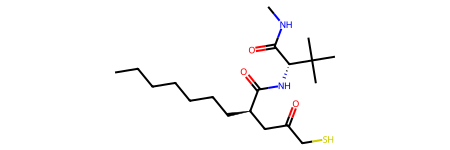

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


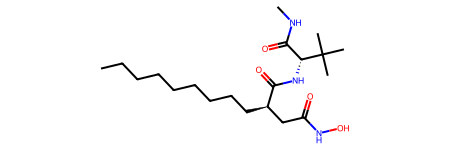

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCC(C(=O)CS)C(=O)N[C@H](C(=O)NC)C(C)(C)C


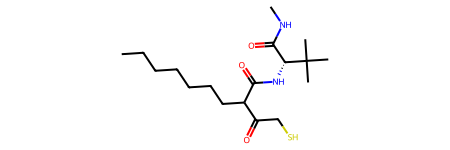

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@@H](CC(=O)NO)CC(C)C)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

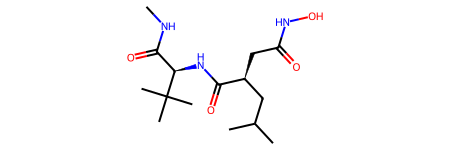

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](CC(C)C)NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO


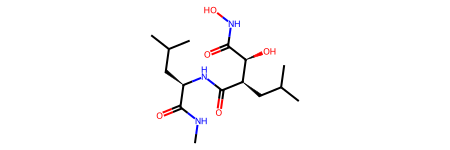

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@@H](C(=O)N[C@H](C(N)=O)C(C)(C)C)[C@H](C)N(O)C=O


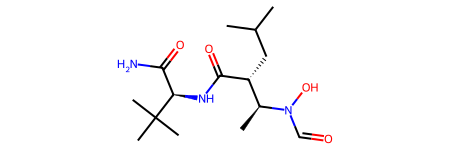

Neobsahuje ring
O=C(CNS(=O)(=O)C(F)(F)C(F)(F)C(F)(F)C(F)(F)F)NO


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

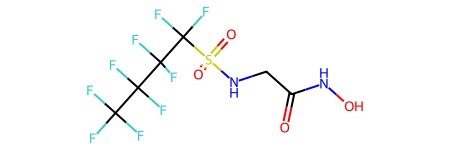

Neobsahuje ring
CC(C)CC(NS(=O)(=O)C(F)(F)C(F)(F)C(F)(F)C(F)(F)F)C(=O)NO


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

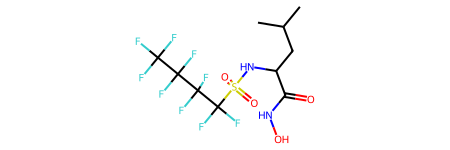

Neobsahuje ring
CCCCC(CC)COCCCNC(=O)C(=O)NO


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

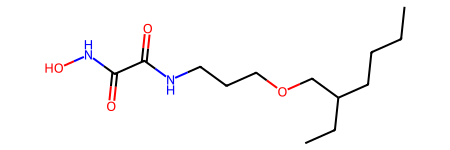

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

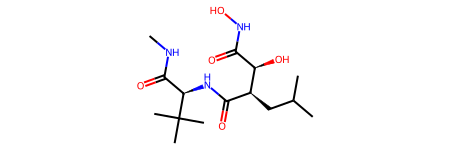

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C(NS(=O)(=O)C(F)(F)C(F)(F)C(F)(F)C(F)(F)F)C(=O)NO


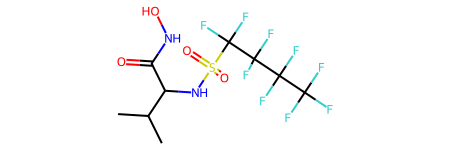

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](CC(C)C)NC(=O)[C@@H](CC(=O)NO)CC(C)C


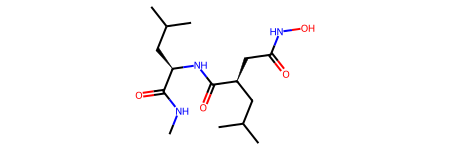

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](C)N(O)C=O)C(C)(C)C


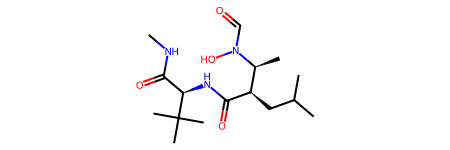

Neobsahuje ring
CC(NS(=O)(=O)C(F)(F)C(F)(F)C(F)(F)C(F)(F)F)C(=O)NO


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

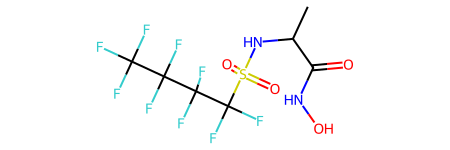

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

20151.csv
Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)C(C)C)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

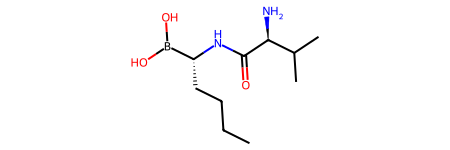

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)[C@H](N)C(=O)N[C@@H](C)B(O)O


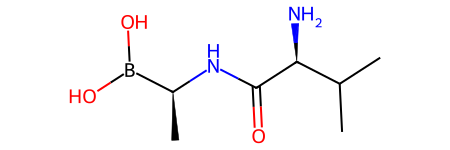

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCCC)B(O)O


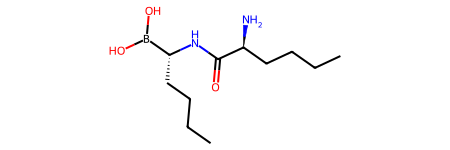

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCCCN)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

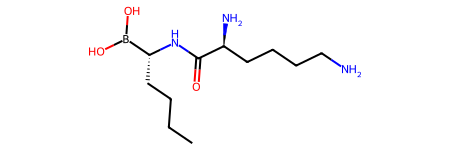

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CC)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

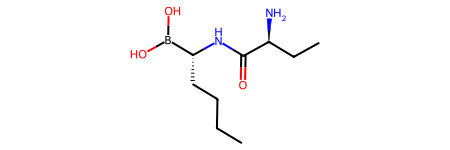

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
C[C@H](NC(=O)[C@@H](N)CCC(N)=O)B(O)O


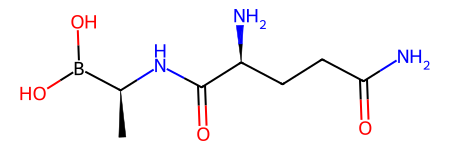

Neobsahuje ring
C[C@H](NC(=O)[C@@H](N)CCC(=O)O)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

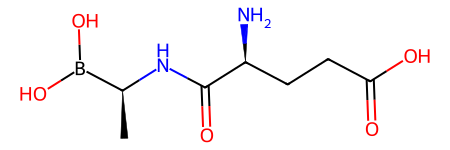

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)[C@H](N)C(=O)N[C@@H](C)B(O)O


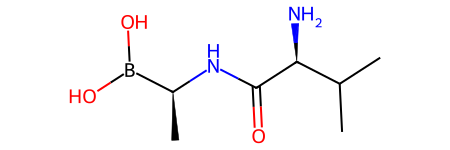

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

105199.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

104219.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

12587.csv
13005.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11727.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCNC(=O)N(C)CCCC/C=C\CCCCCCC(=O)O


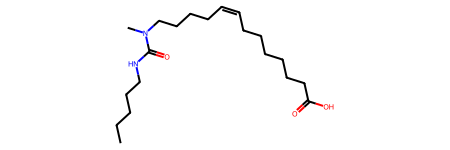

Neobsahuje ring
CCCCCCC(=O)NCCCCCCCC#CCCCC(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

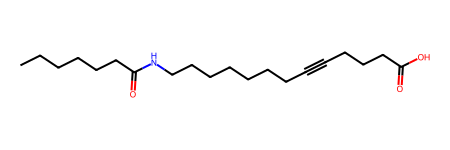

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Nepovedlo se udelat geneticky scaffold
Index 229
O=C(Nc1cccc(S(F)(F)(F)(F)F)c1)NC12CC3CC(CC(C3)O1)C2


[12:06:56] Explicit valence for atom # 8 C, 6, is greater than permitted


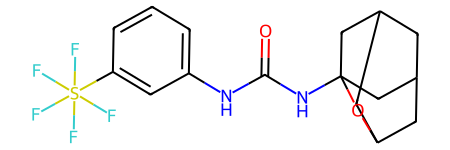

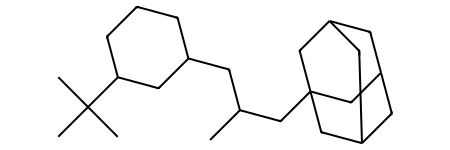

Nepovedlo se udelat generic - murcko scaffold
Index 229
O=C(Nc1cccc(S(F)(F)(F)(F)F)c1)NC12CC3CC(CC(C3)O1)C2


/tmp/ipykernel_11891/1112449295.py:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(mol)
[12:06:56] Explicit valence for atom # 8 C, 6, is greater than permitted


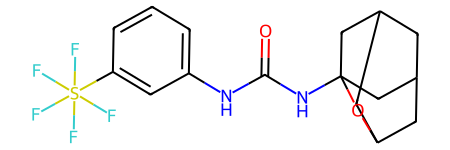

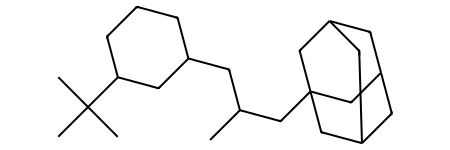

/tmp/ipykernel_11891/1112449295.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_csk'].loc[x] = MurckoScaffoldSmiles(Chem.MolToSmiles(mol))


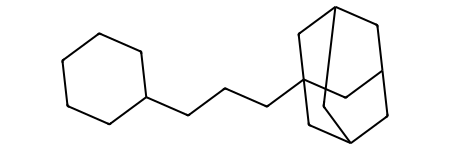

Neobsahuje ring
CCCCCNC(=O)NCCCCC#CCCCCCCC(=O)O


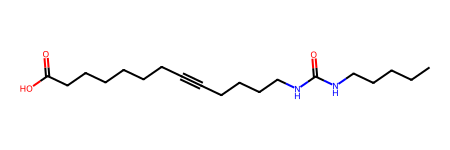

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCNC(=O)NCCCC/C=C\CCCCCCC(=O)N[C@@H](CC(=O)O)C(=O)O


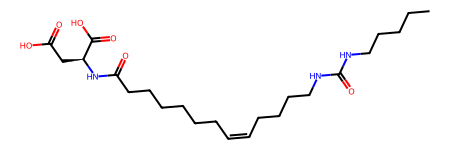

Neobsahuje ring
CCCCCNC(=O)NCCCC/C=C\CCCCCCC(=O)OCCOCCOCCO


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

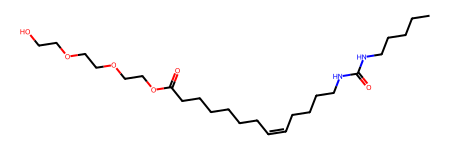

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCNC(=O)NCCCC/C=C\CCCCCCS(=O)(=O)O


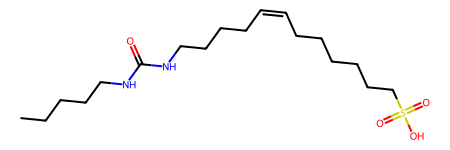

Neobsahuje ring
CCCCNC(=O)NCCCCC/C=C\CCCCCCC(=O)OC


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

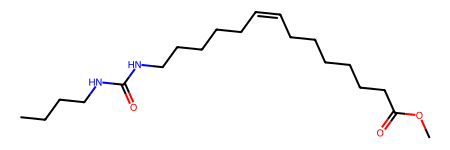

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCNC(=O)NCCCC/C=C\CCCCCCC(=O)O


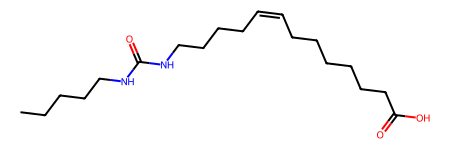

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCNC(=O)NCCCC/C=C\CCCCCCC(=O)N[C@@H](CC(=O)[O-])C(=O)[O-]


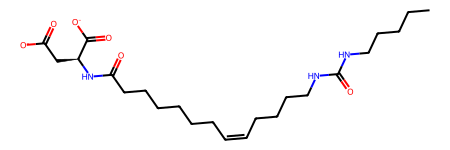

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCNC(=O)NCCCC/C=C\CCCCOCC(=O)O


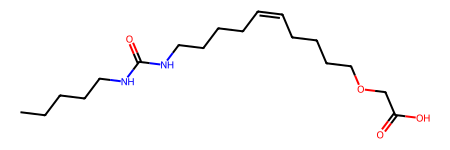

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCC(=O)NCCCC/C=C\CCCCCCC(=O)O


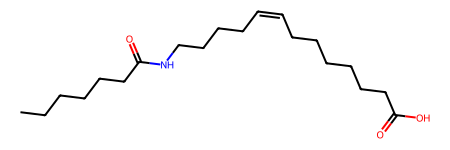

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCNC(=O)NCCCC/C=C\CCCCCCS(=O)(=O)[O-]


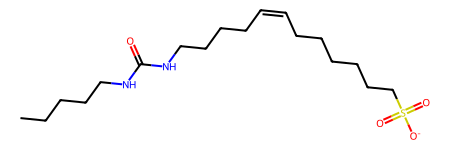

Neobsahuje ring
CCCCCNC(=O)NCCCC/C=C\CCCCCCC(=O)NS(C)(=O)=O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

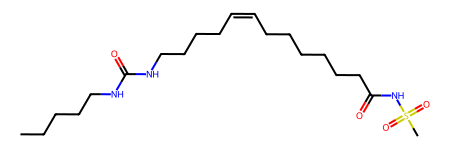

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCNC(=O)CCCC/C=C\CCCCCCC(=O)O


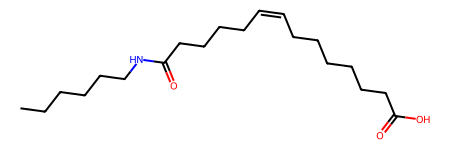

Neobsahuje ring
CCCCCNC(=O)NCCCC/C=C\CCCCCCC(=O)N[C@H](CC(=O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

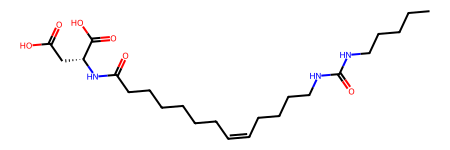

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCNC(=O)NCCCCCCC/C=C\CCCC(=O)O


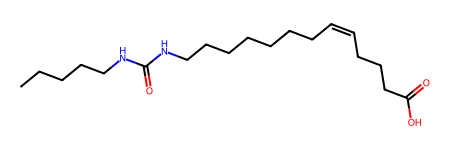

Neobsahuje ring
CCCCCNC(=S)NCCCC/C=C\CCCCCCC(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

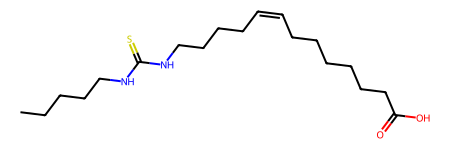

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCNC(=O)NCCC/C=C\CCCCCCC(=O)O


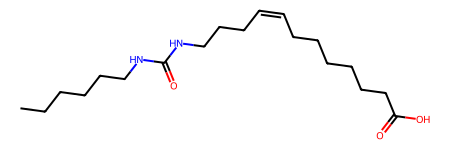

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCNC(=O)NCCCC/C=C/CCCCCCC(=O)O


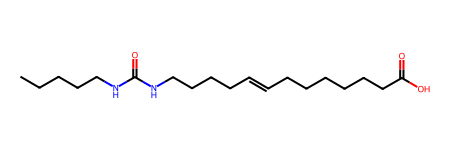

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

10320.csv
10074.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

100186.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

243.csv
Neobsahuje ring
CC(C)CC(N)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

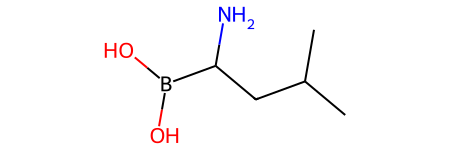

Neobsahuje ring
CSCC(N)CS


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

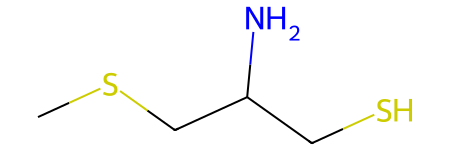

Neobsahuje ring
CSCCC(N)CS


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

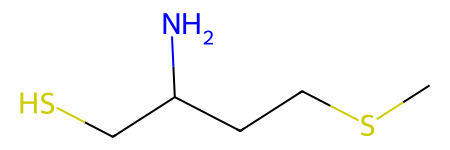

Neobsahuje ring
C[S+]([O-])CCC(N)CS


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

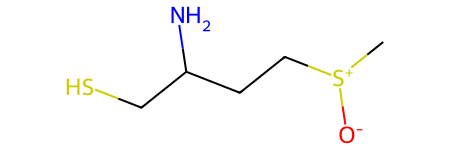

Neobsahuje ring
C[S+]([O-])CC(N)CS


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

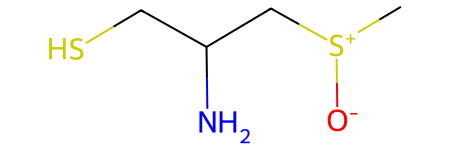

Neobsahuje ring
CC(C)C[C@@H](N)P(=O)(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

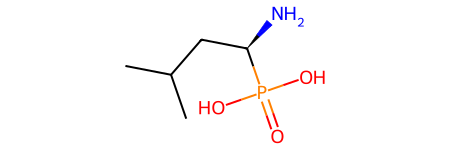

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@@H](N)[C@H](O)C(=O)N[C@H](C(=O)N[C@H](C(=O)N[C@@H](CC(=O)O)C(=O)O)C(C)C)C(C)C


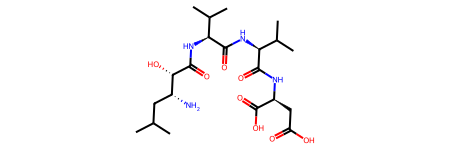

Neobsahuje ring
CSCCC(N)CS


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

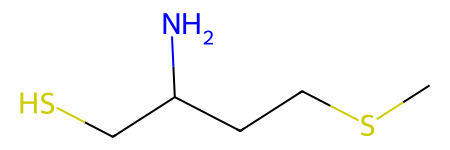

Neobsahuje ring
CCOCC[C@H](N)CS


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

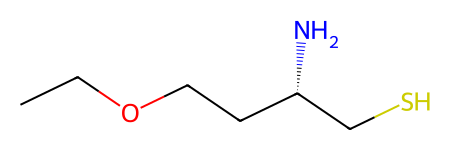

Neobsahuje ring
CC(C)C[C@H](N)P(=O)(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

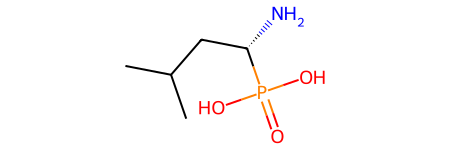

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCOC[C@H](N)CS


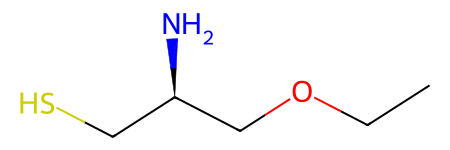

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CSCC[C@H](N)CS


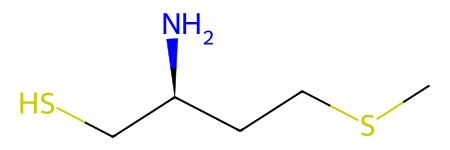

Neobsahuje ring
CCCC[C@H](N)CS


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

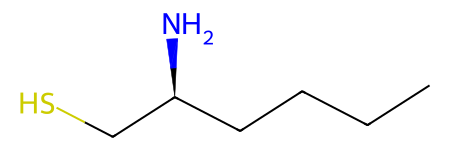

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\


Neobsahuje ring
CCCCCCNCC(N)P(=O)(O)O


/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/ipykernel_11891/1112449295.py:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_csk'].loc[x] = MurckoScaffoldSmiles(\


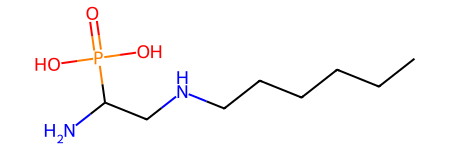

Neobsahuje ring
C[S+]([O-])CC[C@H](N)CS


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

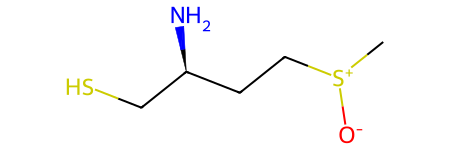

Neobsahuje ring
CC(C)C[C@H](N)[C@@H](O)C(=O)N[C@@H](C(=O)N[C@@H](C(=O)N[C@H](CC(=O)O)C(=O)O)C(C)C)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

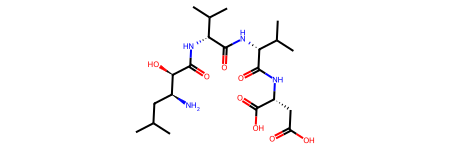

Neobsahuje ring

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/


N[C@H](CS)CCC(=O)O


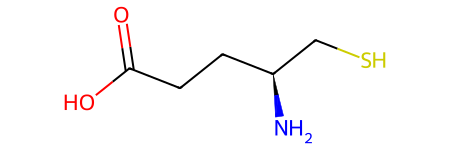

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
COCC[C@H](N)CS


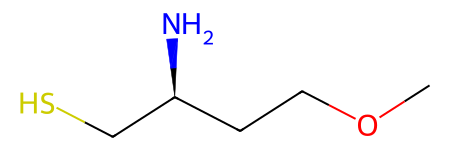

10331.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

10684.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

23.csv
Neobsahuje ring
CC(C)C(NC(=O)CNC(=O)[C@@H](NC(=O)OC(C)(C)C)C(C)C)C(=O)C(F)(F)F


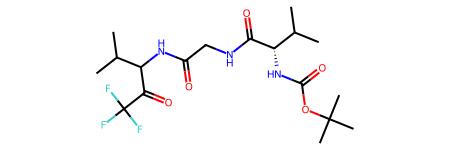

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@@H](CC(=O)N[C@@H](CO)C(=O)O)C(=O)O


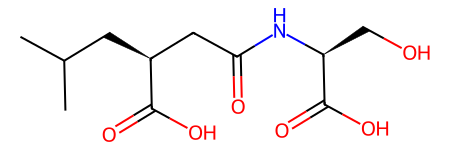

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@@H](CC(=O)O)C(=O)N[C@@H](CO)C(=O)O


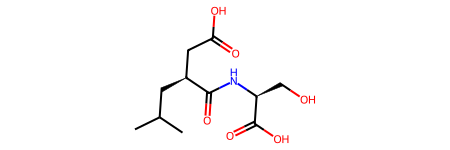

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC[C@@H](C)[C@H](S)C(=O)N[C@@H](C)C(=O)O


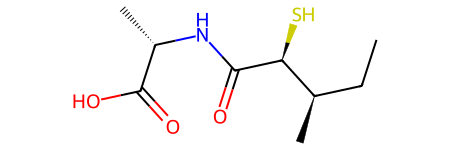

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
C[C@H](N)C(=O)CCCC[C@@H](C)C(=O)O


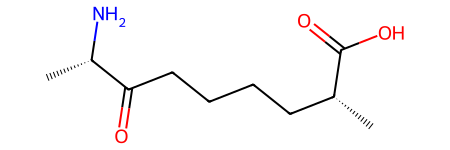

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

194.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
NC(N)=NCCC[C@@H](C=O)NC(=O)CNC(=O)[C@H](N)CCCN=C(N)N


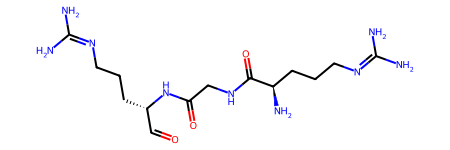

Neobsahuje ring
N=C(N)NCCC[C@@H](C=O)NC(=O)CNC(=O)[C@@H](CCCNC(=N)N)NC(=O)CCC(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

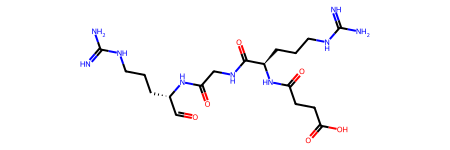

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
C[C@H](NC(=O)[C@@H](CCCN=C(N)N)NC(=O)OC(C)(C)C)C(=O)N[C@H](C=O)CCCN=C(N)N


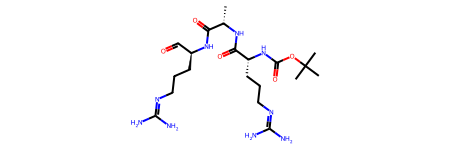

Neobsahuje ring
N=C(N)NCCC[C@@H](C=O)NC(=O)CNC(=O)[C@@H](CCCNC(=N)N)NC(=O)CC(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

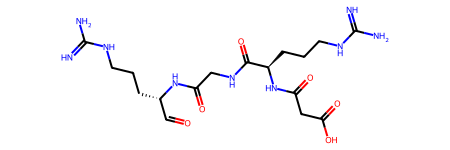

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)(C)OC(=O)N[C@H](CCCCN=C(N)N)C(=O)NCC(=O)N[C@H](C=O)CCCN=C(N)N


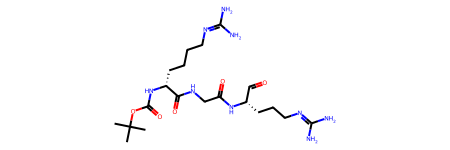

Neobsahuje ring
C[C@@H](NC(=O)[C@@H](CCCN=C(N)N)NC(=O)OC(C)(C)C)C(=O)N[C@H](C=O)CCCN=C(N)N


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

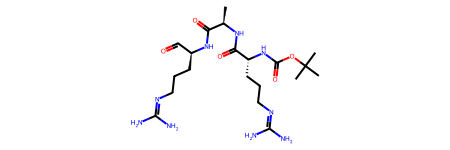

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)(C)OC(=O)N[C@H](CCCN=C(N)N)C(=O)NC(C)(C)C(=O)N[C@H](C=O)CCCN=C(N)N


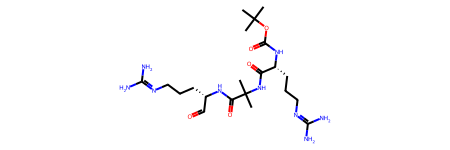

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=N)NCCC[C@@H](NC(=O)OC(C)(C)C)C(=O)NCC(=O)N[C@H](C=O)CCCN=C(N)N


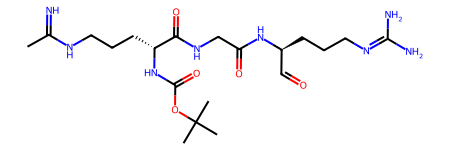

Neobsahuje ring
N=C(N)NCCC[C@@H](C=O)NC(=O)CNC(=O)[C@@H](CCCNC(=N)N)NC(=O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

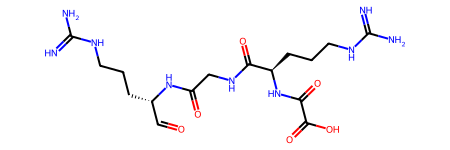

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCOC(=O)N[C@H](CCCN=C(N)N)C(=O)NCC(=O)N[C@H](C=O)CCCN=C(N)N


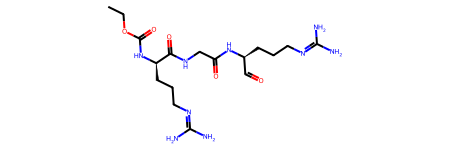

Neobsahuje ring
CC(C)(C)OC(=O)N[C@H](CCCN=C(N)N)C(=O)NCC(=O)N[C@H](C=O)CCCN=C(N)N


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

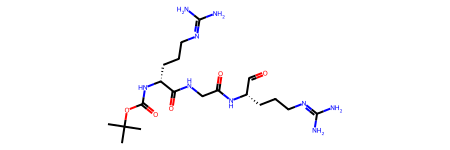

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@@H](CCC(N)=O)C(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@@H](CO)C(=O)N[C@H](C=O)CCCNC(=N)N


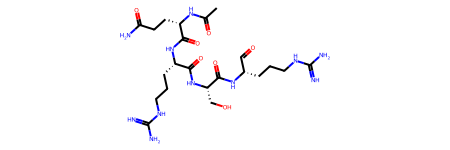

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

100624.csv
Neobsahuje ring
CCCCC(=O)NCC(=O)N[C@@H](CC(C)C)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

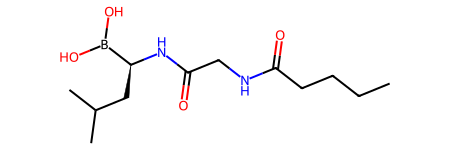

Neobsahuje ring
CC(=O)N[C@@H](CCC(=O)OC(C)(C)C)C(=O)N[C@@H](C)C(=O)N[C@H](/C=C/S(C)(=O)=O)CC(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

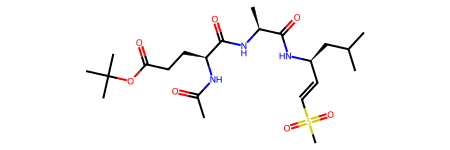

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@H](NC(=O)CNC(=O)CC(C)(C)C)B(O)O


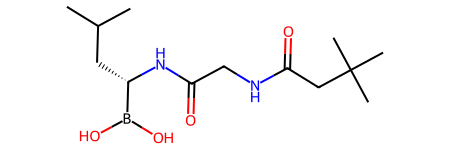

Neobsahuje ring
CCC(=O)NCC(=O)N[C@@H](CC(C)C)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

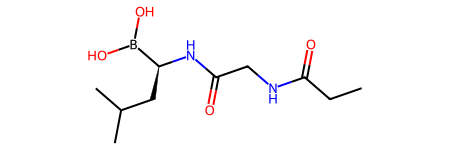

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC(=O)NCC(=O)N[C@@H](CC(C)C)B(O)O


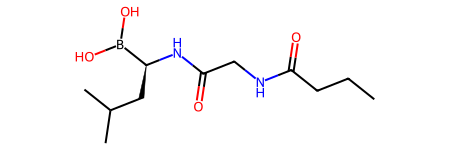

Neobsahuje ring
CC(C)CC(=O)NCC(=O)N[C@@H](CC(C)C)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

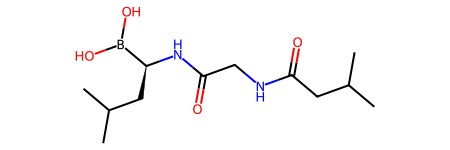

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCC(=O)NCC(=O)N[C@@H](CC(C)C)B(O)O


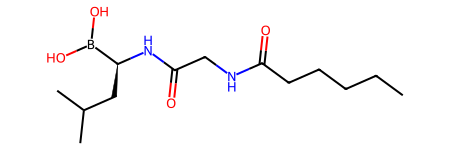

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

12703.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

10244.csv
Neobsahuje ring
CC[C@H](C)[C@H](NC(C)=O)C(=O)N[C@@H](CCC(=O)O)C(=O)N[C@H](C(=O)N[C@H](C=O)CC(=O)O)[C@@H](C)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

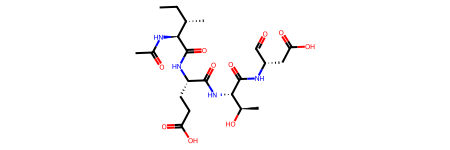

Neobsahuje ring
CC(=O)N[C@@H](CC(=O)O)C(=O)N[C@@H](CCC(=O)O)C(=O)N[C@H](C(=O)N[C@H](C=O)CC(=O)O)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

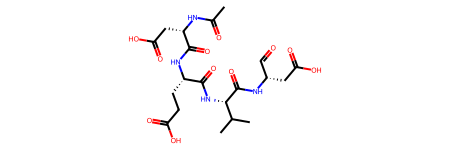

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

12738.csv
Neobsahuje ring
C=CC[C@H](C(=O)NO)[C@@H](CC(C)C)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

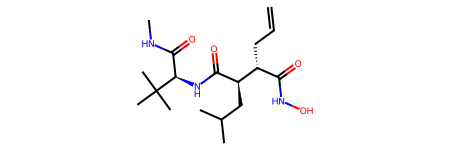

Neobsahuje ring
CNC(=O)C(NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

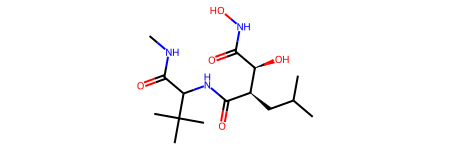

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CCCCCCCCCCCCCCO)CC(=O)NO)C(C)(C)C


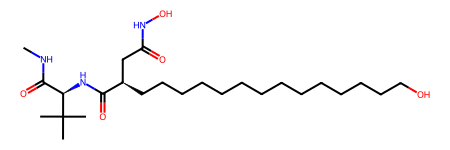

Neobsahuje ring
CCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

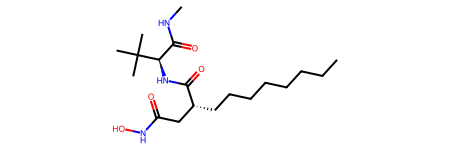

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


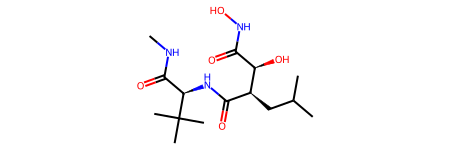

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

10498.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@H](CC(=O)NO)C(=O)N[C@@H](CC(C)C)C(=O)N[C@@H](C)C=O


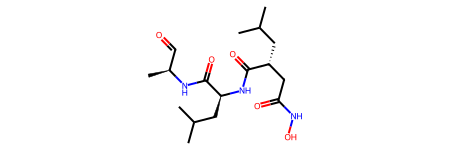

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)CC(=O)N[C@H](C(=O)N[C@H](C(=O)N[C@@H](CC(C)C)[C@@H](O)CC(=O)N[C@@H](C)C(=O)N[C@@H](CC(C)C)[C@@H](O)CC(=O)O)C(C)C)C(C)C


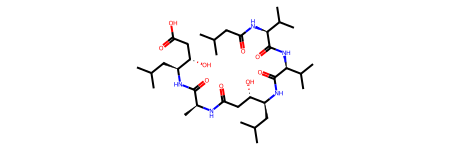

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@@H](CC(C)C)C(=O)N[C@H](C=O)CCCNC(=N)N


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

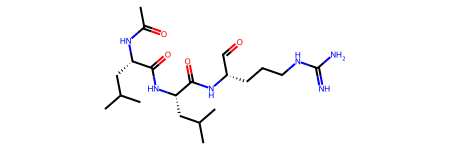

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@@H](CC(C)C)C(=O)N[C@@H](CCCN=C(N)N)C(=O)C=O


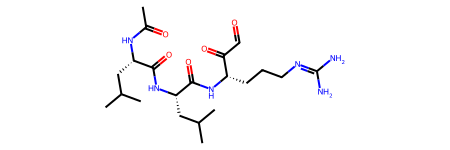

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

235.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C(NC(=O)CNC(=O)[C@@H](NC(=O)OC(C)(C)C)C(C)C)C(=O)C(F)(F)F


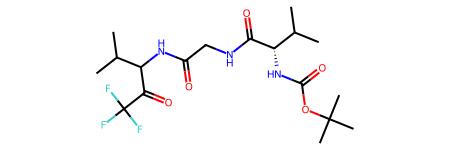

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11192.csv
Neobsahuje ring
CC(C)C[C@H](C(=O)NO)C(=O)N[C@@H](C)C(=O)NCC(N)=O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

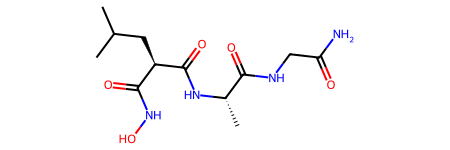

Neobsahuje ring
CC(C)C(C(=O)NO)C(=O)NCCC(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

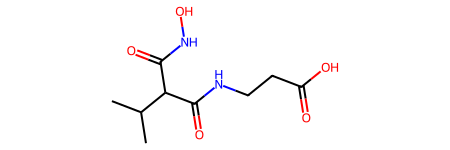

Neobsahuje ring
CC(C)C(C(=O)NO)C(=O)NC(CC(N)=O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

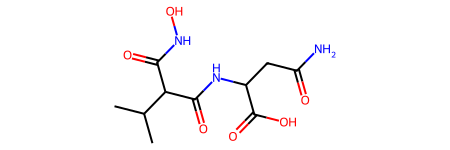

Neobsahuje ring
CC(C)C(C(=O)NO)C(=O)NCC(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

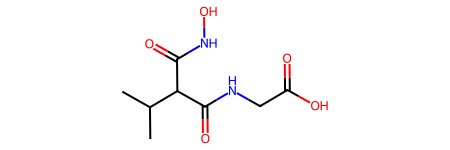

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C(CC(=O)NO)C(=O)NC(CC(N)=O)C(=O)O


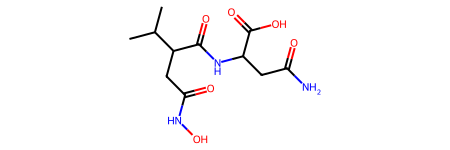

Neobsahuje ring
CC(C)C(CC(=O)NO)C(=O)NCCC(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

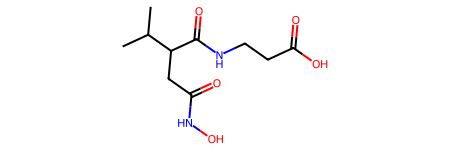

11534.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@H](NC(=O)OC(C)(C)C)C(=O)NCC#N


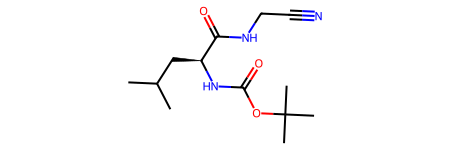

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CSCC[C@H](NC(=O)OC(C)(C)C)C(=O)NCC#N


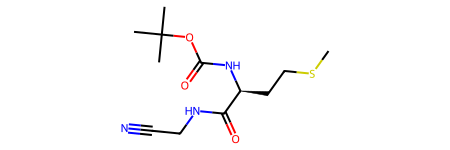

Neobsahuje ring
CCC[C@H](NC(=O)OC(C)(C)C)C(=O)NCC#N


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

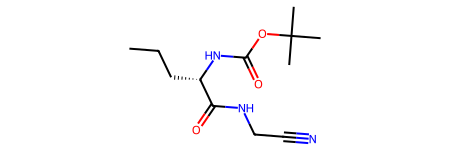

Neobsahuje ring
CCCC[C@H](NC(=O)OC(C)(C)C)C(=O)NCC#N


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

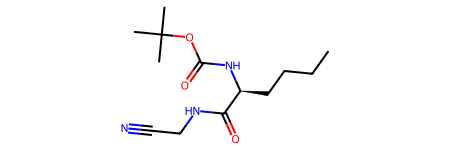

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

12252.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@H](NC(=O)[C@H](CC(N)=O)NC(=O)[C@@H](NC(=O)[C@@H](N)CCC(=O)O)C(C)C)[C@@H](O)C[C@@H](C)C(=O)N[C@@H](C)C(=O)O


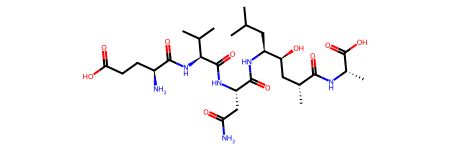

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCNC(=O)[C@H](C)C[C@H](O)[C@H](CC(C)C)NC(=O)[C@H](C)N(C)C(=O)[C@H](CC(C)C)NC(C)=O


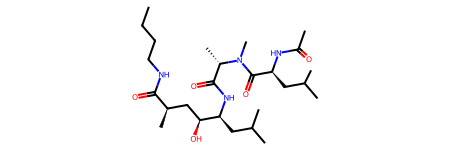

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@H](NC(=O)[C@H](CC(N)=O)NC(=O)[C@@H](NC(=O)[C@@H](N)CCC(=O)O)C(C)C)[C@@H](O)CC(=O)N[C@H](C(=O)N[C@@H](C)C(=O)N[C@@H](CCC(=O)O)C(N)=O)C(C)C


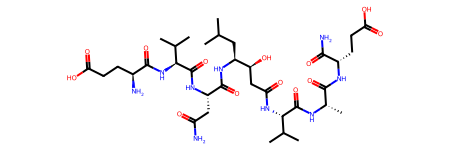

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CSCC[C@H](NC(=O)[C@@H](NC(C)=O)C(C)C)C(=O)NC(CC(C)C)C(O)CC(=O)N[C@H](C(=O)N[C@@H](C)C(=O)N[C@@H](CCC(=O)O)C(=O)O)C(C)C


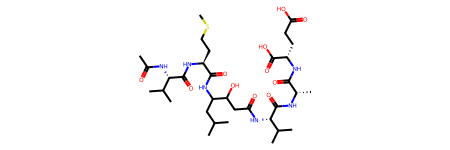

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCNC(=O)[C@H](C)C[C@H](O)[C@H](CC(C)C)NC(=O)[C@H](CCSC)NC(=O)[C@@H](NC(C)=O)C(C)C


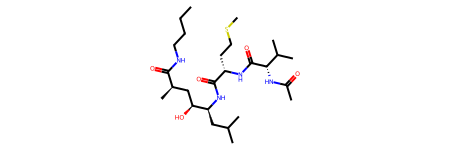

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCNC(=O)[C@H](C)C[C@H](O)[C@H](CC(C)C)NC(=O)[C@H](C)NC(=O)[C@H](CC(C)C)NC(C)=O


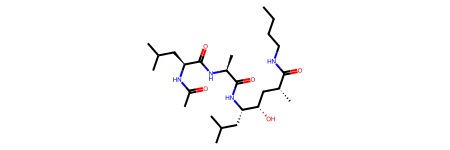

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@H](NC(=O)[C@H](CC(N)=O)NC(=O)[C@@H](NC(=O)[C@@H](N)CCC(=O)O)C(C)C)[C@@H](O)CC(=O)N[C@H](C(=O)N[C@@H](C)C(N)=O)C(C)C


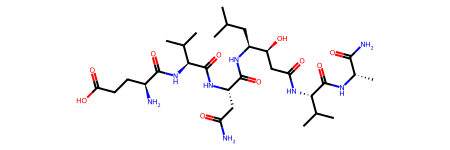

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCNC(=O)[C@H](C)C[C@H](O)[C@H](CC(C)C)NC(=O)[C@H](CCSC)NC(=O)[C@H](CC(C)C)NC(C)=O


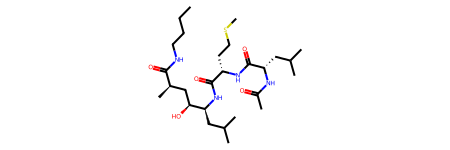

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CSCC[C@H](NC(=O)[C@@H](NC(=O)OC(C)(C)C)C(C)C)C(=O)N[C@@H](CC(C)C)[C@@H](O)C[C@@H](C)C(=O)N[C@H](C(=O)NCC(C)C)C(C)C


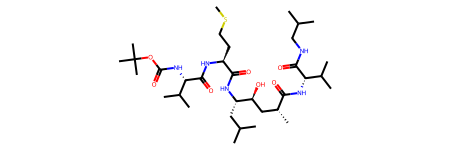

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

100633.csv
10131.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
COC(=O)N[C@H](C(=O)NC(CC(=O)O)C(=O)CF)C(C)C


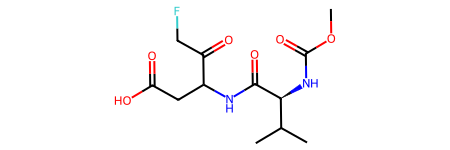

Neobsahuje ring
CC(=O)N[C@@H](CC(=O)O)C(=O)N[C@@H](CCC(=O)O)C(=O)N[C@H](C(=O)N[C@H](CC=O)CC(=O)O)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

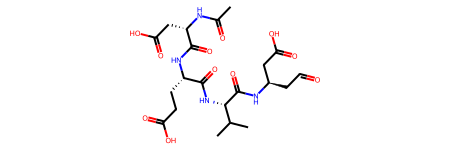

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@H](C(=O)NC(CC(=O)O)C(=O)CF)C(C)C


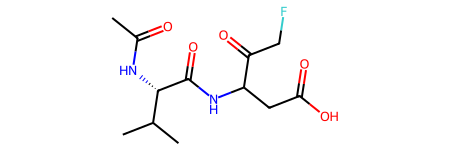

Neobsahuje ring
CC(C)COC(=O)N[C@H](C(=O)NC(CC(=O)O)C(=O)CF)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

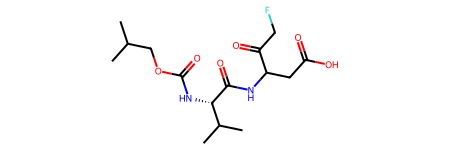

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCC(=O)N[C@H](C(=O)NC(CC(=O)O)C(=O)CF)C(C)C


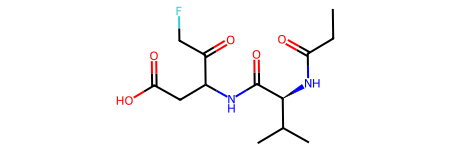

Neobsahuje ring
CC(=O)N[C@@H](CC(=O)O)C(=O)N[C@@H](CCC(=O)O)C(=O)N[C@H](C(=O)N[C@H](C=O)CC(=O)O)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

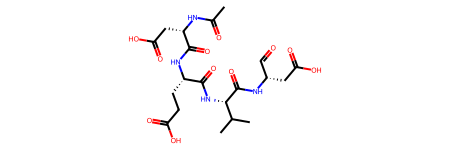

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)[C@H](NC(=O)CCC(=O)O)C(=O)NC(CC(=O)O)C(=O)CF


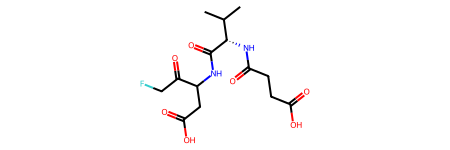

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@@H](CC(=O)O)C(=O)N[C@@H](CC(=O)O)C(=O)N[C@H](C(=O)N[C@H](C=O)CC(=O)O)C(C)C


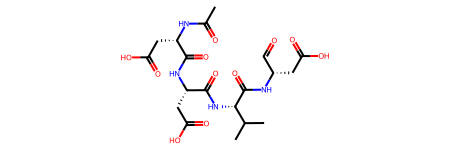

Neobsahuje ring
CC(=O)N[C@@H](CC(=O)O)C(=O)N[C@@H](CCC(=O)O)C(=O)N[C@H](C(=O)N[C@@H](CC(=O)O)C(=O)C=O)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

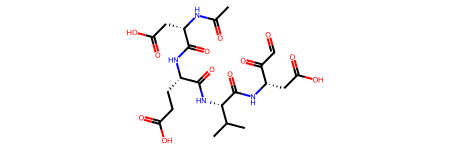

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11140.csv
Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCC)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

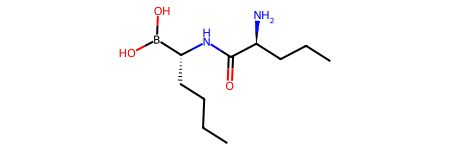

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCCC)B(O)O


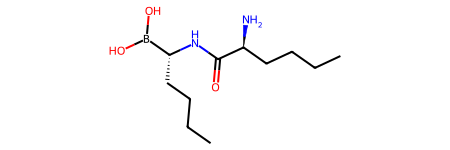

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
C[C@H](NC(=O)[C@H](C)N)B(O)O


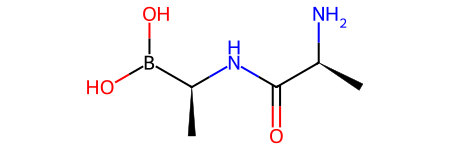

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)[C@H](N)C(=S)N[C@@H](C)B(O)O


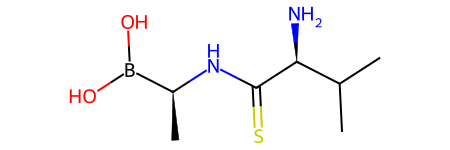

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)[C@H](N)C(=O)N[C@@H](C)B(O)O


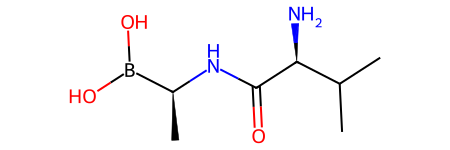

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
C[C@H](NC(=O)[C@@H](N)CCC(=O)O)B(O)O


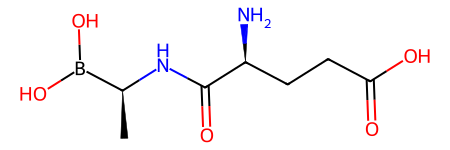

Neobsahuje ring
CCN(CC#N)C(=O)[C@@H](N)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

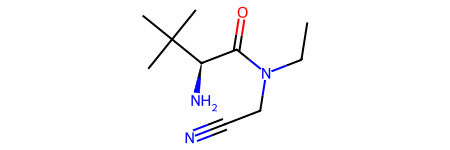

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
C[C@H](NC(=O)[C@@H](N)CCC(N)=O)B(O)O


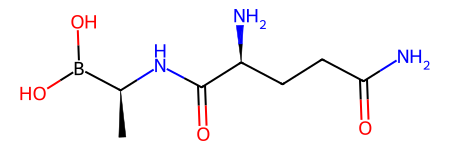

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
C=CCN(CC#N)C(=O)[C@@H](N)C(C)(C)C


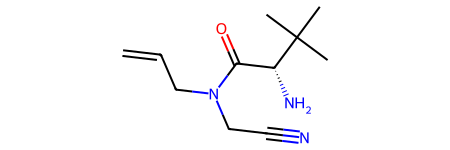

Neobsahuje ring
CN(CC#N)C(=O)[C@@H](N)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

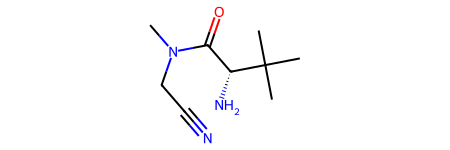

Neobsahuje ring
CC(C)[C@H](N)C(=O)N[C@@H](C)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

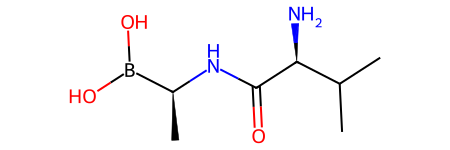

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
C[C@@H](C#N)N(C)C(=O)[C@@H](N)C(C)(C)C


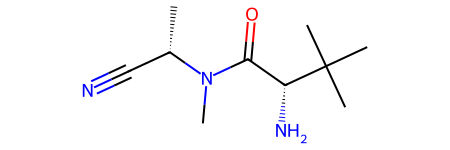

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)[C@H](N)C(=O)N(C)CC#N


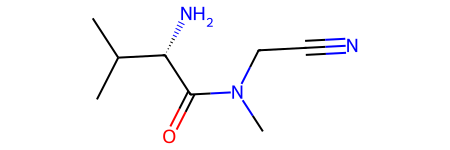

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

12268.csv
Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCC)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

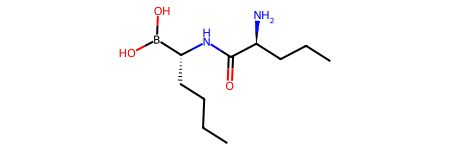

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)C(C)C)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

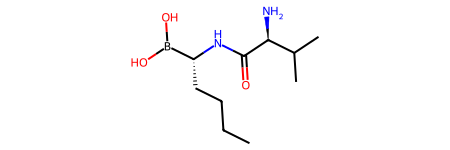

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCCN)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

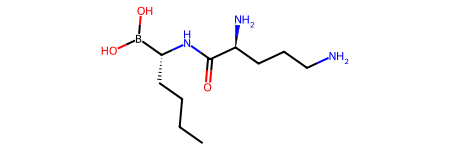

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCN)B(O)O


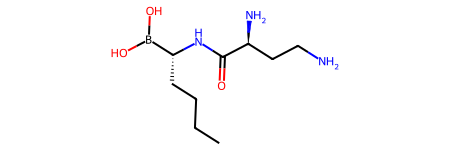

Neobsahuje ring
CC(C)[C@H](N)C(=O)N[C@@H](C)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

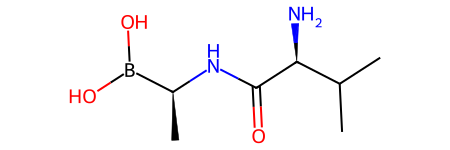

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@H](C)N)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

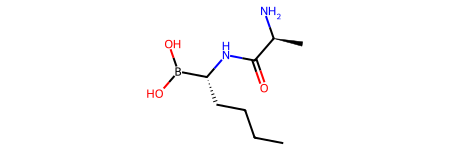

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCCC)B(O)O


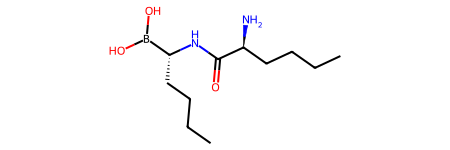

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCCCN)B(O)O


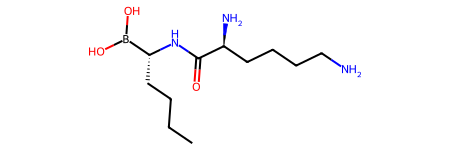

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CC)B(O)O


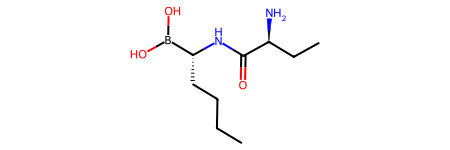

Neobsahuje ring
CCCC[C@H](NC(=O)[C@@H](N)CCN)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

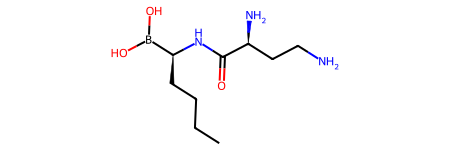

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CN)B(O)O


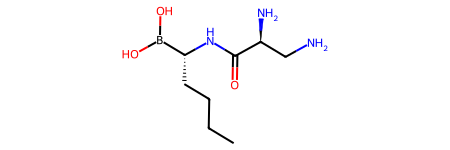

12013.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@@H](NC(C)=O)C(C)C)C(=O)N[C@H](C=O)CC(=O)O


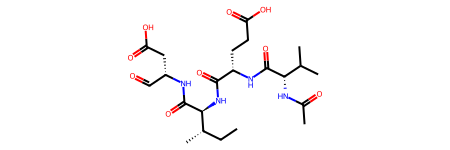

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

20154.csv
Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCC)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

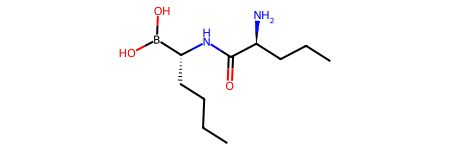

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)C(C)C)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

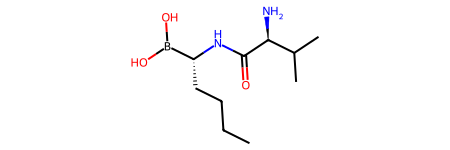

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCCN)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

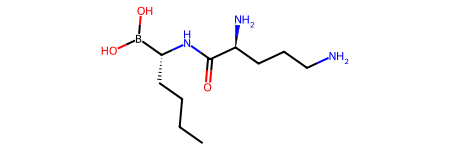

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCN)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

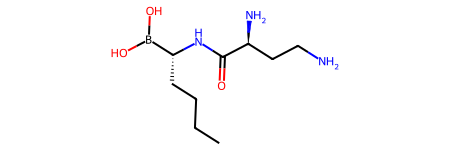

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCCC)B(O)O


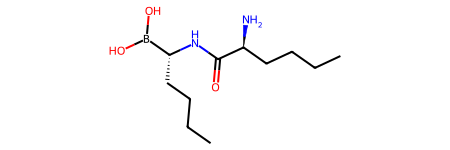

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCCCN)B(O)O


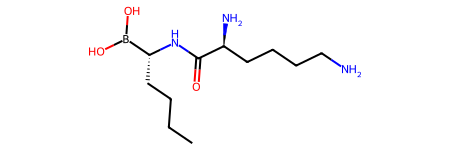

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CC)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

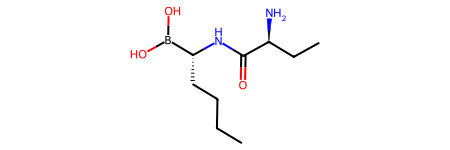

Neobsahuje ring
CCCC[C@H](NC(=O)[C@@H](N)CCN)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

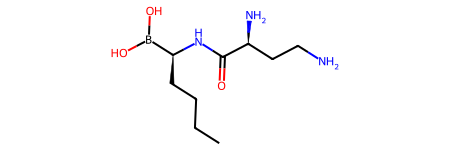

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)[C@H](N)C(=O)N[C@@H](C)B(O)O


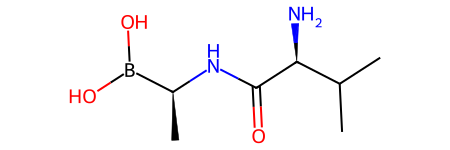

Neobsahuje ring
C[C@H](NC(=O)[C@@H](N)CCC(N)=O)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

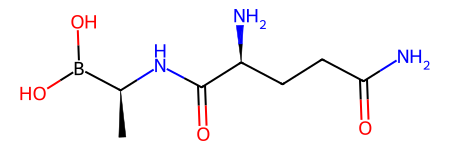

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

193.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

105196.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11402.csv
Neobsahuje ring
N=C(N)NCCC[C@H](NC(=O)[C@H](CCCNC(=N)N)NC(=O)[C@H](CCCNC(=N)N)NC(=O)[C@H](CCCNC(=N)N)NC(=O)[C@@H](N)CCCNC(=N)N)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

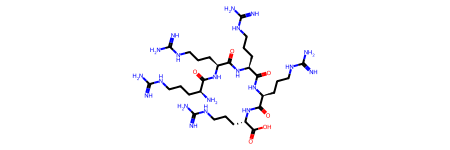

Neobsahuje ring
C[C@H](N)C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@H](C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCNC(=N)N)C(=O)O)[C@@H](C)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

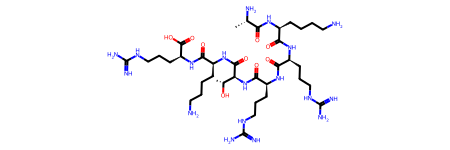

Neobsahuje ring
COC(=O)[C@@H](CC(C)C)NC(=O)CNC(=O)[C@H](NC(=O)CCC(=O)[C@H](CCCN=C(N)N)NC(=O)[C@H](CCCCN)NC(=O)[C@@H](NC(=O)[C@H](CCCN=C(N)N)NC(C)=O)C(C)C)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

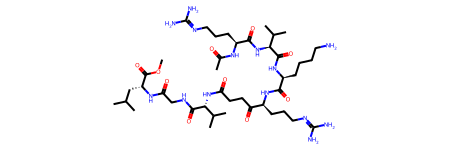

Neobsahuje ring
CC(C)C[C@H](NC(=O)[C@@H](N)CC(C)C)C(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@H](C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCNC(=N)N)C(=O)O)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


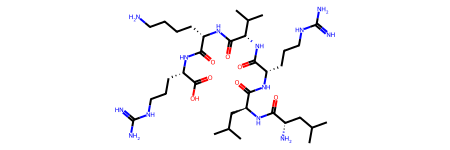

Neobsahuje ring
N=C(N)NCCC[C@H](NC(=O)[C@H](CCCNC(=N)N)NC(=O)[C@H](CCCNC(=N)N)NC(=O)[C@H](CCCNC(=N)N)NC(=O)[C@H](CCCNC(=N)N)NC(=O)[C@@H](N)CCCNC(=N)N)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

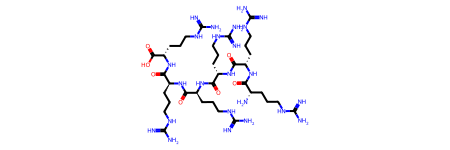

Neobsahuje ring
CC(C)[C@H](N)C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@H](C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCNC(=N)N)C(=O)O)[C@@H](C)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


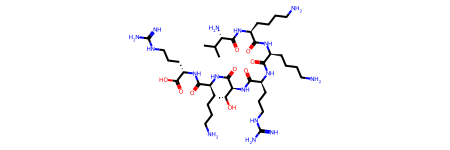

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@@H](CC(C)C)C(=O)N[C@@H](CC(C)C)C(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@H](C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCNC(=N)N)C(N)=O)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


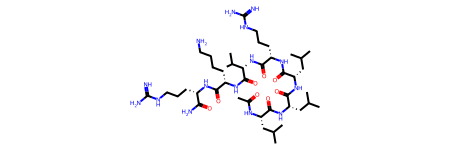

Neobsahuje ring
CCCCCCCCCCN[C@@H](CCCN=C(N)N)C(=O)N[C@H](C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCN=C(N)N)C(=O)CN[C@@H](C)C(=O)N[C@H](C(=O)NCC(=O)OC)C(C)C)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

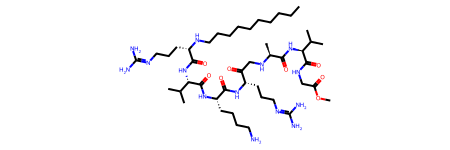

Neobsahuje ring
CCCCCCCCCCN[C@@H](CCCN=C(N)N)C(=O)N[C@H](C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCN=C(N)N)C(=O)CCC(=O)N[C@@H](C(=O)NCC(=O)OC)C(C)C)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


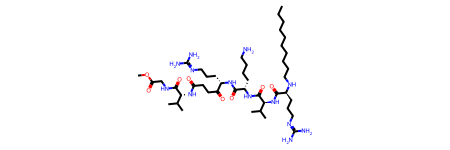

Neobsahuje ring
CC(C)C[C@H](N)C(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@H](C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCNC(=N)N)C(=O)O)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

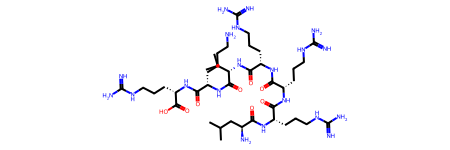

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@H](NC(=O)[C@@H](N)CC(C)C)C(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@@H](C)C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCNC(=N)N)C(=O)O


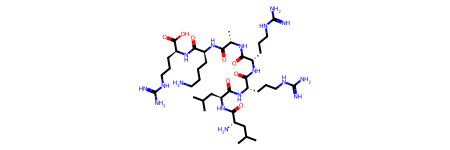

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)[C@H](N)C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@H](C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCNC(=N)N)C(=O)O)C(C)C


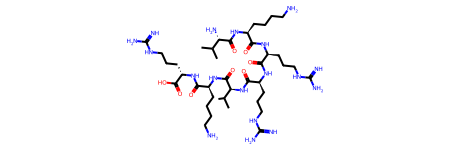

Neobsahuje ring
CCCCCCCCCCN[C@@H](CCCN=C(N)N)C(=O)N[C@H](C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCN=C(N)N)C(=O)CN[C@@H](C)C(=O)N[C@H](C(=O)NCC(N)=O)C(C)C)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


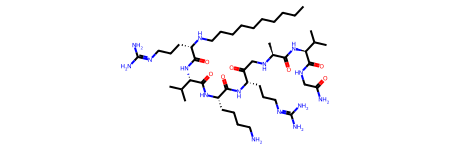

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@H](NC(=O)[C@@H](N)CC(C)C)C(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@H](C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCNC(=N)N)C(N)=O)C(C)C


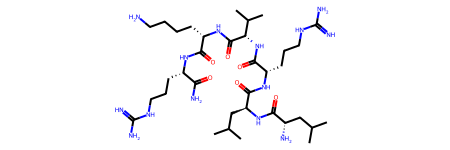

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@@H](CC(C)C)C(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@H](C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCNC(=N)N)C(N)=O)C(C)C


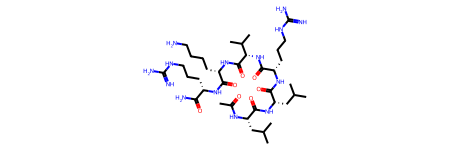

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@H](C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCNC(=N)N)C(N)=O)C(C)C


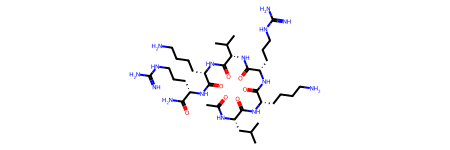

Neobsahuje ring
CCCCCCCCCC(=O)N[C@@H](CCCNC(=N)N)C(=O)N[C@H](C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCNC(=N)N)C(=O)CCl)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


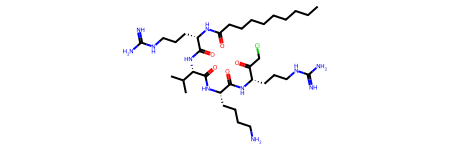

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCCCCN[C@@H](CCCN=C(N)N)C(=O)N[C@H](C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCN=C(N)N)C(=O)CCC(=O)OC)C(C)C


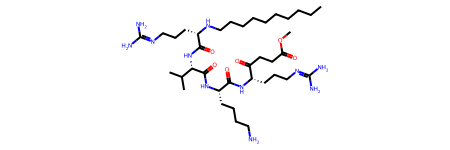

Neobsahuje ring
N=C(N)NCCC[C@H](NC(=O)[C@H](CCCCN)NC(=O)[C@H](CO)NC(=O)[C@H](CCCNC(=N)N)NC(=O)[C@H](CCC(=O)O)NC(=O)[C@H](CCCCN)NC(=O)[C@@H](N)CCC(=O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


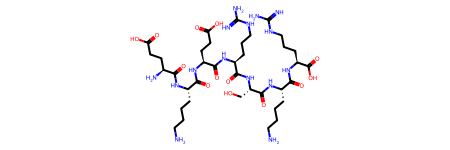

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCCCCN[C@@H](CCCN=C(N)N)C(=O)N[C@H](C(=O)N[C@@H](CCCCN)C(=O)N[C@H](CCCN=C(N)N)C(=O)CN[C@@H](C)C(=O)N[C@H](C(=O)NCC(N)=O)C(C)C)C(C)C


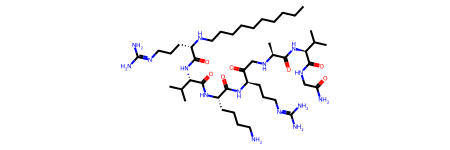

Neobsahuje ring
CCCCCCCCCCN[C@@H](CCCN=C(N)N)C(=O)N[C@H](C(=O)N[C@@H](CCCCN)C(=O)N[C@@H](CCCN=C(N)N)C(=O)CN[C@@H](C)C(=O)OC)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


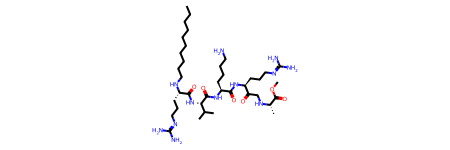

104670.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CN[C@H](CC(=O)O)C(=O)O


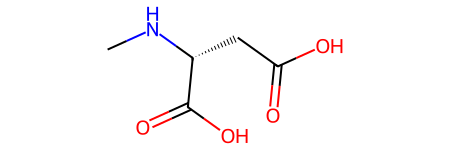

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@@H](CC(C)C)C(=O)N[C@H](C=O)CCCNC(=N)N


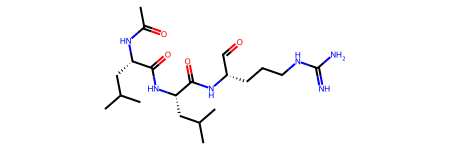

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

10144.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

237.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
C[C@H](N)C(=O)CCCC[C@@H](C)C(=O)O


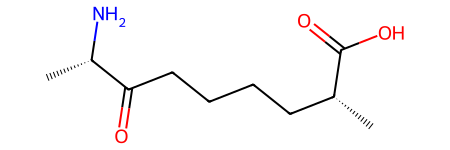

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11473.csv
Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@@H](CC(=O)NO)CC(C)C)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


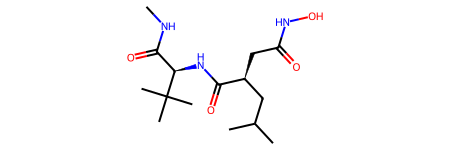

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](SC)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

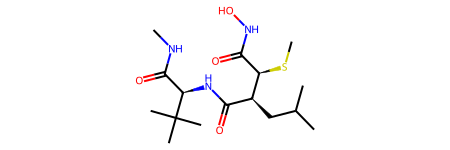

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](OC)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

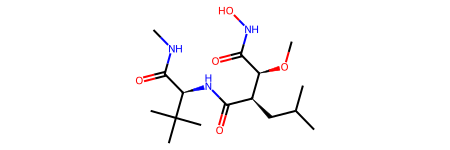

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCS[C@H](C(=O)NO)[C@@H](CC(C)C)C(=O)N[C@H](C(=O)NC)C(C)(C)C


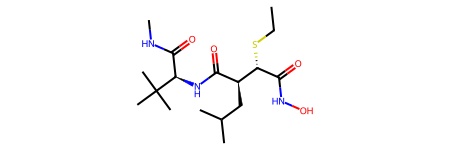

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](NC(C)=O)C(=O)NO)C(C)(C)C


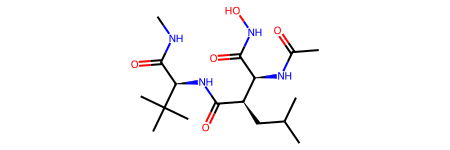

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

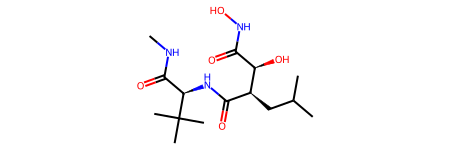

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](NS(C)(=O)=O)C(=O)NO)C(C)(C)C


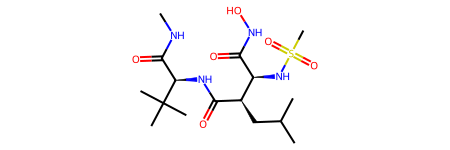

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](NCCCSC)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

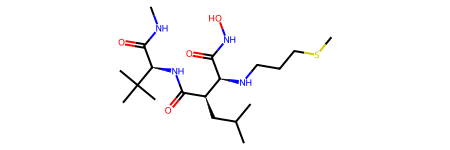

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@@H](CC(=O)NO)CC(C)C)C(C)(C)C


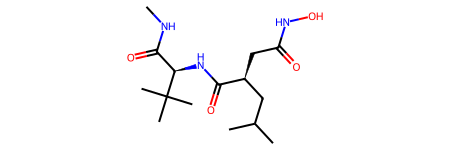

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](CO)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

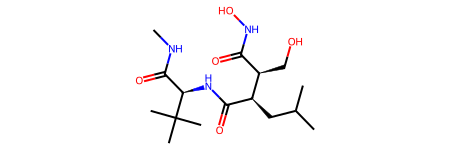

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@@H](C(=O)N[C@H](C(N)=O)C(C)(C)C)[C@H](C)N(O)C=O


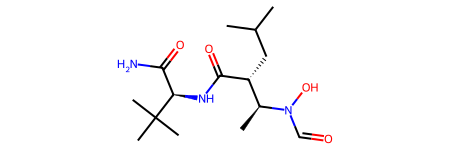

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

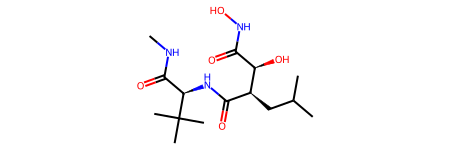

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](C)N(O)C=O)C(C)(C)C


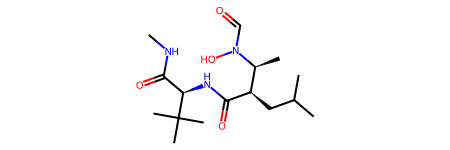

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

10495.csv
Neobsahuje ring
CCCC[C@@H](/C=N/NC(=O)NCC(=O)OCC)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

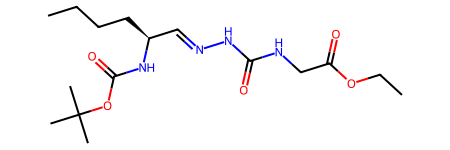

Neobsahuje ring
CCC(C)[C@H](C=O)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

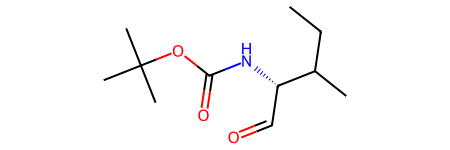

Neobsahuje ring
CCC(C)[C@@H](C=O)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

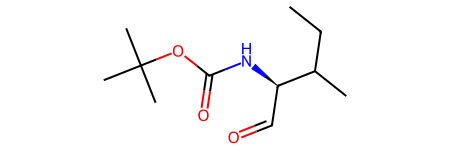

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)(C)C[C@@H](C=O)NC(=O)OC(C)(C)C


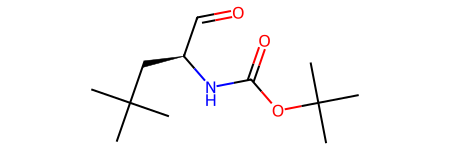

Neobsahuje ring
CC(C)[C@@H](C=O)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

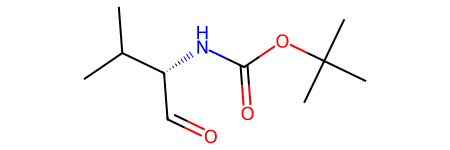

Neobsahuje ring
CCCC[C@@H](/C=N/NC(=O)NCC)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


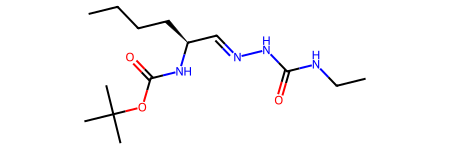

Neobsahuje ring
CCCC[C@@H](/C=N/NC(=O)CC(C)C)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

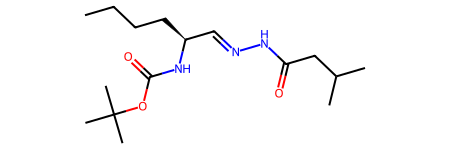

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](/C=N/NS(=O)(=O)N(C)C)NC(=O)OC(C)(C)C


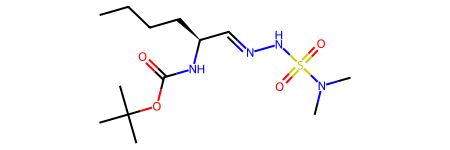

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCSC[C@@H](C=O)NC(=O)OC(C)(C)C


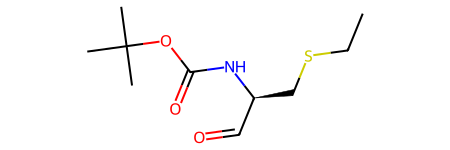

Neobsahuje ring
CN(CC[C@@H](C=O)NC(=O)OC(C)(C)C)C(=O)C(F)(F)F


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

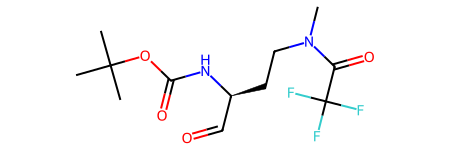

Neobsahuje ring
CN(CCCC[C@@H](C=O)NC(=O)OC(C)(C)C)C(=O)C(F)(F)F


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

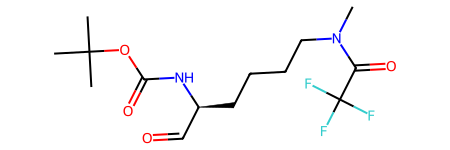

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](/C=N/NC(=O)N(CC)CC)NC(=O)OC(C)(C)C


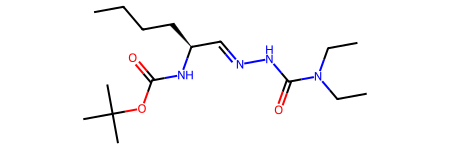

Neobsahuje ring
CC(C)(C)OC(=O)N[C@H](C=O)CCCCNC(=O)C(F)(F)F


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

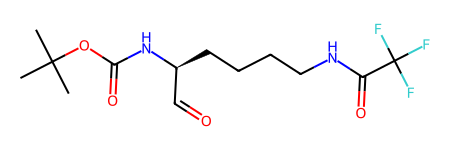

Neobsahuje ring
COC(=O)NCCCC[C@@H](C=O)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

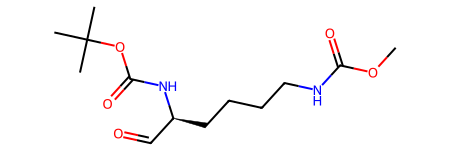

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@@H]([13CH]=O)NC(=O)OC(C)(C)C


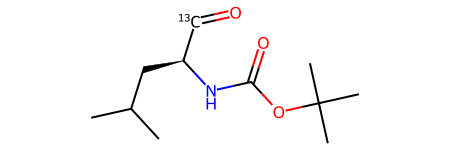

Neobsahuje ring
CCCC[C@H](N[C@@H](CC(C)C)C(=O)NCC#N)C(F)(F)F


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

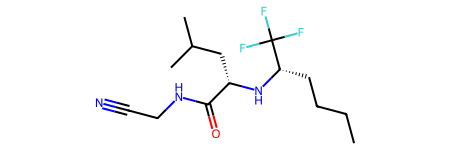

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](/C=N/NC(=O)C(F)(F)F)NC(=O)OC(C)(C)C


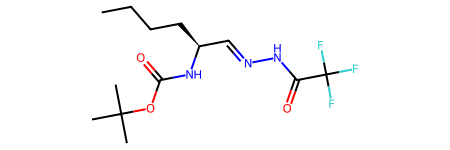

Neobsahuje ring
CC[C@@H](C=O)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

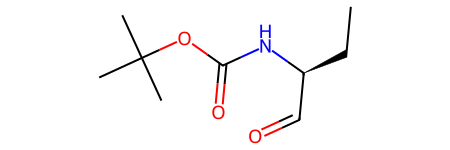

Neobsahuje ring
C[C@@H](C=O)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

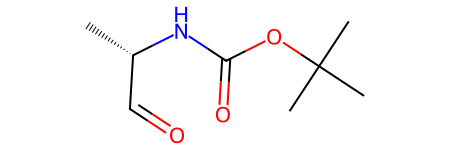

Neobsahuje ring
COC(=O)NC[C@@H](C=O)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

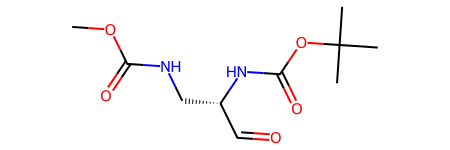

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](/C=N/NC(=O)NC(C)(C)C)NC(=O)OC(C)(C)C


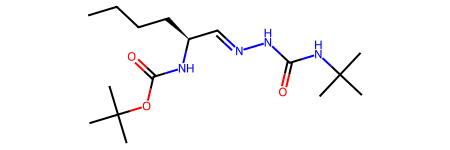

Neobsahuje ring
C/C=C\C[C@@H](C=O)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


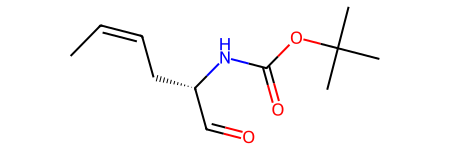

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](/C=N/NC(N)=O)NC(=O)OC(C)(C)C


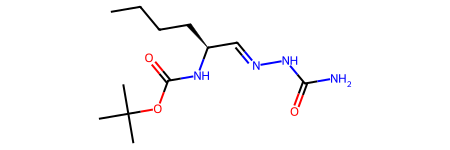

Neobsahuje ring
C=C(C)C[C@@H](C=O)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

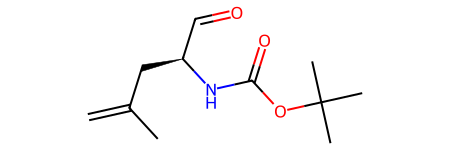

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCOC[C@@H](C=O)NC(=O)OC(C)(C)C


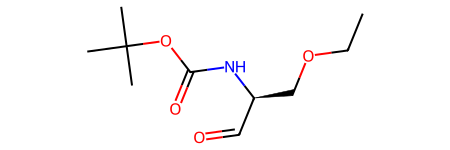

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](C=O)NC(=O)OC(C)(C(C)C)C(C)C


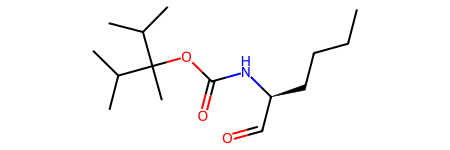

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CN(CCC[C@@H](C=O)NC(=O)OC(C)(C)C)C(=O)C(F)(F)F


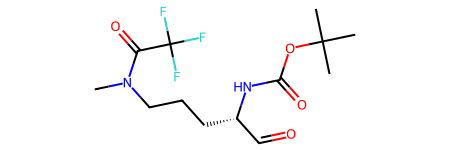

Neobsahuje ring
CC(C)C[C@@H](C=O)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

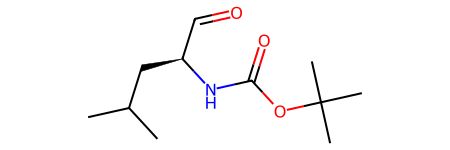

Neobsahuje ring
CCCC[C@@H](C=O)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

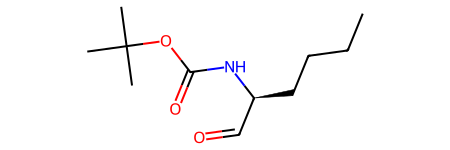

Neobsahuje ring
CCC[C@@H](C=O)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

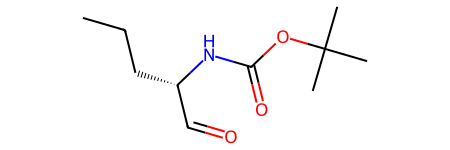

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CSCC[C@@H](C=O)NC(=O)OC(C)(C)C


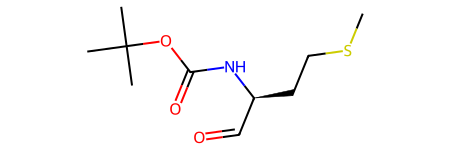

Neobsahuje ring
CCCC[C@@H](/C=N/NC(=O)N(C)C)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

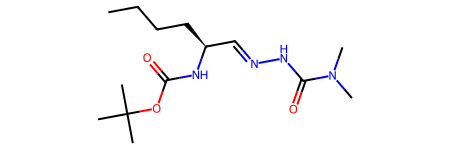

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](/C=N/NC(=O)NC(C)C)NC(=O)OC(C)(C)C


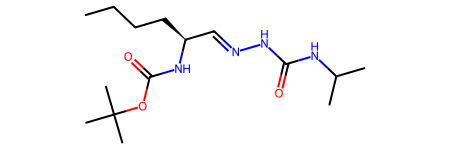

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCC[C@@H](C=O)NC(=O)OC(C)(C)C


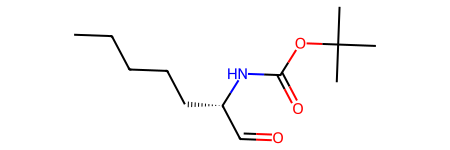

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCC[C@@H](C=O)NC(=O)OC(C)(C)C


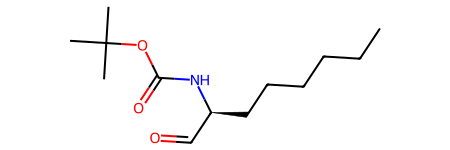

Neobsahuje ring
CCCC[C@@H](/C=N/NC(=O)NC)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

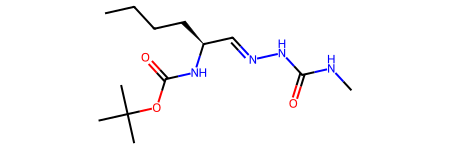

Neobsahuje ring
CC(C)(C)OC(=O)N[C@H](C=O)CCCC(F)(F)F


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

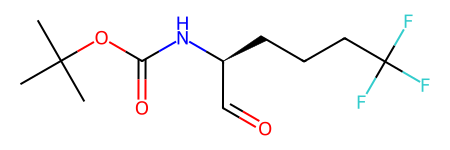

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](/C=N/NC(=O)NC(=O)OC)NC(=O)OC(C)(C)C


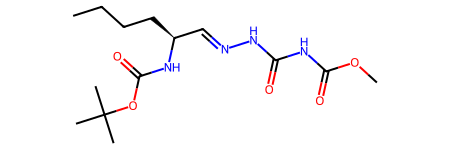

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](/C=N/NC(=O)NCCC(=O)OCC)NC(=O)OC(C)(C)C


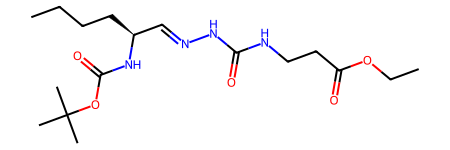

Neobsahuje ring
CCCC[C@@H](C=O)NC(=O)OC(CC(C)C)CC(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

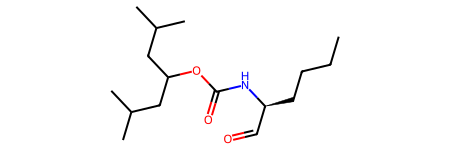

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](/C=N/NC(=O)SC(C)C)NC(=O)OC(C)(C)C


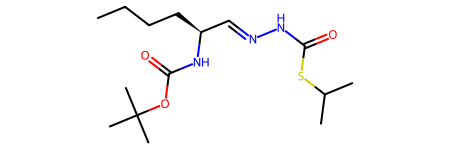

Neobsahuje ring
CCCC[C@@H](/C=N/N=C(\S)NC(C)C)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

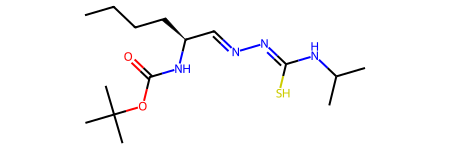

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](C=O)NC(=O)OC(CCC)CCC


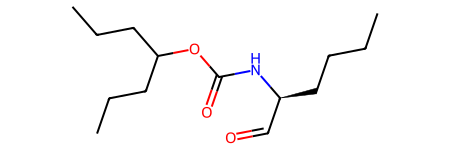

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC#CC[C@@H](C=O)NC(=O)OC(C)(C)C


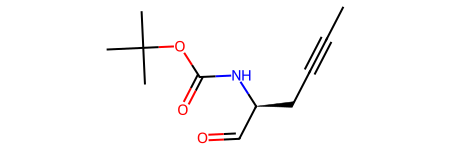

Neobsahuje ring
COCC[C@@H](C=O)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

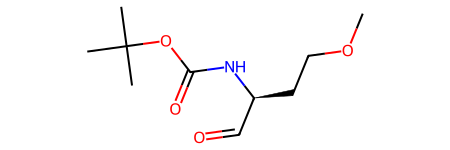

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](C=O)NC(=O)OC(C(C)C)C(C)C


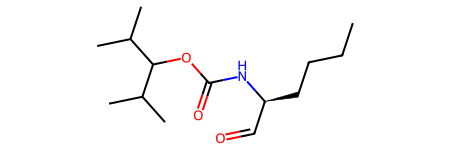

Neobsahuje ring
CCCC[C@H](C=O)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

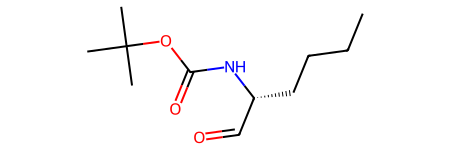

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
C/C=C/C[C@@H](C=O)NC(=O)OC(C)(C)C


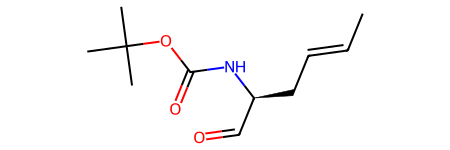

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](C=O)NC(=O)OC(CC)CC


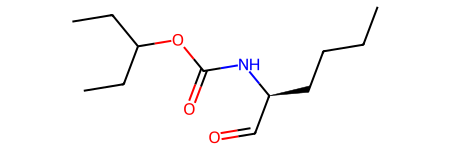

Neobsahuje ring
CCCC[C@@H](/C=N/NC(=O)OC(C)C)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

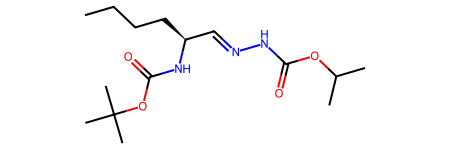

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@H](NC(=O)OC(C)(C)C)C(=O)NCC#N


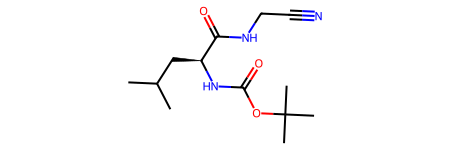

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCOC(=O)NNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)NC(=O)OC(C)(C)C)C(C)C


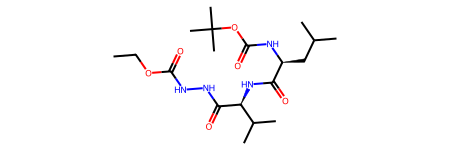

Neobsahuje ring
CSCC[C@H](NC(=O)OC(C)(C)C)C(=O)NCC#N


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

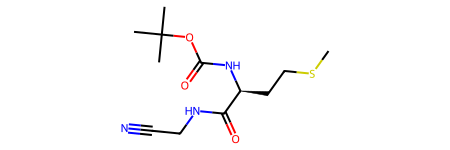

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@@H](CC(C)C)C(=O)N[C@H](C=O)CCCNC(=N)N


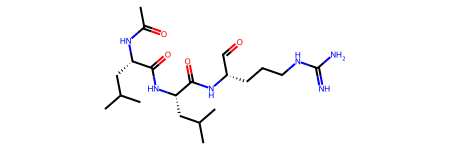

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11624.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@@H](CC(=O)O)C(=O)N[C@@H](CCC(=O)O)C(=O)N[C@H](C(=O)N[C@H](C=O)CC(=O)O)C(C)C


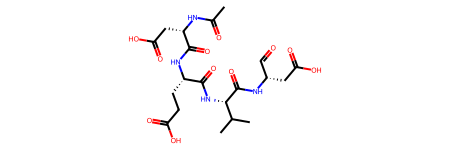

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@@H](CC(=O)O)C(=O)N[C@@H](CCC(=O)O)C(=O)N[C@H](C(=O)N[C@H](CC=O)CC(=O)O)C(C)C


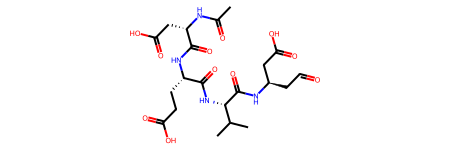

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@H](C(=O)N[C@@H](C)C(=O)N[C@@H](CC(=O)O)C(=O)O)C(C)C


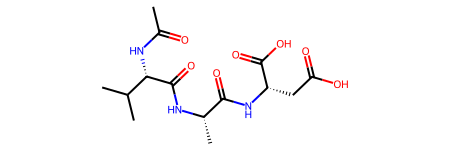

Neobsahuje ring
CC(C)[C@H](NC(=O)CC(Cl)Cl)C(=O)N[C@@H](C)C(=O)N[C@H](C=O)CC(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

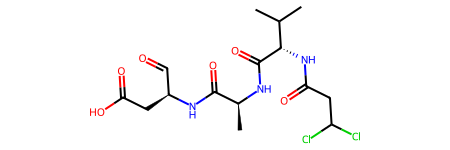

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

10323.csv
Neobsahuje ring
N=C(N)NCCCC(CS)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

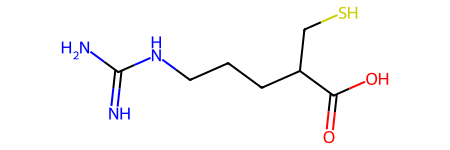

Neobsahuje ring
CCC(=O)[Se]CC(CCCCCN)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

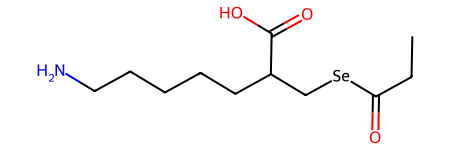

Neobsahuje ring
NCCCCCC(C[Se][Se]CC(CCCCCN)C(=O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

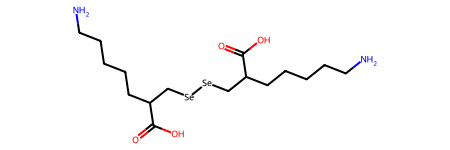

Neobsahuje ring
CCOC(=O)C(CCCCCN)C[Se]C(=O)CC


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

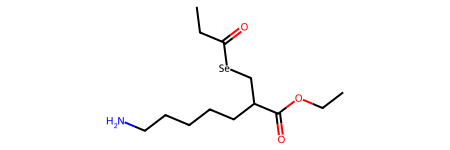

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
NC(N)=CCCSCC(CS)C(=O)O


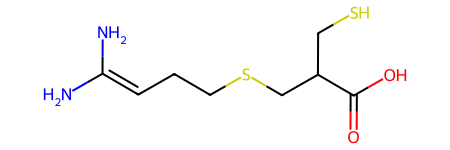

Neobsahuje ring
NCCCCCC(CS)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

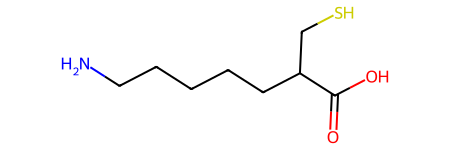

10003.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@H](NC(=O)[C@H](CC(N)=O)NC(=O)[C@@H](NC(=O)[C@@H](N)CCC(=O)O)C(C)C)[C@@H](O)C[C@@H](C)C(=O)N[C@@H](C)C(=O)O


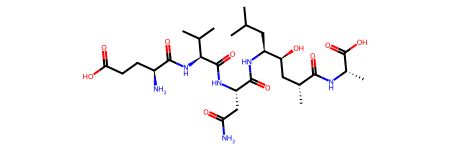

Neobsahuje ring
CCCCNC(=O)[C@H](C)C[C@H](O)[C@H](CC(C)C)NC(=O)[C@H](C)NC(=O)[C@H](CC(C)C)NC(C)=O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

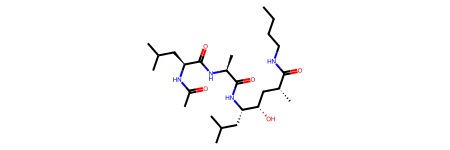

Neobsahuje ring
CCCCNC(=O)[C@H](C)C[C@H](O)[C@H](CC(C)C)NC(=O)[C@H](C)N(C)C(=O)[C@H](CC(C)C)NC(C)=O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

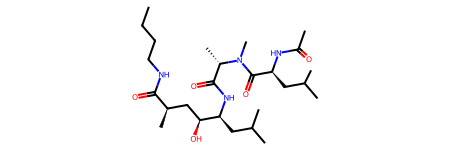

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)CC(=O)N[C@H](C(=O)N[C@H](C(=O)N[C@@H](CC(C)C)[C@@H](O)CC(=O)O)C(C)C)C(C)C


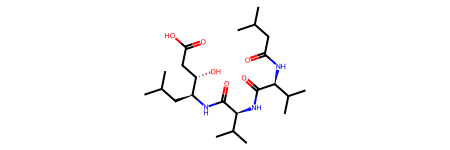

Neobsahuje ring
CCCC(=O)NN


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

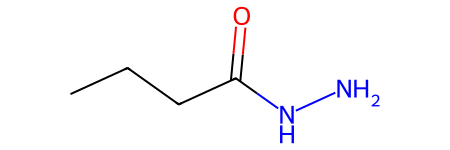

Neobsahuje ring
CCCCNC(=O)[C@H](C)C[C@H](O)[C@H](CC(C)C)NC(=O)[C@H](CCSC)NC(=O)CCC(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

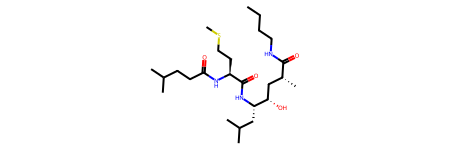

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)CC(=O)N[C@H](C(=O)N[C@H](C(=O)N[C@@H](CC(C)C)[C@@H](O)CC(=O)N[C@@H](C)C(=O)O)C(C)C)C(C)C


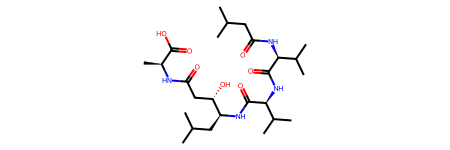

Neobsahuje ring
CCCCNC(=O)[C@H](C)C[C@H](O)[C@H](CC(C)C)NC(=O)[C@H](CCSC)NC(=O)[C@@H](NC(C)=O)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

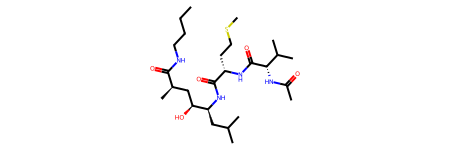

Neobsahuje ring
CC(C)CC(=O)N[C@H](C(=O)N[C@H](C(=O)N[C@@H](CC(C)C)[C@@H](O)CC(=O)N[C@@H](C)C(=O)N[C@@H](CC(C)C)[C@@H](O)CC(=O)O)C(C)C)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

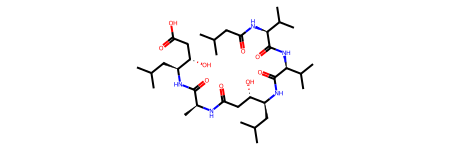

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCNC(=O)[C@H](C)C[C@H](O)[C@H](CC(C)C)NC(=O)[C@H](CCSC)NC(=O)[C@H](C)NC(C)=O


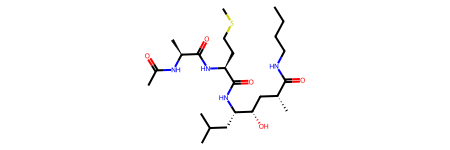

Neobsahuje ring
CCCCNC(=O)[C@H](C)C[C@H](O)[C@H](CC(C)C)NC(=O)[C@H](CCSC)NC(=O)[C@H](CC(C)C)NC(C)=O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

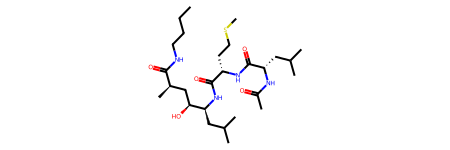

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)CC(=O)N[C@H](C(=O)N[C@H](C(=O)N[C@@H](CC(C)C)[C@@H](O)CC(=O)N[C@@H](C)C(=O)N[C@@H](CC(C)C)[C@@H](O)CC(=O)O)C(C)C)C(C)C


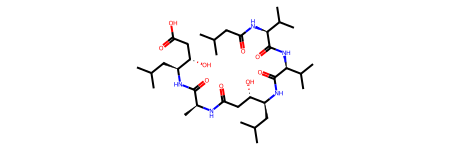

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

69.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
C[C@H](NC(=O)CCS)C(=O)O


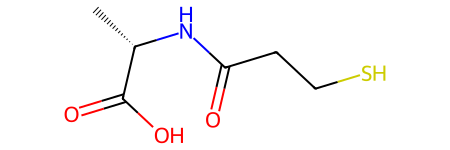

Neobsahuje ring
CC[C@@H](C)[C@H](S)C(=O)N[C@@H](C)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

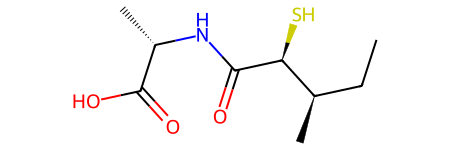

Neobsahuje ring
CC[C@@H](C)[C@H](S)C(=O)NCC(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

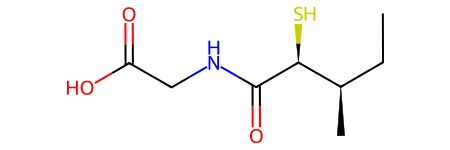

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11942.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11225.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)CC(=O)N[C@@H](C(=O)N[C@@H](C(=O)NC(CC(C)C)[C@@H](O)CC(=O)N[C@H](C)C(=O)NC(CC(C)C)[C@@H](O)CO)C(C)C)C(C)C


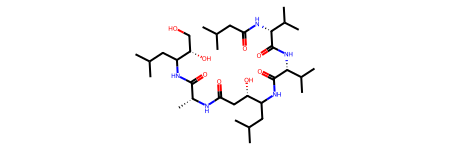

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
COC(=O)[C@H](CCCN=C(N)N)NC(=O)CC(O)[C@H](CC(C)C)NC(=O)[C@H](C)NC(=O)CC(O)[C@H](CC(C)C)NC(=O)[C@@H](NC(=O)[C@@H](NC(=O)CC(C)C)C(C)C)C(C)C


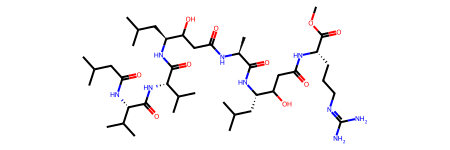

Neobsahuje ring
CC(C)CC(=O)N[C@H](C(=O)N[C@H](C(=O)N[C@@H](CC(C)C)C(O)CC(=O)N[C@@H](C)C(=O)N[C@@H](CC(C)C)C(O)CC(=O)N[C@@H](CCCN=C(N)N)C(=O)O)C(C)C)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

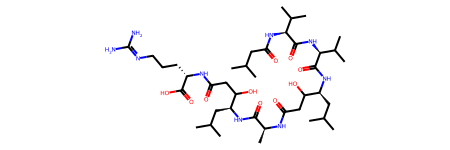

Neobsahuje ring
CC(C)CC(=O)N[C@H](C(=O)N[C@H](C(=O)N[C@@H](CC(C)C)[C@@H](O)CC(=O)N[C@@H](C)C(=O)N[C@@H](CC(C)C)[C@@H](O)CC(=O)O)C(C)C)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

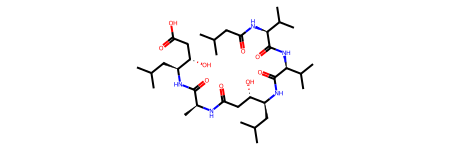

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11154.csv
Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@@H](CC(=O)NO)CC(C)C)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

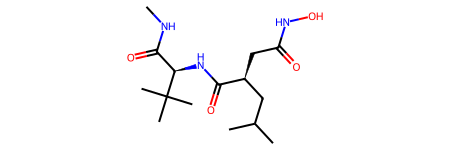

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


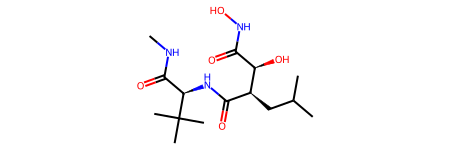

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11287.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

42.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11110.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


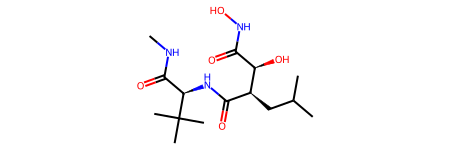

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)C(NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


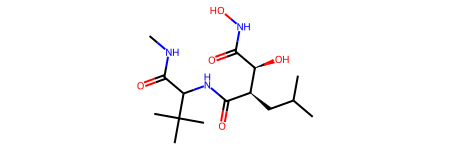

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](CC(C)C)NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO


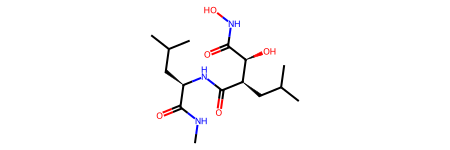

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
O=C(CNS(=O)(=O)C(F)(F)C(F)(F)C(F)(F)C(F)(F)F)NO


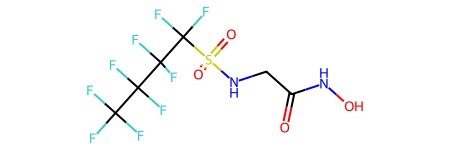

Neobsahuje ring
CC(C)CC(NS(=O)(=O)C(F)(F)C(F)(F)C(F)(F)C(F)(F)F)C(=O)NO


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

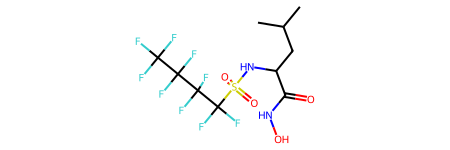

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C(NS(=O)(=O)C(F)(F)C(F)(F)C(F)(F)C(F)(F)F)C(=O)NO


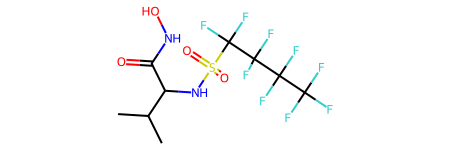

Neobsahuje ring
CCCCCCCCNC(=O)C(CC(C)C)C(=O)NO


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

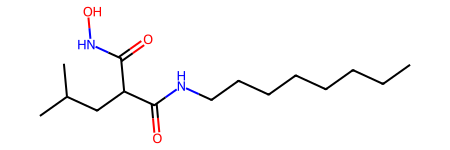

Neobsahuje ring
CNC(=O)[C@@H](CC(C)C)NC(=O)[C@@H](CC(=O)NO)CC(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

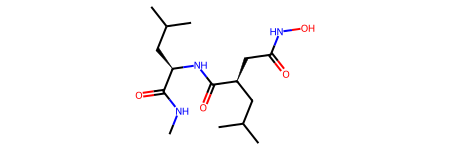

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(NS(=O)(=O)C(F)(F)C(F)(F)C(F)(F)C(F)(F)F)C(=O)NO


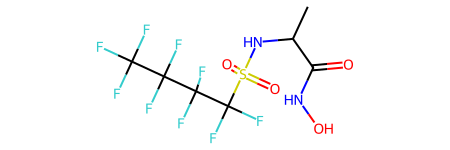

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11024.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


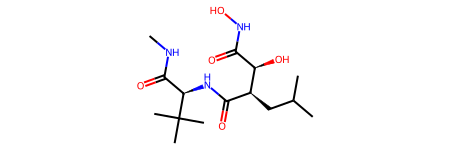

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11399.csv
11109.csv
Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@@H](CC(=O)NO)CC(C)C)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

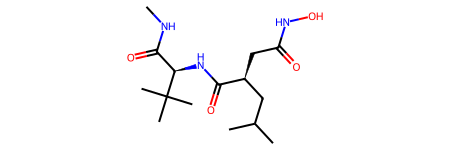

Neobsahuje ring
CCNC(CC(C)C)C(=O)NC(=O)[C@H](CC(C)C)NC(=O)C(CC(C)C)C(=O)CS


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


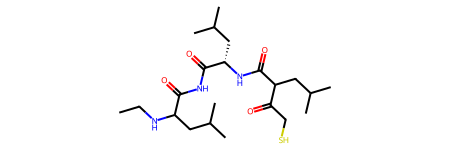

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCC[C@H](C[C@@H](O)CS)C(=O)N[C@H](C(=O)NC)C(C)(C)C


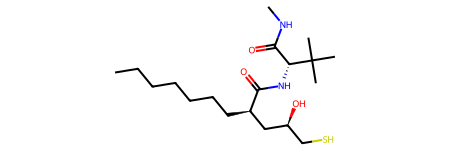

Neobsahuje ring
CCCCCCCC(C(=O)CS)C(=O)N[C@@H](CCCC)C(=O)NC(=O)C(CC(C)C)NCC


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

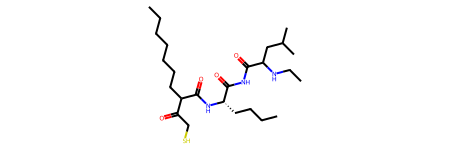

Neobsahuje ring
CCCCCCCC(C(=O)CS)C(=O)N[C@@H](CC(C)C)C(=O)NC(=O)C(CC(C)C)NCC


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

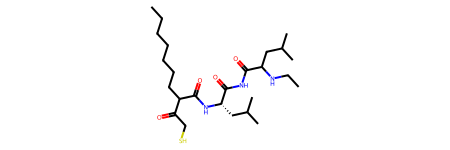

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CCCCCCCCCCCCCCO)CC(=O)NO)C(C)(C)C


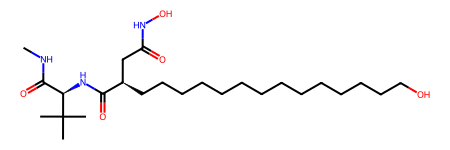

Neobsahuje ring
CCCCCCCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

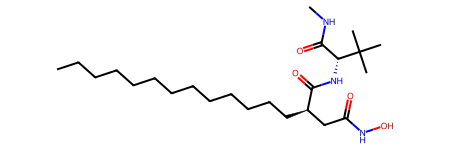

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCC(C(=O)N[C@@H](CC(C)C)C(=O)NC(=O)C(CC(C)C)NCC)C(O)CS


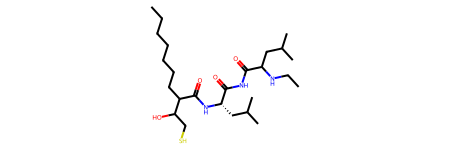

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCC[C@H](C[C@H](O)CS)C(=O)N[C@H](C(=O)NC)C(C)(C)C


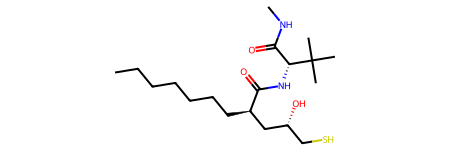

Neobsahuje ring
CCCCCCCC(C(=O)N[C@H](C(=O)NC)C(C)(C)C)C(O)CS


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

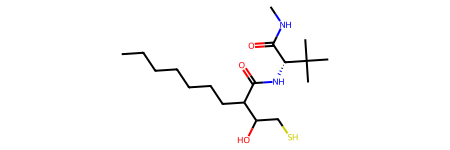

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@H](NC(=O)[C@H](CC(C)C)[C@@H](C)C(=O)NO)C(C)(C)C


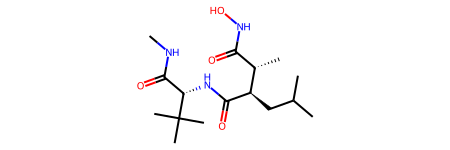

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)C[C@H](O)CS)C(C)(C)C


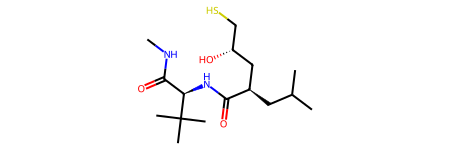

Neobsahuje ring
CCCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

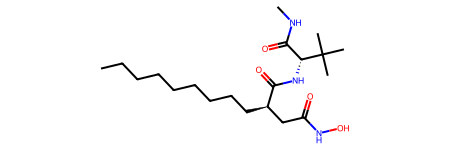

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
C=CC[C@](C)(C(=O)NO)[C@@H](CC(C)C)C(=O)N[C@H](C(=O)NC)C(C)(C)C


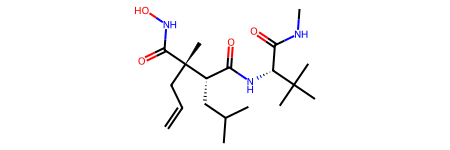

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCC[C@H](C[C@H](O)CS)C(=O)N[C@@H](CC(C)C)C(=O)NC(=O)C(CC(C)C)NCC


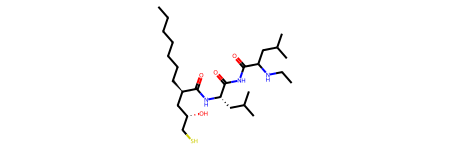

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

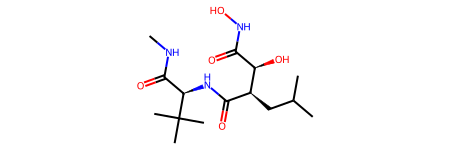

Neobsahuje ring
CCCCCCCCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

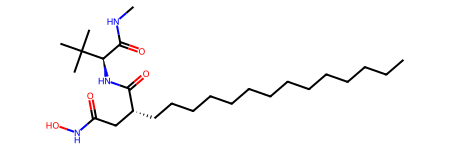

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCC[C@H](CC(=O)CS)C(=O)N[C@@H](CC(C)C)C(=O)NC(=O)C(CC(C)C)NCC


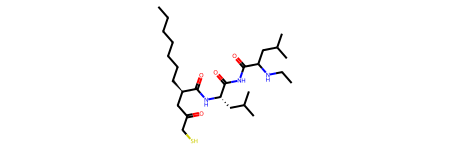

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCCCCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


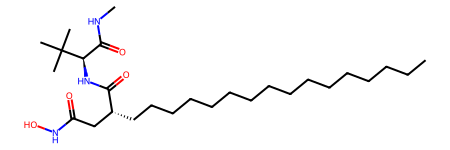

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@H](NC(=O)[C@@H](CC(=O)NO)CC(C)C)C(C)(C)C


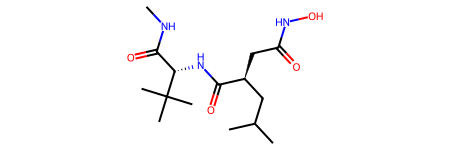

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)C(CC(C)C)C(=O)CS)C(C)(C)C


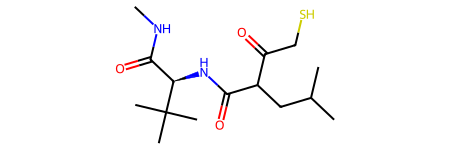

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@@H](CC(=O)CS)CC(C)C)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

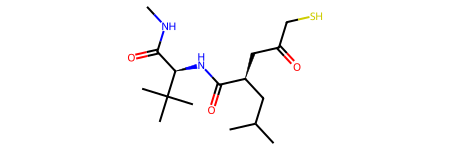

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
C=CC[C@H](C(=O)NO)[C@@H](CC(C)C)C(=O)N[C@H](C(=O)NC)C(C)(C)C


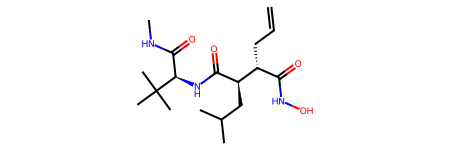

Neobsahuje ring
CNC(=O)C(NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

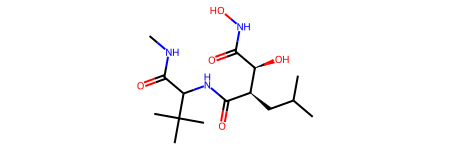

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


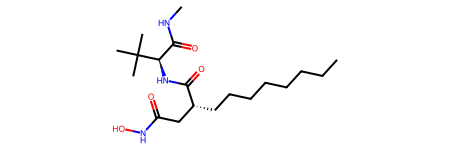

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCC(C(=O)CS)C(=O)N[C@H](C(=O)NC)C(C)(C)C


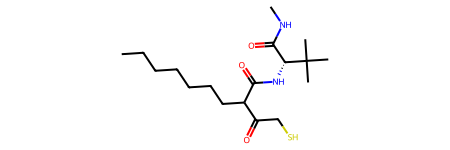

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCC[C@H](CC(=O)CS)C(=O)N[C@H](C(=O)NC)C(C)(C)C


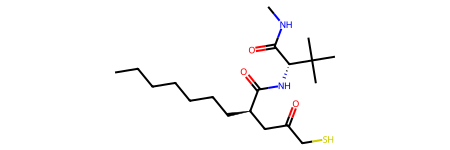

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@@H](CC(=O)NO)CC(C)C)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

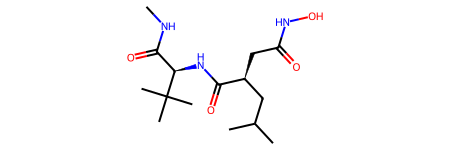

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](CO)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

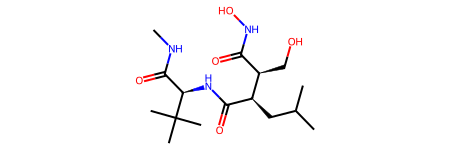

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@@H](C(=O)N[C@H](C(N)=O)C(C)(C)C)[C@H](C)N(O)C=O


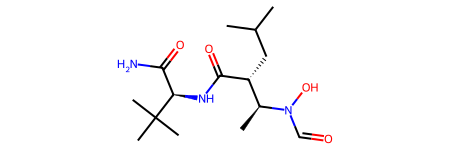

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

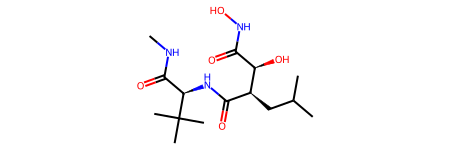

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

In [82]:
proteaz_all,prumery_proteaz_all = nacitani_dat_zpracovani('all_together_protease_threshold_1000nM')

48_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

102694_pic50.csv
133_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCC/C=C(\CCCCCCCCCCC(=O)O)[N+](=O)[O-]


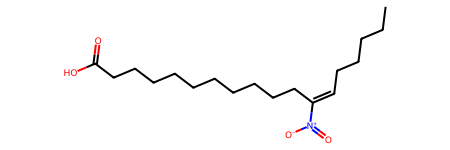

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11180_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

10133_pic50.csv
25_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

12227_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

163_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

103982_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

56_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

271_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11269_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

20113_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

19_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

64_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

174_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

36_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

20131_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

In [83]:
nucler_ic50,prumery_ic50 = nacitani_dat_zpracovani('nuclear_threshold_100nM_only_IC50')

10674_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

109455_pic50.csv
12000_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

105196_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

12955_pic50.csv
Neobsahuje ring
CC(C)C[C@@H](C=O)NC(=O)[C@H](CC(C)C)NS(C)(=O)=O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

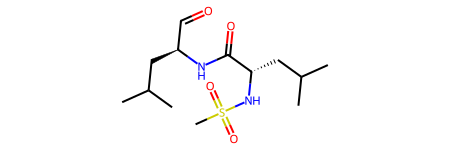

Neobsahuje ring
COC(=O)N[C@@H](CC(C)C)C(=O)N[C@H](C=O)CC(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

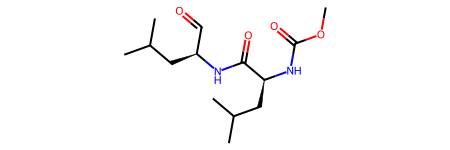

Neobsahuje ring
CC(C)C[C@H](C=O)NC(=O)[C@@H](NS(C)(=O)=O)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

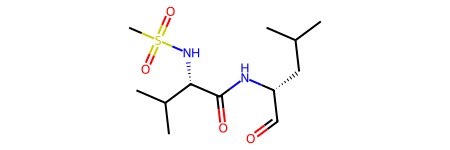

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@@H](CC(C)C)C(=O)N[C@H](C=O)CCCNC(=N)N


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

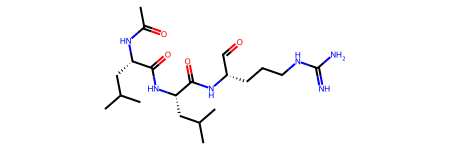

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@H](CC(C)C)C(=O)N[C@@H](C=O)CC(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

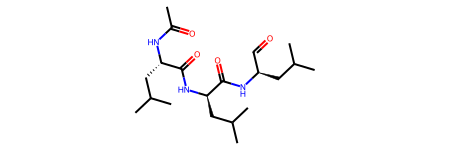

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@H](CC(C)C)C(=O)N[C@@H](C=O)CCCN=C(N)N


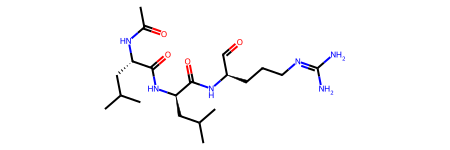

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@H](CC(C)C)C(=O)N[C@H](C=O)CC(C)C


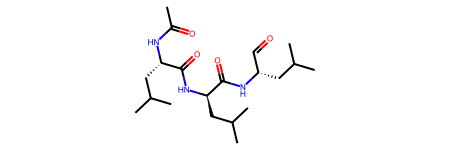

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@H](C=O)CC(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

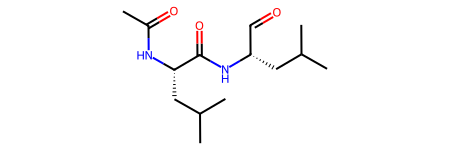

Neobsahuje ring
CC(=O)N[C@@H](C)C(=O)N[C@H](CC(C)C)C(=O)N[C@@H](C=O)CC(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


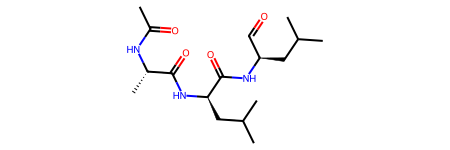

Neobsahuje ring
CSCC[C@@H](C=O)NC(=O)[C@H](CC(C)C)NC(=O)[C@H](CC(C)C)NC(C)=O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

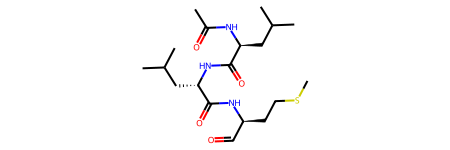

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@@H](COC(C)(C)C)C(=O)N[C@H](CC(C)C)C(=O)N[C@@H](C=O)CC(C)C


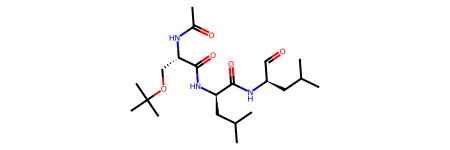

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@H](CC(C)C)C(=O)N[C@@H](C=O)CCCCNC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

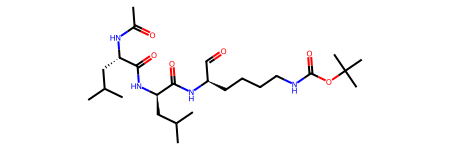

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@H](C=O)NC(=O)[C@@H](CC(C)C)NC(=O)[C@H](CC(C)C)NC(C)=O


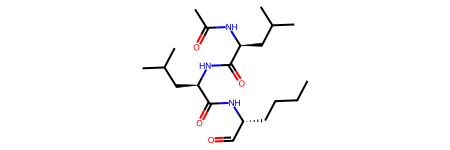

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

13000_pic50.csv
Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@@H](CC(=O)NO)CC(C)C)C(C)(C)C


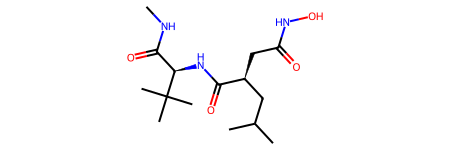

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCC[C@H](C[C@@H](O)CS)C(=O)N[C@H](C(=O)NC)C(C)(C)C


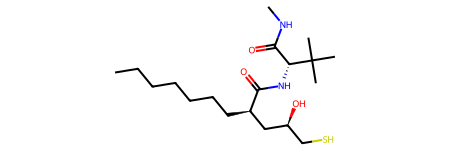

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CCCCCCCCCCCCCCO)CC(=O)NO)C(C)(C)C


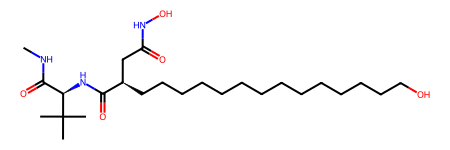

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCC[C@H](C[C@H](O)CS)C(=O)N[C@H](C(=O)NC)C(C)(C)C


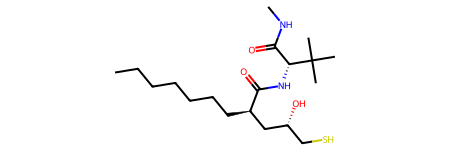

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)C(CC(C)C)C(O)CS)C(C)(C)C


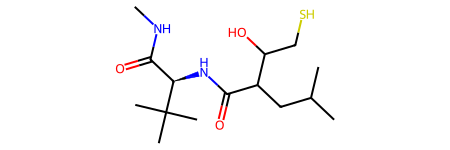

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)C[C@H](O)CS)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

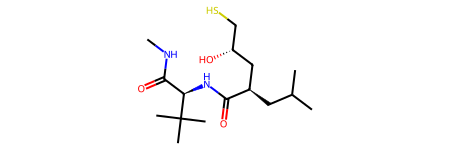

Neobsahuje ring
CC(C)C[C@H](CC(=O)NO)C(=O)N[C@@H](CC(C)C)C(=O)N[C@@H](C)C=O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

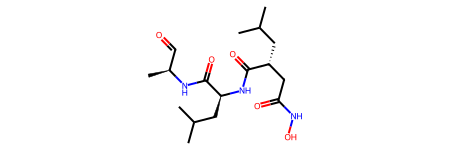

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


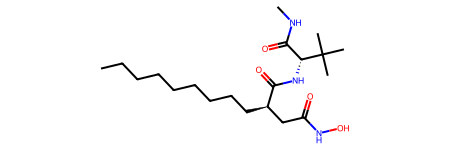

Neobsahuje ring
CC[C@@H](N[C@@H](CC(C)C)C(=O)N[C@@H](CCCCN)C(=O)NC)P(=O)(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

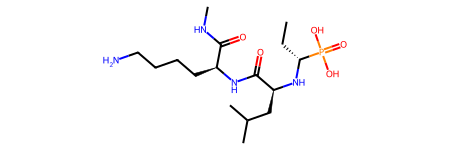

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
C=CC[C@](C)(C(=O)NO)[C@@H](CC(C)C)C(=O)N[C@H](C(=O)NC)C(C)(C)C


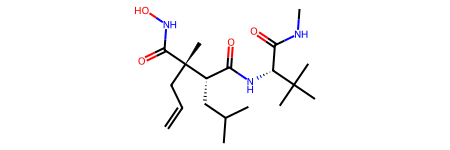

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


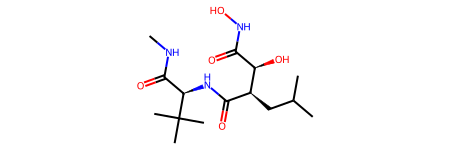

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@@H](C(=O)N(C)C)[C@H](CN(C)S(C)(=O)=O)C(=O)NO


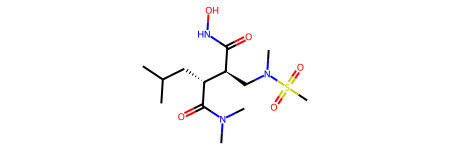

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)C[C@@H](O)CS)C(C)(C)C


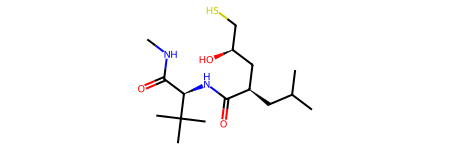

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCOC(=O)[C@H](C)NC(=O)[C@H](CC(C)C)NC(=O)[C@@H](CC(=O)NO)CC(C)C


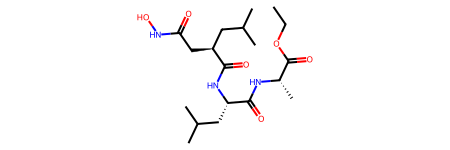

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)C(CC(C)C)C(=O)CS)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

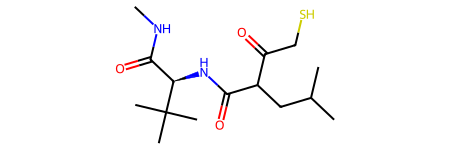

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@@H](CC(=O)CS)CC(C)C)C(C)(C)C


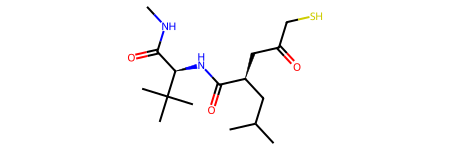

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC[C@H](N[C@@H](CC(C)C)C(=O)N[C@@H](CCCN(C)C)C(=O)NC)P(=O)(O)O


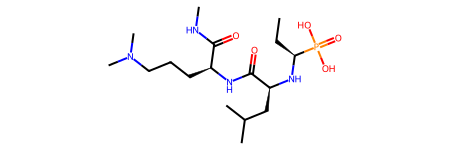

Neobsahuje ring
C=CC[C@H](C(=O)NO)[C@@H](CC(C)C)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

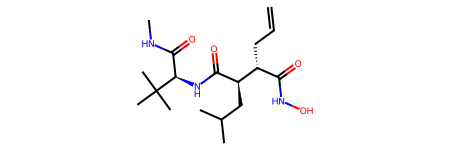

Neobsahuje ring
CNC(=O)C(NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

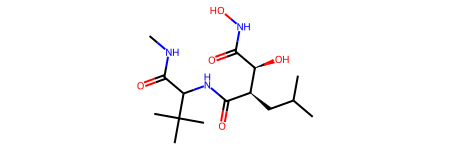

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC[C@H](N[C@@H](CC(C)C)C(=O)N[C@@H](CCCN=C(N)N)C(=O)NC)P(=O)(O)O


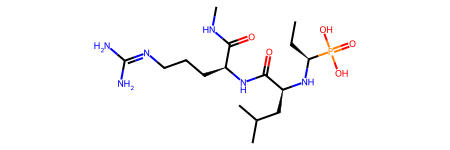

Neobsahuje ring
CCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

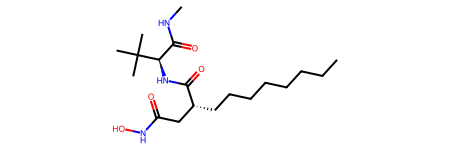

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCC(C(=O)CS)C(=O)N[C@H](C(=O)NC)C(C)(C)C


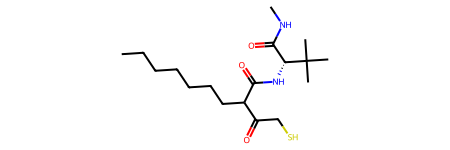

Neobsahuje ring
CCCCCCC[C@H](CC(=O)CS)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

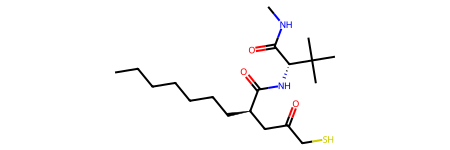

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11534_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

10144_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

235_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C(NC(=O)CNC(=O)[C@@H](NC(=O)OC(C)(C)C)C(C)C)C(=O)C(F)(F)F


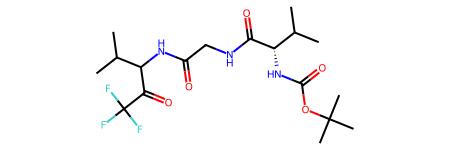

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

69_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
C[C@H](NC(=O)CCS)C(=O)O


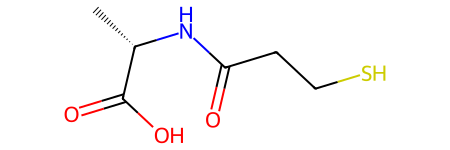

12593_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

101477_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11192_pic50.csv
Neobsahuje ring
CC(C)C[C@H](C(=O)NO)C(=O)N[C@@H](C)C(=O)NCC(N)=O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

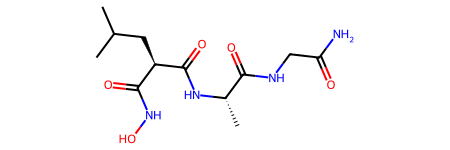

Neobsahuje ring
CC(C)C(C(=O)NO)C(=O)NCCC(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

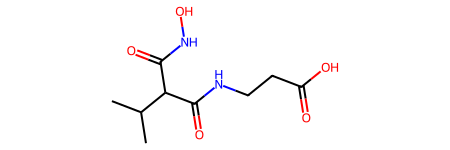

Neobsahuje ring
CC(C)C(C(=O)NO)C(=O)NC(CC(N)=O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

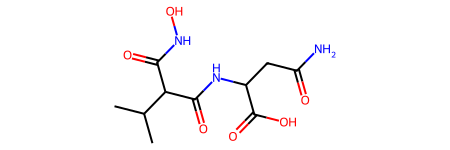

Neobsahuje ring
CC(C)C(C(=O)NO)C(=O)NCC(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

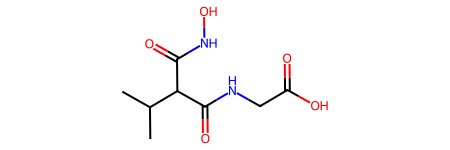

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C(CC(=O)NO)C(=O)NC(CC(N)=O)C(=O)O


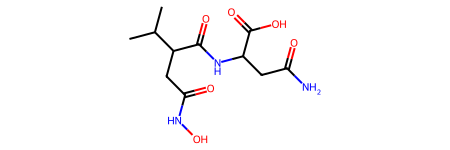

Neobsahuje ring
CC(C)C(CC(=O)NO)C(=O)NCCC(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

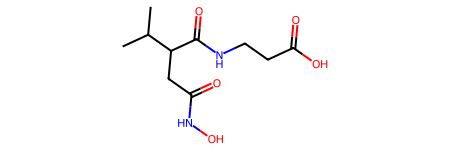

12013_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@@H](NC(C)=O)C(C)C)C(=O)N[C@H](C=O)CC(=O)O


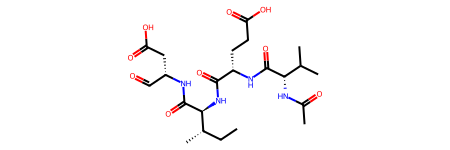

11_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11473_pic50.csv
Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@@H](CC(=O)NO)CC(C)C)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


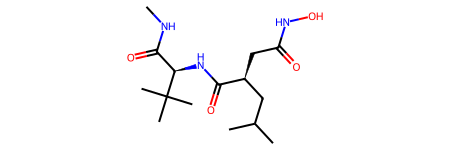

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](SC)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

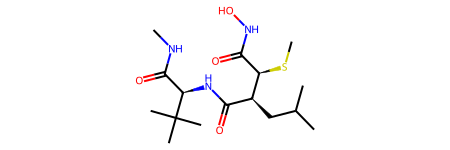

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](OC)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

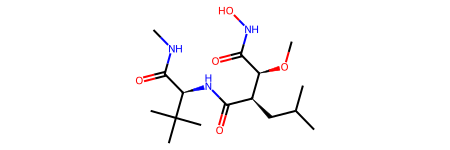

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCS[C@H](C(=O)NO)[C@@H](CC(C)C)C(=O)N[C@H](C(=O)NC)C(C)(C)C


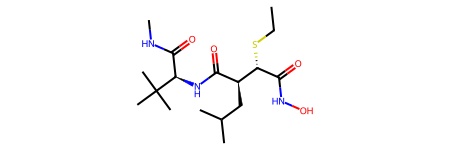

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](NC(C)=O)C(=O)NO)C(C)(C)C


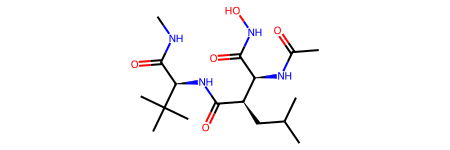

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

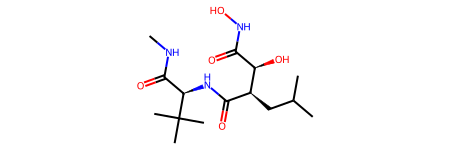

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](NS(C)(=O)=O)C(=O)NO)C(C)(C)C


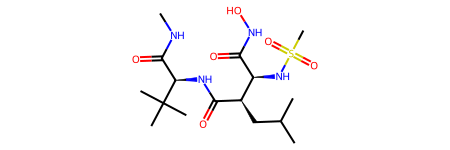

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](NCCCSC)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

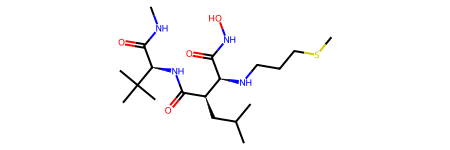

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

194_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
NC(N)=NCCC[C@@H](C=O)NC(=O)CNC(=O)[C@H](N)CCCN=C(N)N


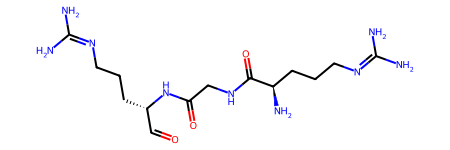

Neobsahuje ring
N=C(N)NCCC[C@@H](C=O)NC(=O)CNC(=O)[C@@H](CCCNC(=N)N)NC(=O)CCC(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

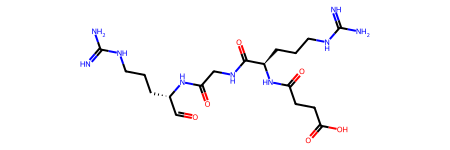

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
C[C@H](NC(=O)[C@@H](CCCN=C(N)N)NC(=O)OC(C)(C)C)C(=O)N[C@H](C=O)CCCN=C(N)N


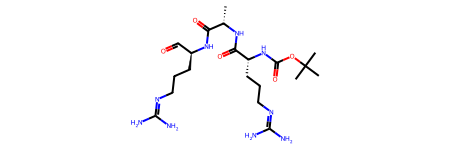

Neobsahuje ring
N=C(N)NCCC[C@@H](C=O)NC(=O)CNC(=O)[C@@H](CCCNC(=N)N)NC(=O)CC(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

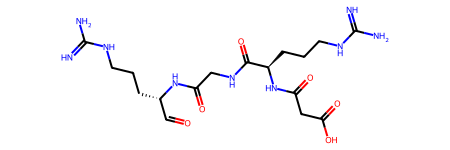

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)(C)OC(=O)N[C@H](CCCCN=C(N)N)C(=O)NCC(=O)N[C@H](C=O)CCCN=C(N)N


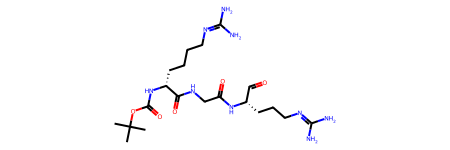

Neobsahuje ring
C[C@@H](NC(=O)[C@@H](CCCN=C(N)N)NC(=O)OC(C)(C)C)C(=O)N[C@H](C=O)CCCN=C(N)N


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

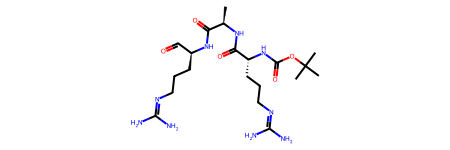

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)(C)OC(=O)N[C@H](CCCN=C(N)N)C(=O)NC(C)(C)C(=O)N[C@H](C=O)CCCN=C(N)N


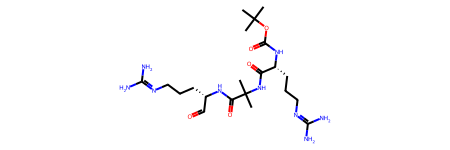

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=N)NCCC[C@@H](NC(=O)OC(C)(C)C)C(=O)NCC(=O)N[C@H](C=O)CCCN=C(N)N


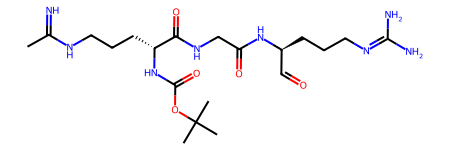

Neobsahuje ring
N=C(N)NCCC[C@@H](C=O)NC(=O)CNC(=O)[C@@H](CCCNC(=N)N)NC(=O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

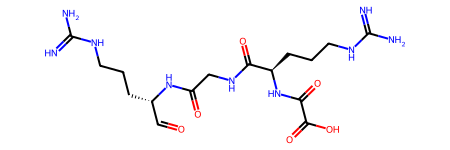

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCOC(=O)N[C@H](CCCN=C(N)N)C(=O)NCC(=O)N[C@H](C=O)CCCN=C(N)N


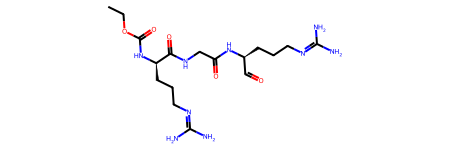

Neobsahuje ring
CC(C)(C)OC(=O)N[C@H](CCCN=C(N)N)C(=O)NCC(=O)N[C@H](C=O)CCCN=C(N)N


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

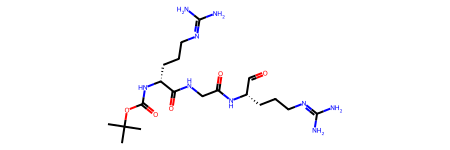

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11241_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11109_pic50.csv
Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@@H](CC(=O)NO)CC(C)C)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

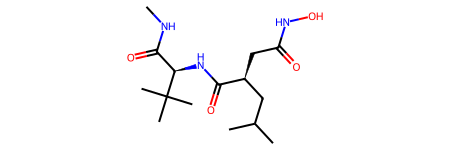

Neobsahuje ring
CCNC(CC(C)C)C(=O)NC(=O)[C@H](CC(C)C)NC(=O)C(CC(C)C)C(=O)CS


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


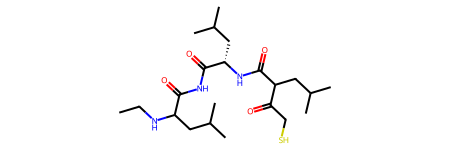

Neobsahuje ring
CCCCCCC[C@H](C[C@@H](O)CS)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

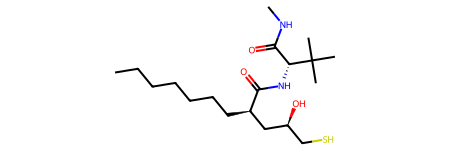

Neobsahuje ring
CCCCCCCC(C(=O)CS)C(=O)N[C@@H](CCCC)C(=O)NC(=O)C(CC(C)C)NCC


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

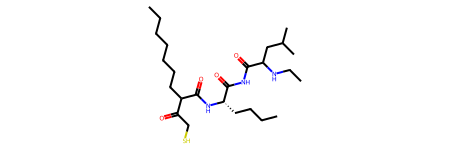

Neobsahuje ring
CCCCCCCC(C(=O)CS)C(=O)N[C@@H](CC(C)C)C(=O)NC(=O)C(CC(C)C)NCC


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

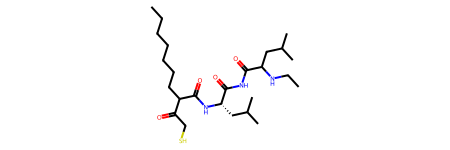

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CCCCCCCCCCCCCCO)CC(=O)NO)C(C)(C)C


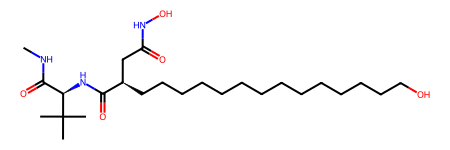

Neobsahuje ring
CCCCCCCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

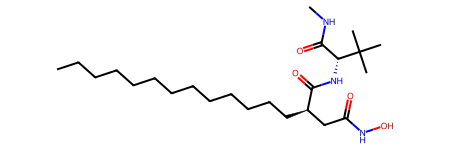

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCC(C(=O)N[C@@H](CC(C)C)C(=O)NC(=O)C(CC(C)C)NCC)C(O)CS


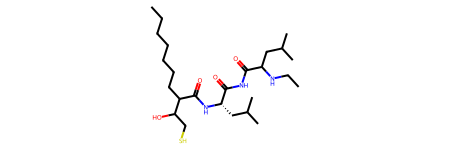

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCC[C@H](C[C@H](O)CS)C(=O)N[C@H](C(=O)NC)C(C)(C)C


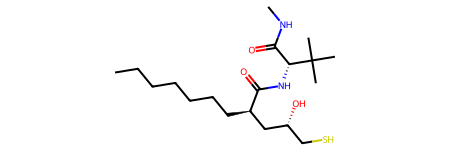

Neobsahuje ring
CCCCCCCC(C(=O)N[C@H](C(=O)NC)C(C)(C)C)C(O)CS


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

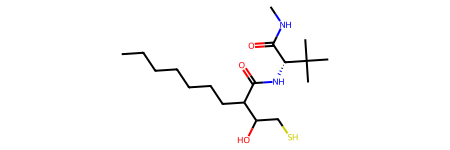

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@H](NC(=O)[C@H](CC(C)C)[C@@H](C)C(=O)NO)C(C)(C)C


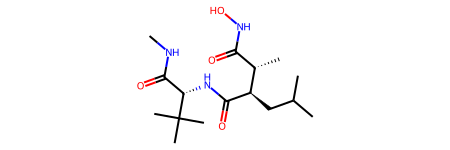

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)C[C@H](O)CS)C(C)(C)C


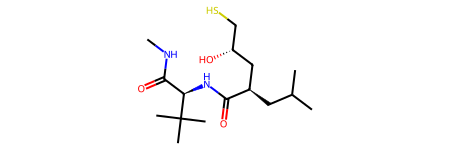

Neobsahuje ring
CCCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

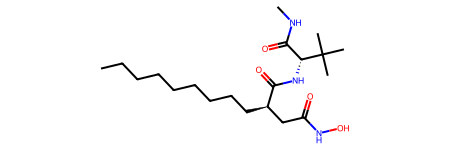

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
C=CC[C@](C)(C(=O)NO)[C@@H](CC(C)C)C(=O)N[C@H](C(=O)NC)C(C)(C)C


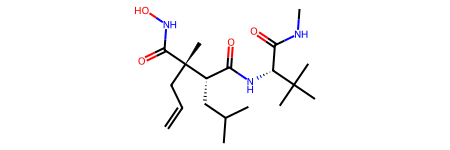

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCC[C@H](C[C@H](O)CS)C(=O)N[C@@H](CC(C)C)C(=O)NC(=O)C(CC(C)C)NCC


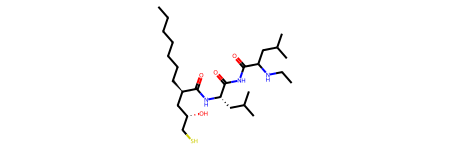

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

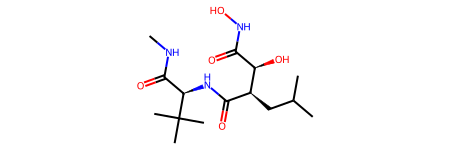

Neobsahuje ring
CCCCCCCCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

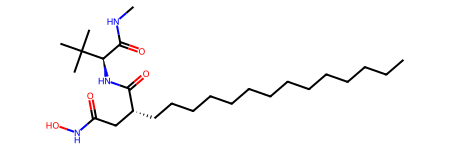

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCC[C@H](CC(=O)CS)C(=O)N[C@@H](CC(C)C)C(=O)NC(=O)C(CC(C)C)NCC


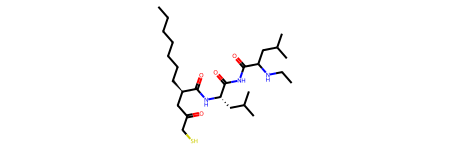

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCCCCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


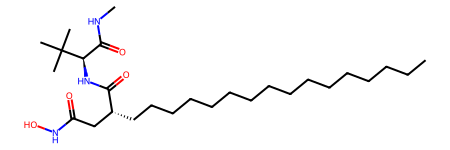

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@H](NC(=O)[C@@H](CC(=O)NO)CC(C)C)C(C)(C)C


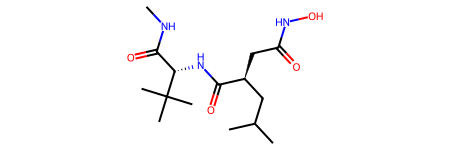

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)C(CC(C)C)C(=O)CS)C(C)(C)C


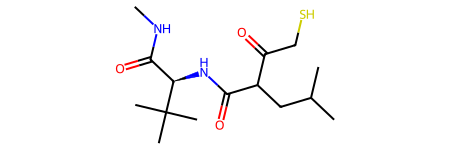

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@@H](CC(=O)CS)CC(C)C)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

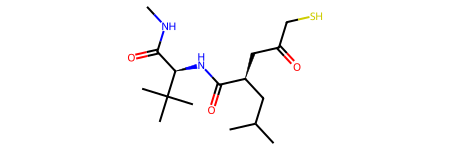

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
C=CC[C@H](C(=O)NO)[C@@H](CC(C)C)C(=O)N[C@H](C(=O)NC)C(C)(C)C


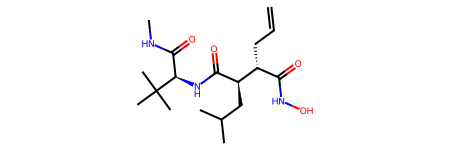

Neobsahuje ring
CNC(=O)C(NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

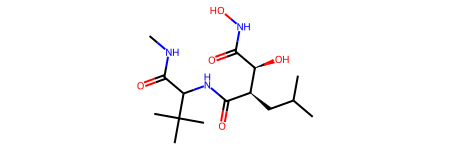

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


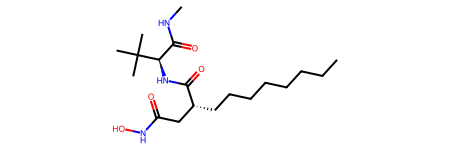

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCC(C(=O)CS)C(=O)N[C@H](C(=O)NC)C(C)(C)C


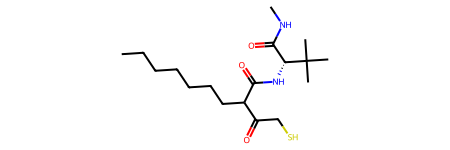

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCC[C@H](CC(=O)CS)C(=O)N[C@H](C(=O)NC)C(C)(C)C


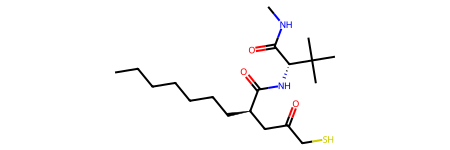

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

100613_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

10003_pic50.csv
Neobsahuje ring
CC(C)C[C@H](NC(=O)[C@H](CC(N)=O)NC(=O)[C@@H](NC(=O)[C@@H](N)CCC(=O)O)C(C)C)[C@@H](O)C[C@@H](C)C(=O)N[C@@H](C)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

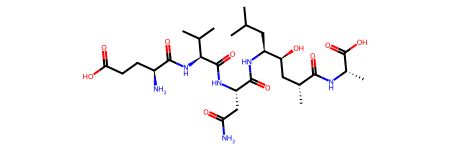

Neobsahuje ring
CCCCNC(=O)[C@H](C)C[C@H](O)[C@H](CC(C)C)NC(=O)[C@H](C)NC(=O)[C@H](CC(C)C)NC(C)=O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

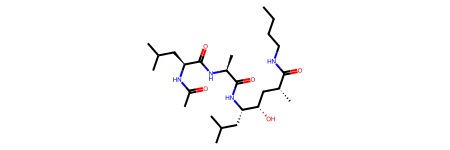

Neobsahuje ring
CCCCNC(=O)[C@H](C)C[C@H](O)[C@H](CC(C)C)NC(=O)[C@H](C)N(C)C(=O)[C@H](CC(C)C)NC(C)=O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

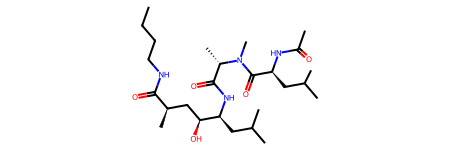

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)CC(=O)N[C@H](C(=O)N[C@H](C(=O)N[C@@H](CC(C)C)[C@@H](O)CC(=O)O)C(C)C)C(C)C


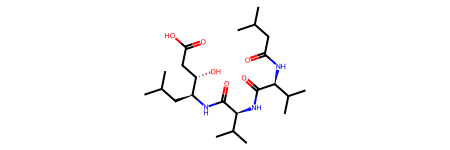

Neobsahuje ring
CCCC(=O)NN


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

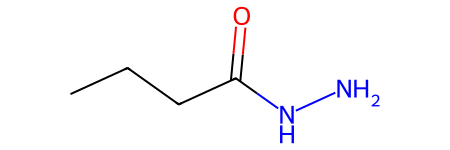

Neobsahuje ring
CCCCNC(=O)[C@H](C)C[C@H](O)[C@H](CC(C)C)NC(=O)[C@H](CCSC)NC(=O)CCC(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

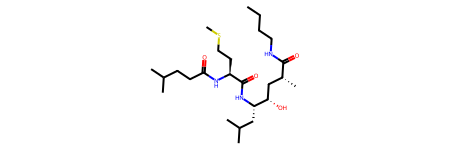

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)CC(=O)N[C@H](C(=O)N[C@H](C(=O)N[C@@H](CC(C)C)[C@@H](O)CC(=O)N[C@@H](C)C(=O)O)C(C)C)C(C)C


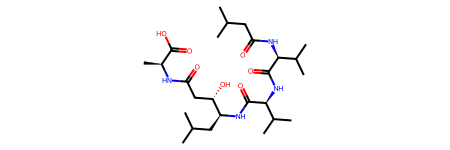

Neobsahuje ring
CCCCNC(=O)[C@H](C)C[C@H](O)[C@H](CC(C)C)NC(=O)[C@H](CCSC)NC(=O)[C@@H](NC(C)=O)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

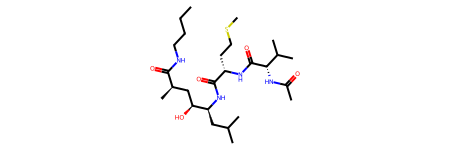

Neobsahuje ring
CC(C)CC(=O)N[C@H](C(=O)N[C@H](C(=O)N[C@@H](CC(C)C)[C@@H](O)CC(=O)N[C@@H](C)C(=O)N[C@@H](CC(C)C)[C@@H](O)CC(=O)O)C(C)C)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

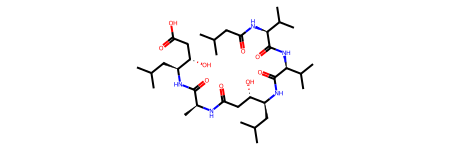

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCNC(=O)[C@H](C)C[C@H](O)[C@H](CC(C)C)NC(=O)[C@H](CCSC)NC(=O)[C@H](C)NC(C)=O


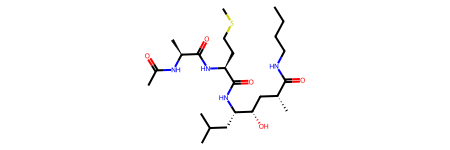

Neobsahuje ring
CCCCNC(=O)[C@H](C)C[C@H](O)[C@H](CC(C)C)NC(=O)[C@H](CCSC)NC(=O)[C@H](CC(C)C)NC(C)=O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

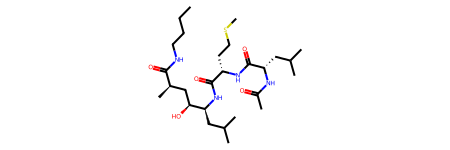

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

104670_pic50.csv
Neobsahuje ring
CN[C@H](CC(=O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

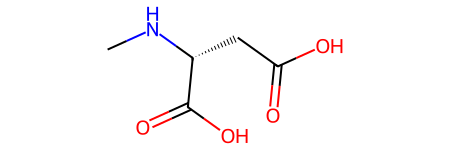

12396_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

10378_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@@H](CC(C)C)C(=O)N[C@H](C=O)CCCNC(=N)N


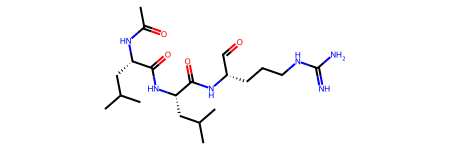

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

12592_pic50.csv
Neobsahuje ring
CCCCCCC[C@H](C[C@@H](O)CS)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

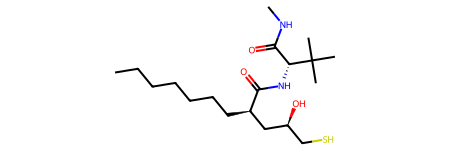

Neobsahuje ring
CCCCCCC[C@H](C[C@H](O)CS)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

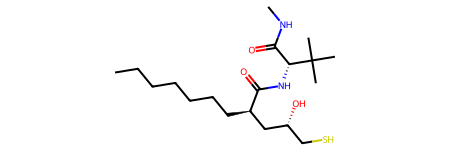

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@@H](CC(=O)NO)CC(C)C)C(C)(C)C


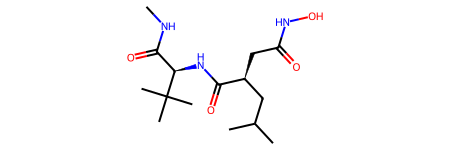

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCC[C@H](C[C@H](O)CS)C(=O)N[C@@H](CC(C)C)C(=O)NC(=O)C(CC(C)C)NCC


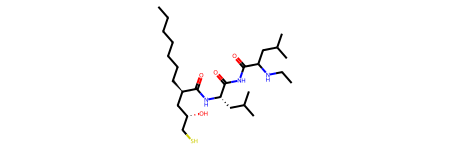

Neobsahuje ring
CCCCCCC[C@H](CC(=O)CS)C(=O)N[C@@H](CC(C)C)C(=O)NC(=O)C(CC(C)C)NCC


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

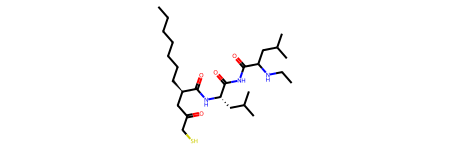

Neobsahuje ring
CNC(=O)[C@H](NC(=O)[C@@H](CC(=O)NO)CC(C)C)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

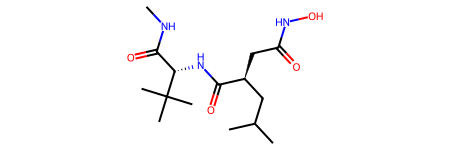

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)C[C@@H](O)CS)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


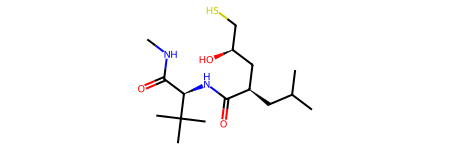

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCC(C(=O)CS)C(=O)N[C@@H](CC(C)C)C(=O)NC(=O)C(CC(C)C)NCC


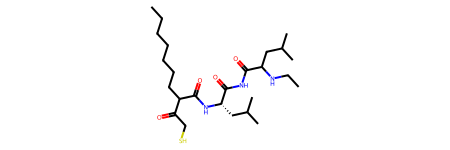

Neobsahuje ring
CNC(=O)[C@H](NC(=O)[C@H](CC(C)C)[C@@H](C)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

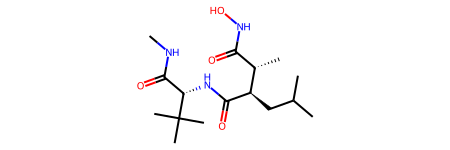

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)C[C@H](O)CS)C(C)(C)C


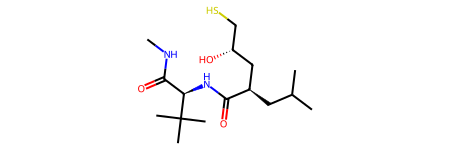

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


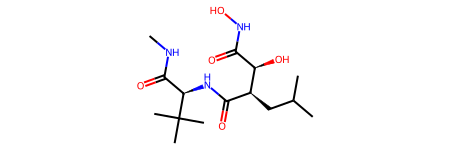

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)C(CC(C)C)C(=O)CS)C(C)(C)C


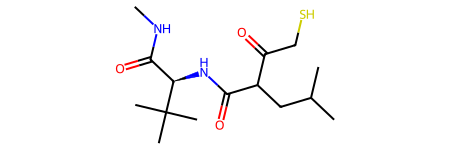

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@@H](CC(=O)CS)CC(C)C)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

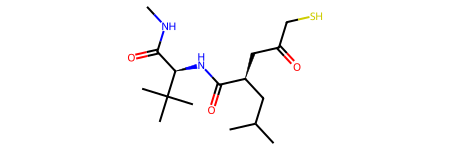

Neobsahuje ring
CNC(=O)C(NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

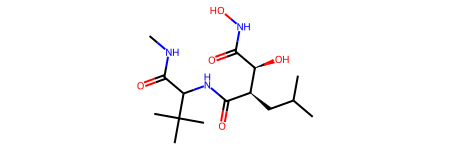

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCC[C@H](CC(=O)CS)C(=O)N[C@H](C(=O)NC)C(C)(C)C


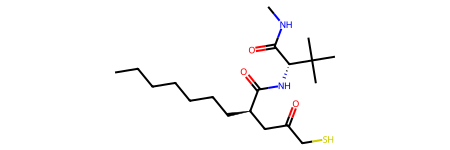

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


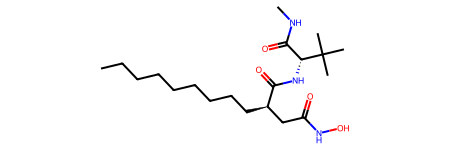

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCC(C(=O)CS)C(=O)N[C@H](C(=O)NC)C(C)(C)C


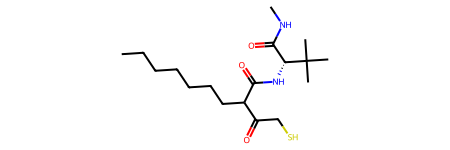

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11225_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)CC(=O)N[C@@H](C(=O)N[C@@H](C(=O)NC(CC(C)C)[C@@H](O)CC(=O)N[C@H](C)C(=O)NC(CC(C)C)[C@@H](O)CO)C(C)C)C(C)C


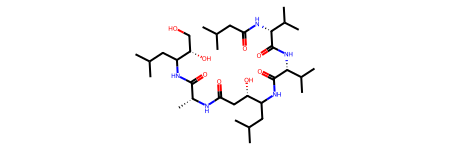

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

10702_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCOC(=O)[C@@H](C)NC(=O)C(O)[C@H](N)CCSCC


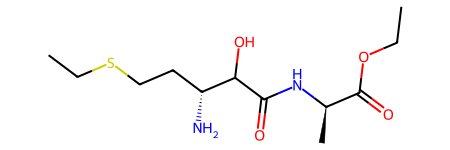

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

100624_pic50.csv
Neobsahuje ring
CCCCC(=O)NCC(=O)N[C@@H](CC(C)C)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

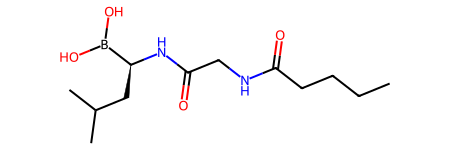

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@@H](CCC(=O)OC(C)(C)C)C(=O)N[C@@H](C)C(=O)N[C@H](/C=C/S(C)(=O)=O)CC(C)C


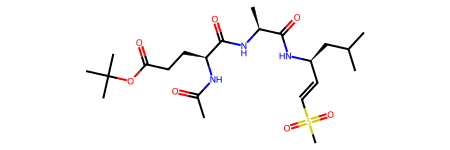

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@H](NC(=O)CNC(=O)CC(C)(C)C)B(O)O


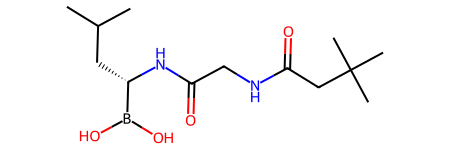

Neobsahuje ring
CCC(=O)NCC(=O)N[C@@H](CC(C)C)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

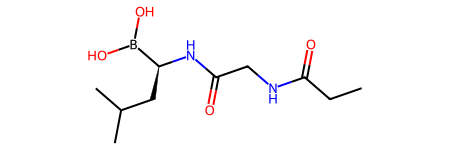

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC(=O)NCC(=O)N[C@@H](CC(C)C)B(O)O


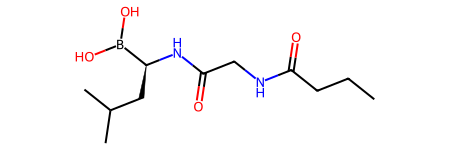

Neobsahuje ring
CC(C)CC(=O)NCC(=O)N[C@@H](CC(C)C)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

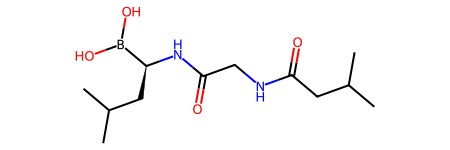

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCC(=O)NCC(=O)N[C@@H](CC(C)C)B(O)O


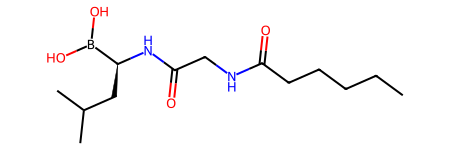

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

23_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11024_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


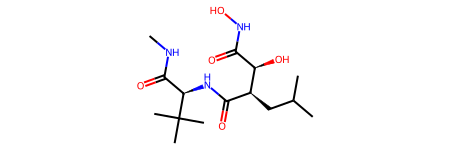

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

12067_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@@H](CC(=O)O)C(=O)N[C@@H](CCC(=O)O)C(=O)N[C@H](C(=O)N[C@H](C=O)CC(=O)O)C(C)C


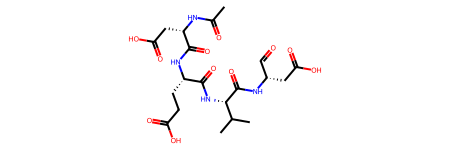

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

100633_pic50.csv
12861_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

10495_pic50.csv
Neobsahuje ring
CCCC[C@@H](/C=N/NC(=O)NCC(=O)OCC)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

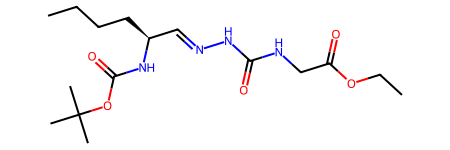

Neobsahuje ring
CCC(C)[C@H](C=O)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

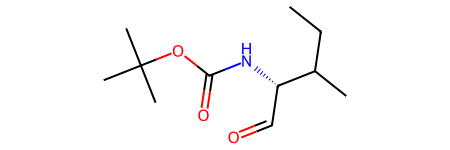

Neobsahuje ring
CCC(C)[C@@H](C=O)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

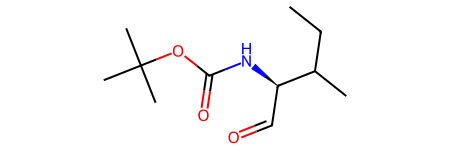

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)(C)C[C@@H](C=O)NC(=O)OC(C)(C)C


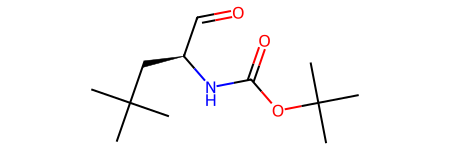

Neobsahuje ring
CC(C)[C@@H](C=O)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

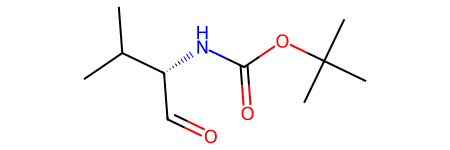

Neobsahuje ring
CCCC[C@@H](/C=N/NC(=O)NCC)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


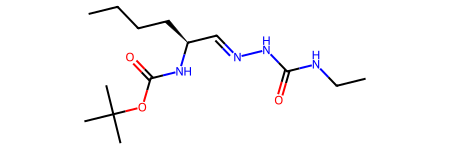

Neobsahuje ring
CCCC[C@@H](/C=N/NC(=O)CC(C)C)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

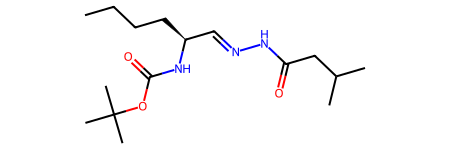

Neobsahuje ring
CCCC[C@@H](/C=N/NS(=O)(=O)N(C)C)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

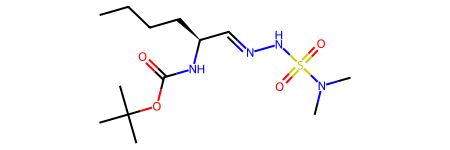

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCSC[C@@H](C=O)NC(=O)OC(C)(C)C


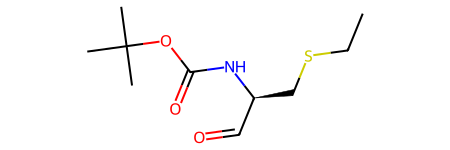

Neobsahuje ring
CN(CC[C@@H](C=O)NC(=O)OC(C)(C)C)C(=O)C(F)(F)F


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

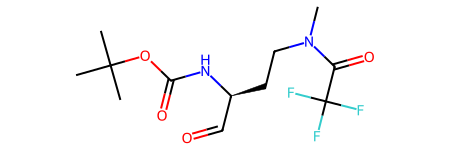

Neobsahuje ring
CN(CCCC[C@@H](C=O)NC(=O)OC(C)(C)C)C(=O)C(F)(F)F


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

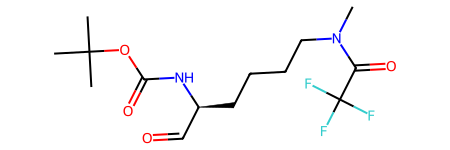

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](/C=N/NC(=O)N(CC)CC)NC(=O)OC(C)(C)C


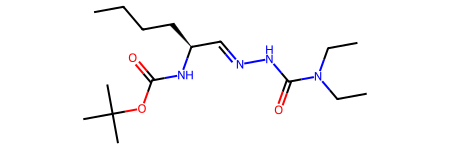

Neobsahuje ring
CC(C)(C)OC(=O)N[C@H](C=O)CCCCNC(=O)C(F)(F)F


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

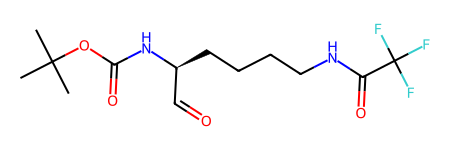

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
COC(=O)NCCCC[C@@H](C=O)NC(=O)OC(C)(C)C


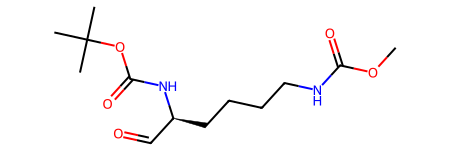

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@@H]([13CH]=O)NC(=O)OC(C)(C)C


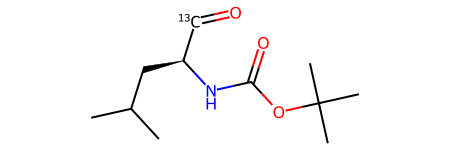

Neobsahuje ring
CCCC[C@H](N[C@@H](CC(C)C)C(=O)NCC#N)C(F)(F)F


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

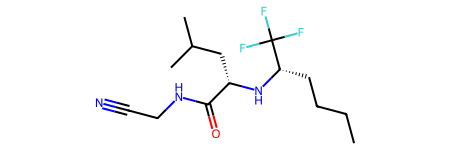

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](/C=N/NC(=O)C(F)(F)F)NC(=O)OC(C)(C)C


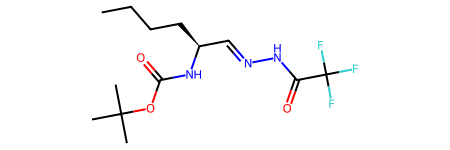

Neobsahuje ring
CC[C@@H](C=O)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

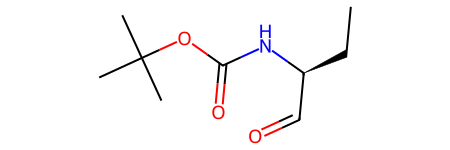

Neobsahuje ring
C[C@@H](C=O)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

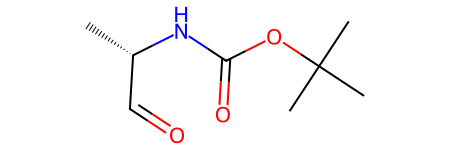

Neobsahuje ring
COC(=O)NC[C@@H](C=O)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

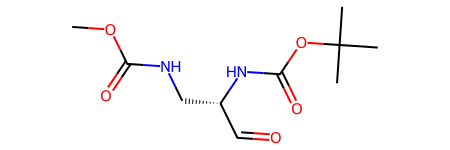

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](/C=N/NC(=O)NC(C)(C)C)NC(=O)OC(C)(C)C


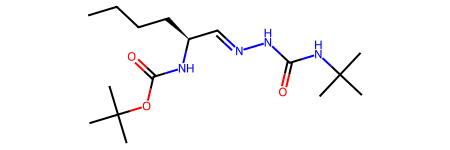

Neobsahuje ring
C/C=C\C[C@@H](C=O)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


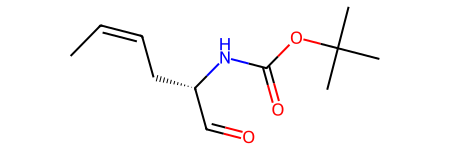

Neobsahuje ring
CCCC[C@@H](/C=N/NC(N)=O)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

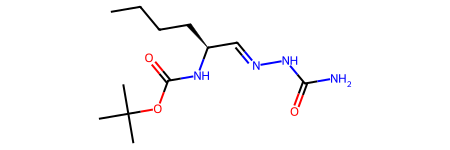

Neobsahuje ring
C=C(C)C[C@@H](C=O)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

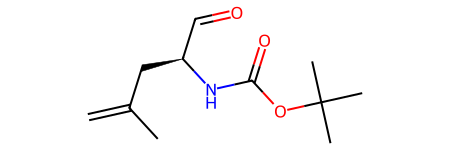

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCOC[C@@H](C=O)NC(=O)OC(C)(C)C


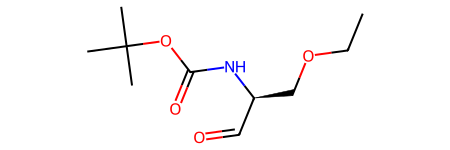

Neobsahuje ring
CCCC[C@@H](C=O)NC(=O)OC(C)(C(C)C)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

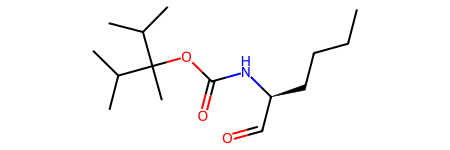

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CN(CCC[C@@H](C=O)NC(=O)OC(C)(C)C)C(=O)C(F)(F)F


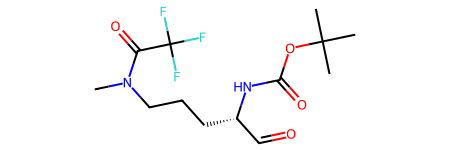

Neobsahuje ring
CC(C)C[C@@H](C=O)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

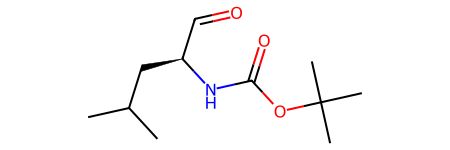

Neobsahuje ring
CCCC[C@@H](C=O)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

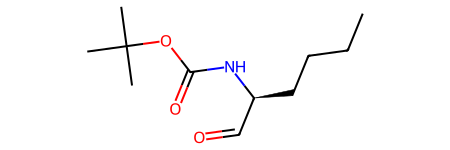

Neobsahuje ring
CCC[C@@H](C=O)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

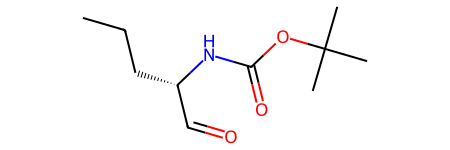

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CSCC[C@@H](C=O)NC(=O)OC(C)(C)C


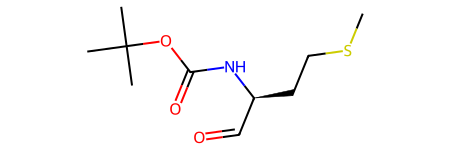

Neobsahuje ring
CCCC[C@@H](/C=N/NC(=O)N(C)C)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

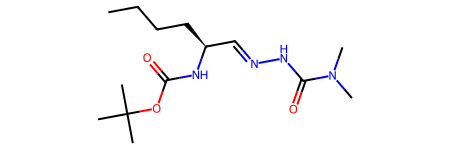

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](/C=N/NC(=O)NC(C)C)NC(=O)OC(C)(C)C


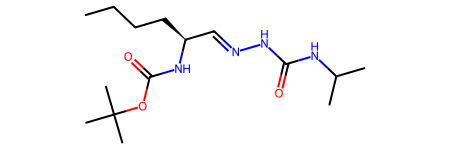

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCC[C@@H](C=O)NC(=O)OC(C)(C)C


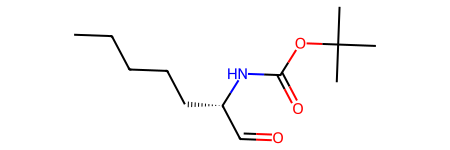

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCC[C@@H](C=O)NC(=O)OC(C)(C)C


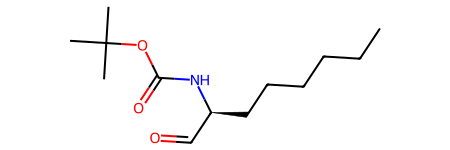

Neobsahuje ring
CCCC[C@@H](/C=N/NC(=O)NC)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

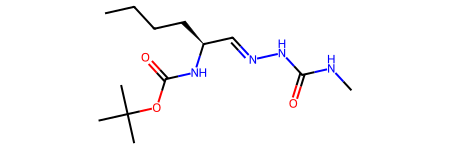

Neobsahuje ring
CC(C)(C)OC(=O)N[C@H](C=O)CCCC(F)(F)F


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

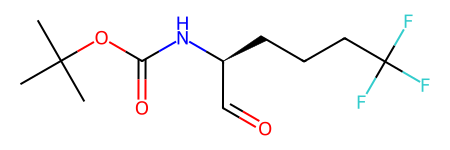

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](/C=N/NC(=O)NC(=O)OC)NC(=O)OC(C)(C)C


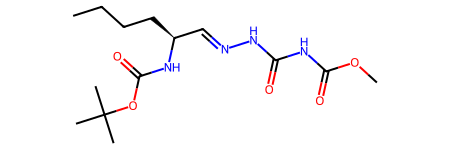

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](/C=N/NC(=O)NCCC(=O)OCC)NC(=O)OC(C)(C)C


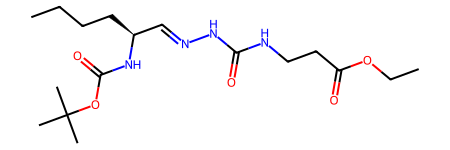

Neobsahuje ring
CCCC[C@@H](C=O)NC(=O)OC(CC(C)C)CC(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

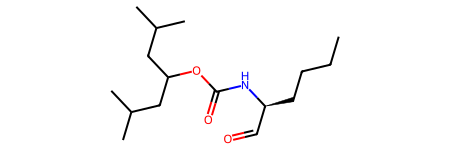

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](/C=N/NC(=O)SC(C)C)NC(=O)OC(C)(C)C


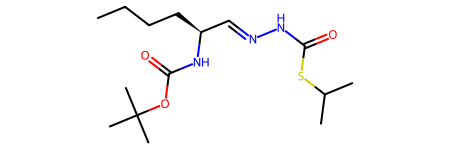

Neobsahuje ring
CCCC[C@@H](/C=N/N=C(\S)NC(C)C)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

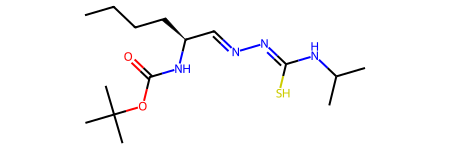

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](C=O)NC(=O)OC(CCC)CCC


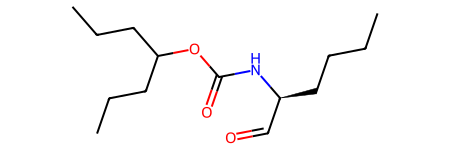

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC#CC[C@@H](C=O)NC(=O)OC(C)(C)C


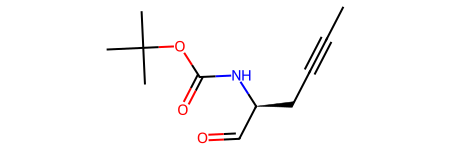

Neobsahuje ring
COCC[C@@H](C=O)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

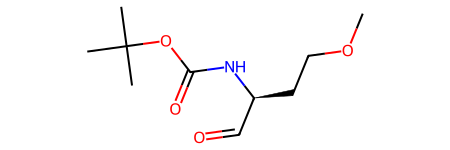

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](C=O)NC(=O)OC(C(C)C)C(C)C


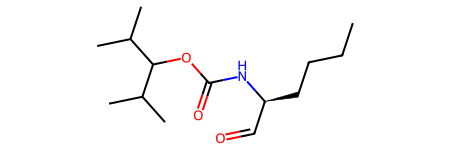

Neobsahuje ring
CCCC[C@H](C=O)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

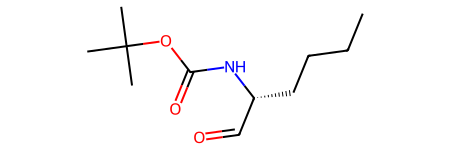

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
C/C=C/C[C@@H](C=O)NC(=O)OC(C)(C)C


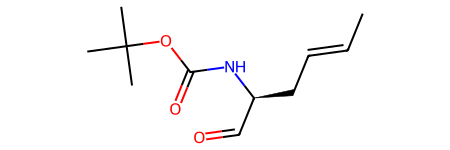

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](C=O)NC(=O)OC(CC)CC


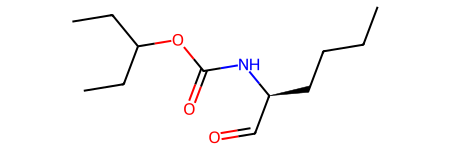

Neobsahuje ring
CCCC[C@@H](/C=N/NC(=O)OC(C)C)NC(=O)OC(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

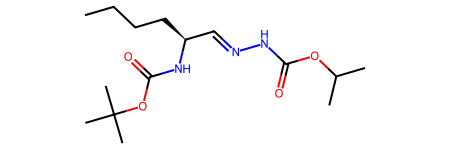

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

184_pic50.csv
Neobsahuje ring
O=C(O)CC[C@H](NC(=O)N[C@@H](CCC(=O)O)C(=O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


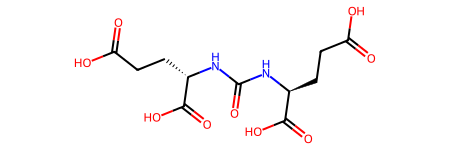

Neobsahuje ring
O=C(O)[C@@H](C[C@@H](F)C(=O)O)CP(=O)(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

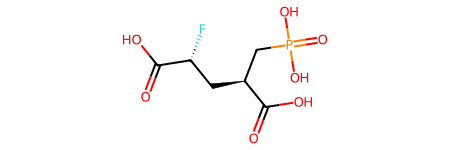

Neobsahuje ring
O=C(O)CCC(CC(=O)NO)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

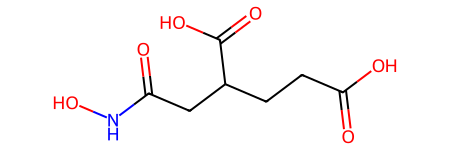

Neobsahuje ring
N[C@@H](CCC(=O)N[C@@H](COP(=O)(O)N[C@@H](CCC(=O)O)C(=O)O)C(=O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

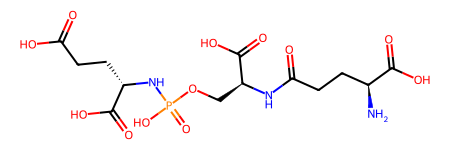

Neobsahuje ring
O=C([O-])CC[C@H](NP(=O)([O-])[O-])C(=O)[O-]


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

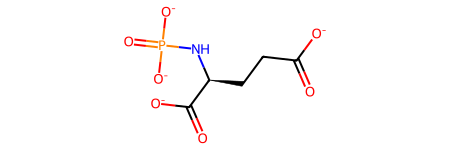

Neobsahuje ring
O=C(O)CCC(CCCC(=O)NO)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


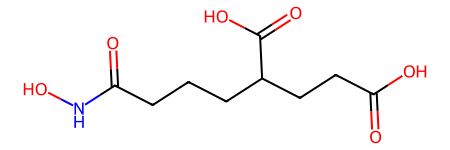

Neobsahuje ring
CC(C)C[C@@H](OC(=O)N[C@@H](CCC(=O)O)C(=O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


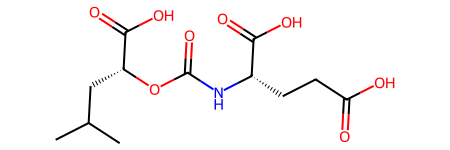

Neobsahuje ring
O=C(O)[C@H](C[C@H](F)C(=O)O)CP(=O)(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


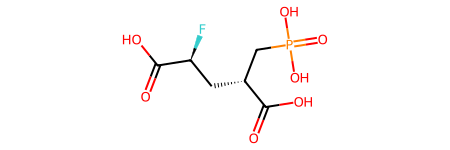

Neobsahuje ring
CC(C)C[C@@H](NC(=O)N[C@@H](CCC(=O)O)C(=O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

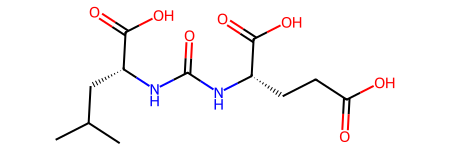

Neobsahuje ring
O=C(O)CCC(CCCS)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


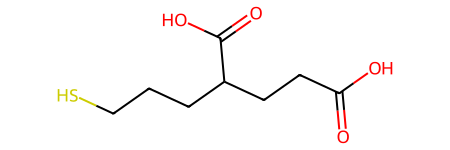

Neobsahuje ring
O=C(O)CCCC(CP(=O)(O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

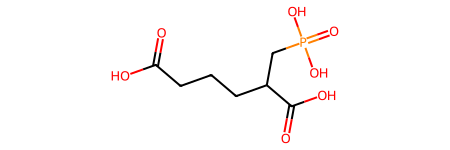

Neobsahuje ring
CC(C)C[C@H](NC(=O)O[C@@H](CCC(=O)O)C(=O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

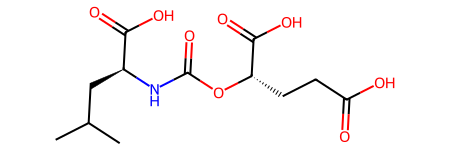

Neobsahuje ring
O=C(O)CC[C@H](CP(=O)(O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


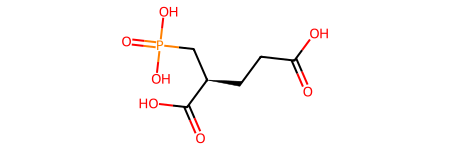

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@H](NC(=O)N[C@@H](CCC(=O)O)C(=O)O)C(=O)O


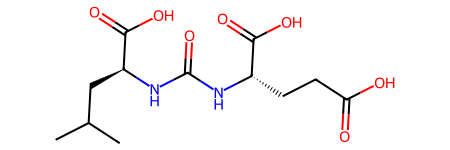

Neobsahuje ring
O=C([O-])CC[C@H](OP(=O)([O-])[O-])C(=O)[O-]


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

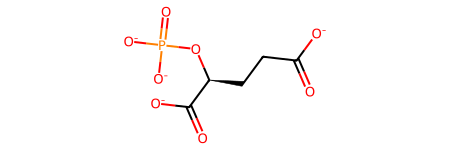

Neobsahuje ring
NCCCC[C@H](NC(=O)N[C@@H](CCC(=O)O)C(=O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

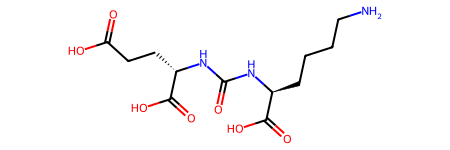

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
O=C(O)CC[C@H](NP(=O)(O)O)C(=O)O


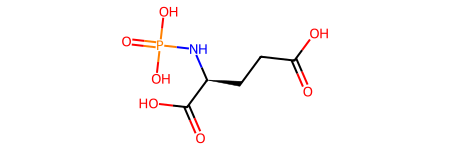

Neobsahuje ring
CC(C)C[C@@H](NC(=O)O[C@@H](CCC(=O)O)C(=O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


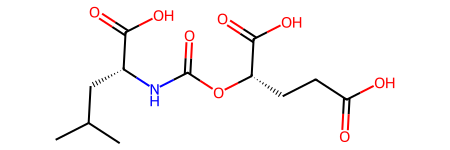

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
O=C(O)C(F)CC(CP(=O)(O)O)C(=O)O


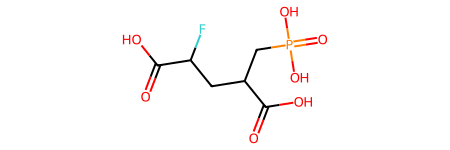

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
O=C(O)[C@H](C[C@@H](F)C(=O)O)CP(=O)(O)O


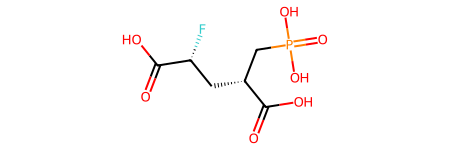

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
O=C(O)CCC(CP(=O)(O)O)C(=O)O


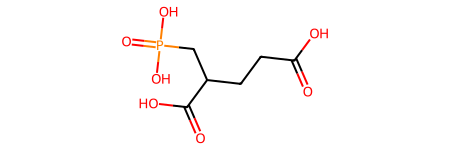

Neobsahuje ring
CC(C)C[C@H](OC(=O)N[C@@H](CCC(=O)O)C(=O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

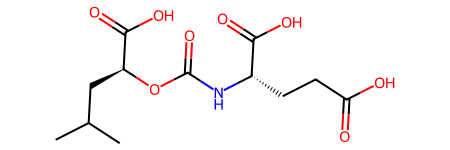

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@H](NC(=O)O[C@H](CCC(=O)O)C(=O)O)C(=O)O


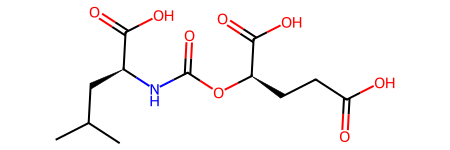

Neobsahuje ring
O=C(O)CCC(CCS)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

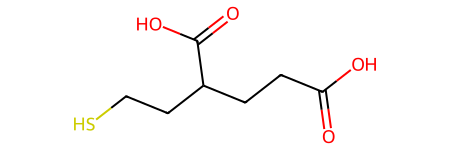

Neobsahuje ring
N[C@@H](CCC(=O)N[C@@H](COP(=O)([O-])O[C@@H](CCC(=O)O)C(=O)O)C(=O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

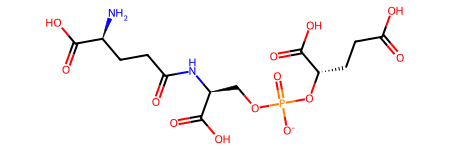

Neobsahuje ring
O=C(O)[C@@H](C[C@H](F)C(=O)O)CP(=O)(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)


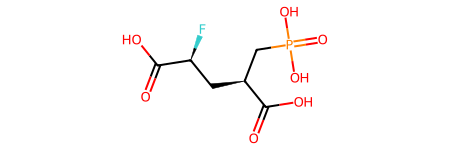

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11871_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

104445_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11727_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCNC(=O)N(C)CCCC/C=C\CCCCCCC(=O)O


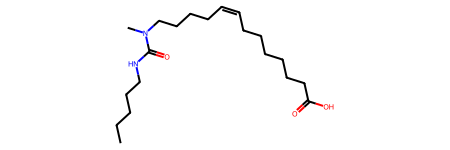

Neobsahuje ring
CCCCCCC(=O)NCCCCCCCC#CCCCC(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

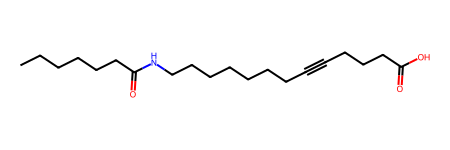

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Nepovedlo se udelat geneticky scaffold
Index 229
O=C(Nc1cccc(S(F)(F)(F)(F)F)c1)NC12CC3CC(CC(C3)O1)C2


[12:11:20] Explicit valence for atom # 8 C, 6, is greater than permitted


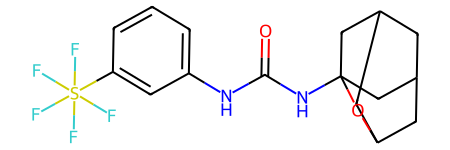

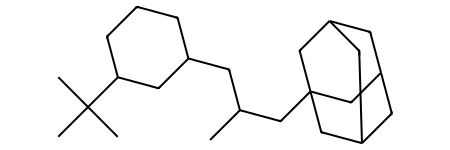

Nepovedlo se udelat generic - murcko scaffold
Index 229
O=C(Nc1cccc(S(F)(F)(F)(F)F)c1)NC12CC3CC(CC(C3)O1)C2


/tmp/ipykernel_11891/1112449295.py:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(mol)
[12:11:20] Explicit valence for atom # 8 C, 6, is greater than permitted


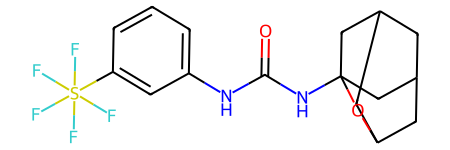

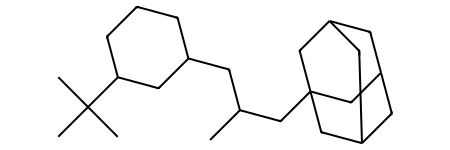

/tmp/ipykernel_11891/1112449295.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_csk'].loc[x] = MurckoScaffoldSmiles(Chem.MolToSmiles(mol))


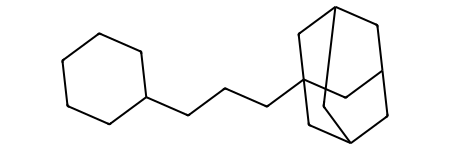

Neobsahuje ring
CCCCCNC(=O)NCCCCC#CCCCCCCC(=O)O


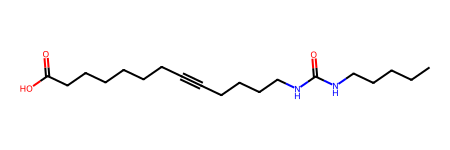

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCNC(=O)NCCCC/C=C\CCCCCCC(=O)N[C@@H](CC(=O)O)C(=O)O


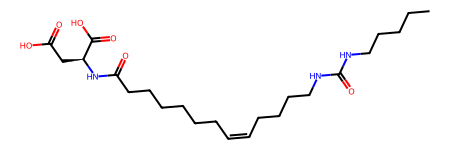

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCNC(=O)NCCCC/C=C\CCCCCCC(=O)OCCOCCOCCO


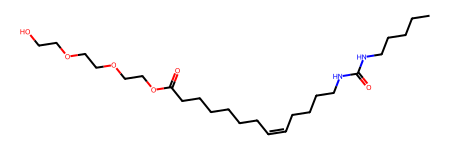

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCNC(=O)NCCCC/C=C\CCCCCCS(=O)(=O)O


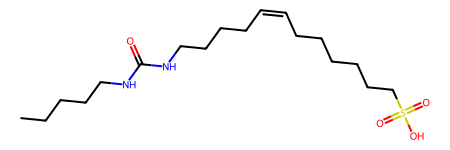

Neobsahuje ring
CCCCNC(=O)NCCCCC/C=C\CCCCCCC(=O)OC


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

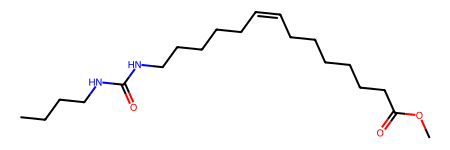

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCNC(=O)NCCCC/C=C\CCCCCCC(=O)O


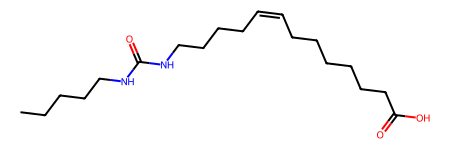

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCNC(=O)NCCCC/C=C\CCCCCCC(=O)N[C@@H](CC(=O)[O-])C(=O)[O-]


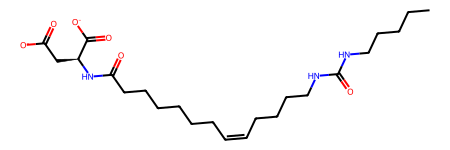

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCNC(=O)NCCCC/C=C\CCCCOCC(=O)O


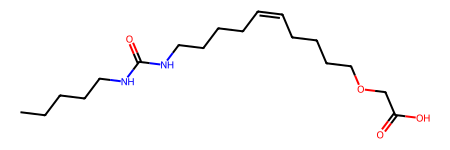

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCC(=O)NCCCC/C=C\CCCCCCC(=O)O


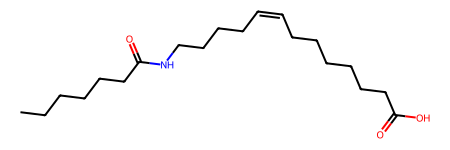

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCNC(=O)NCCCC/C=C\CCCCCCS(=O)(=O)[O-]


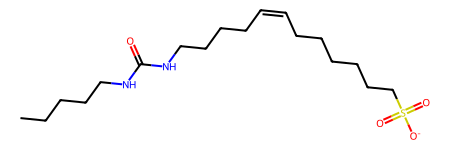

Neobsahuje ring
CCCCCNC(=O)NCCCC/C=C\CCCCCCC(=O)NS(C)(=O)=O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

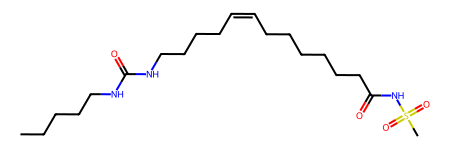

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCNC(=O)CCCC/C=C\CCCCCCC(=O)O


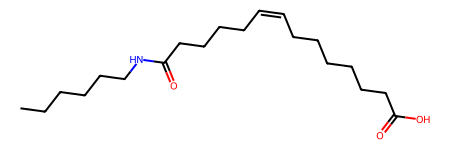

Neobsahuje ring
CCCCCNC(=O)NCCCC/C=C\CCCCCCC(=O)N[C@H](CC(=O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

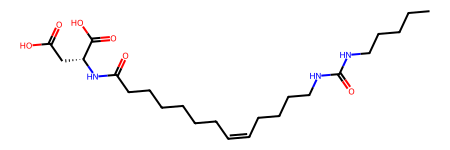

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCNC(=O)NCCCCCCC/C=C\CCCC(=O)O


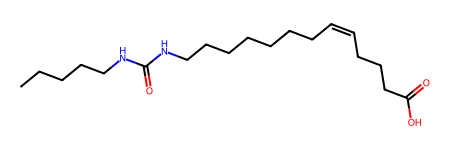

Neobsahuje ring
CCCCCNC(=S)NCCCC/C=C\CCCCCCC(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

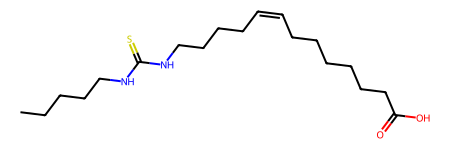

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCNC(=O)NCCC/C=C\CCCCCCC(=O)O


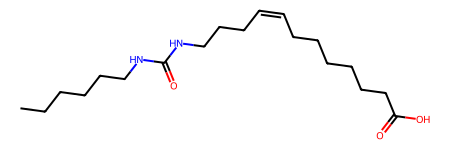

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCNC(=O)NCCCC/C=C/CCCCCCC(=O)O


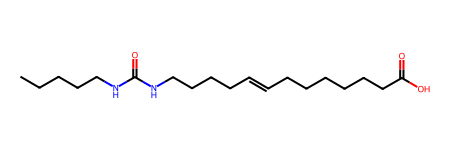

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

12252_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@H](NC(=O)[C@H](CC(N)=O)NC(=O)[C@@H](NC(=O)[C@@H](N)CCC(=O)O)C(C)C)[C@@H](O)C[C@@H](C)C(=O)N[C@@H](C)C(=O)O


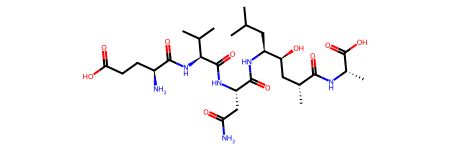

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCNC(=O)[C@H](C)C[C@H](O)[C@H](CC(C)C)NC(=O)[C@H](C)N(C)C(=O)[C@H](CC(C)C)NC(C)=O


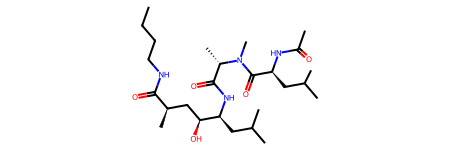

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@H](NC(=O)[C@H](CC(N)=O)NC(=O)[C@@H](NC(=O)[C@@H](N)CCC(=O)O)C(C)C)[C@@H](O)CC(=O)N[C@H](C(=O)N[C@@H](C)C(=O)N[C@@H](CCC(=O)O)C(N)=O)C(C)C


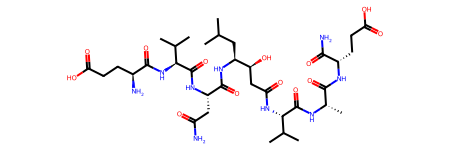

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CSCC[C@H](NC(=O)[C@@H](NC(C)=O)C(C)C)C(=O)NC(CC(C)C)C(O)CC(=O)N[C@H](C(=O)N[C@@H](C)C(=O)N[C@@H](CCC(=O)O)C(=O)O)C(C)C


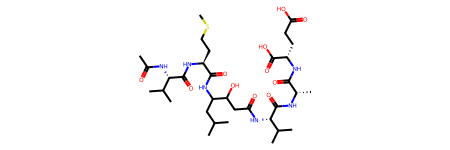

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCNC(=O)[C@H](C)C[C@H](O)[C@H](CC(C)C)NC(=O)[C@H](CCSC)NC(=O)[C@@H](NC(C)=O)C(C)C


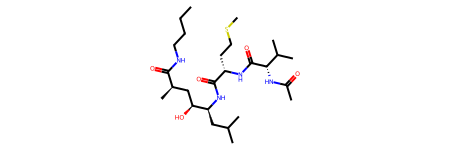

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCNC(=O)[C@H](C)C[C@H](O)[C@H](CC(C)C)NC(=O)[C@H](C)NC(=O)[C@H](CC(C)C)NC(C)=O


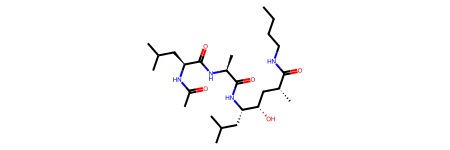

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@H](NC(=O)[C@H](CC(N)=O)NC(=O)[C@@H](NC(=O)[C@@H](N)CCC(=O)O)C(C)C)[C@@H](O)CC(=O)N[C@H](C(=O)N[C@@H](C)C(N)=O)C(C)C


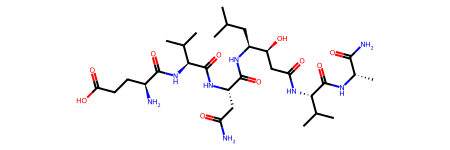

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCNC(=O)[C@H](C)C[C@H](O)[C@H](CC(C)C)NC(=O)[C@H](CCSC)NC(=O)[C@H](CC(C)C)NC(C)=O


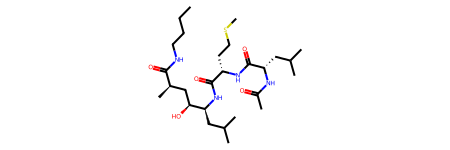

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

20151_pic50.csv
Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)C(C)C)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

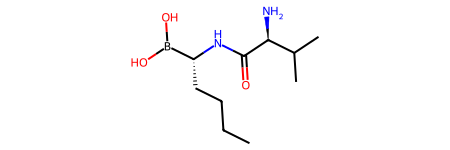

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)[C@H](N)C(=O)N[C@@H](C)B(O)O


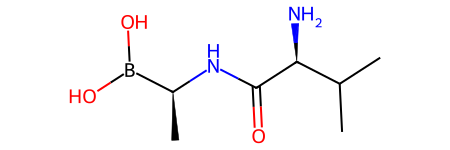

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCCC)B(O)O


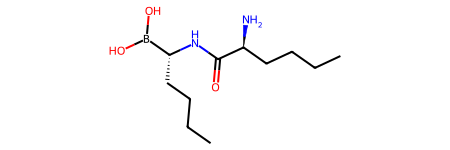

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCCCN)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

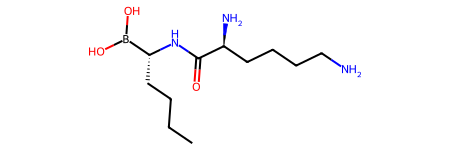

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CC)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

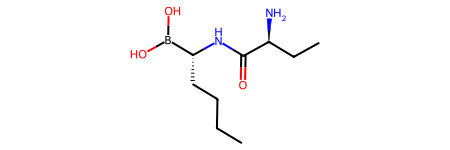

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

12268_pic50.csv
Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCC)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

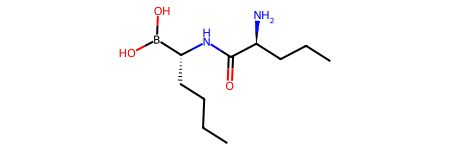

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)C(C)C)B(O)O


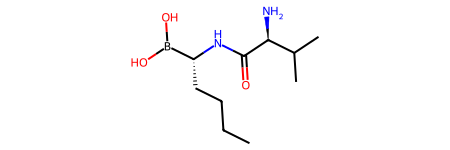

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCCN)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

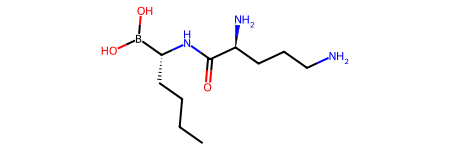

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCN)B(O)O


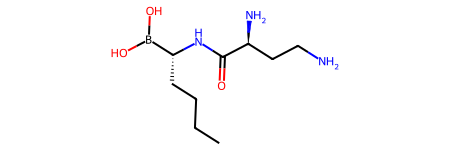

Neobsahuje ring
CC(C)[C@H](N)C(=O)N[C@@H](C)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

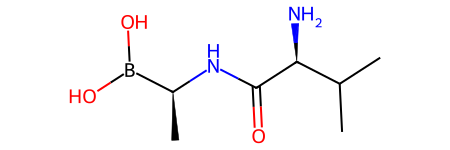

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@H](C)N)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

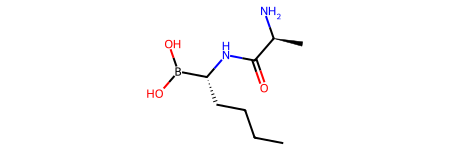

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCCC)B(O)O


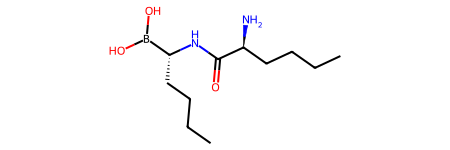

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCCCN)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

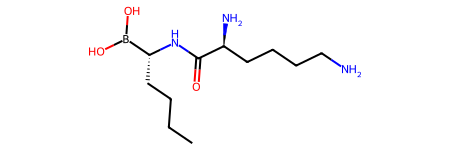

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CC)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

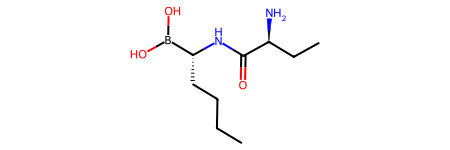

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@H](NC(=O)[C@@H](N)CCN)B(O)O


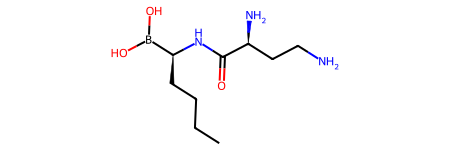

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CN)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

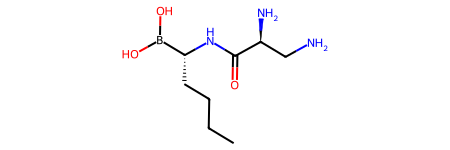

11624_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@@H](CC(=O)O)C(=O)N[C@@H](CCC(=O)O)C(=O)N[C@H](C(=O)N[C@H](C=O)CC(=O)O)C(C)C


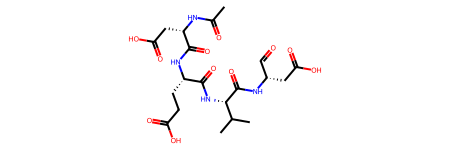

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@@H](CC(=O)O)C(=O)N[C@@H](CCC(=O)O)C(=O)N[C@H](C(=O)N[C@H](CC=O)CC(=O)O)C(C)C


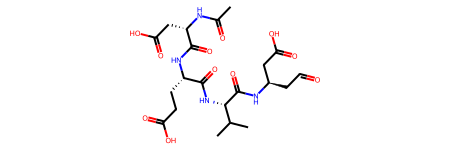

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

237_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
C[C@H](N)C(=O)CCCC[C@@H](C)C(=O)O


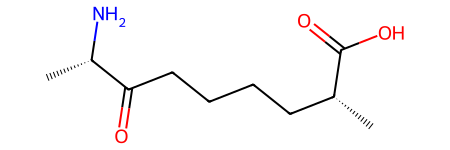

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

12_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

243_pic50.csv
Neobsahuje ring
CC(C)CC(N)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

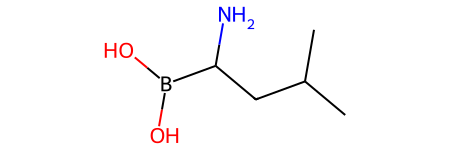

Neobsahuje ring
CSCC(N)CS


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

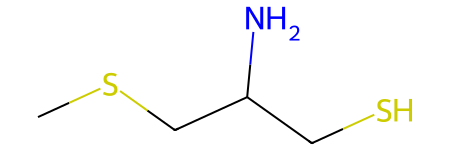

Neobsahuje ring
CSCCC(N)CS


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

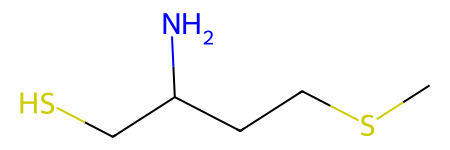

Neobsahuje ring
C[S+]([O-])CCC(N)CS


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

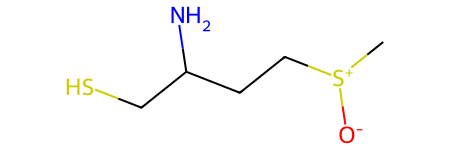

Neobsahuje ring
C[S+]([O-])CC(N)CS


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

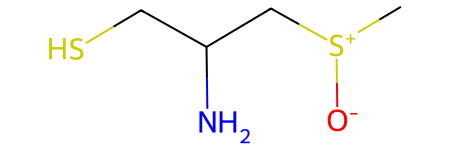

11942_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

12587_pic50.csv
11287_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

105346_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

105199_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

100186_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

102753_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

12862_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

10244_pic50.csv
Neobsahuje ring
CC[C@H](C)[C@H](NC(C)=O)C(=O)N[C@@H](CCC(=O)O)C(=O)N[C@H](C(=O)N[C@H](C=O)CC(=O)O)[C@@H](C)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

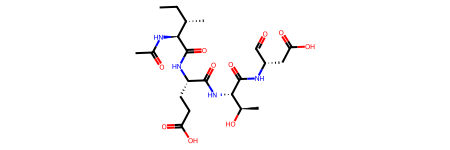

Neobsahuje ring
CC(=O)N[C@@H](CC(=O)O)C(=O)N[C@@H](CCC(=O)O)C(=O)N[C@H](C(=O)N[C@H](C=O)CC(=O)O)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

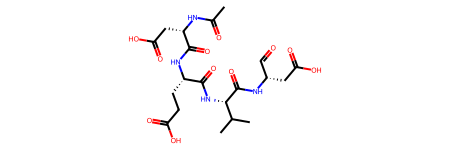

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

10331_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11140_pic50.csv
Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCC)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

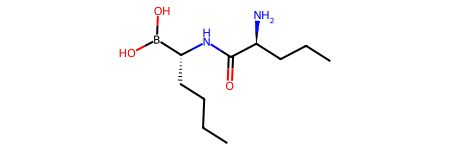

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCCC)B(O)O


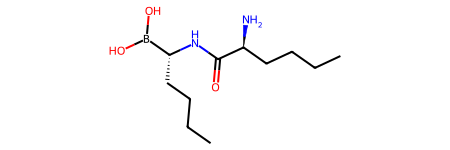

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
C[C@H](NC(=O)[C@H](C)N)B(O)O


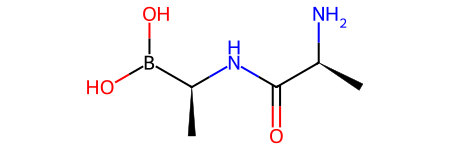

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)[C@H](N)C(=S)N[C@@H](C)B(O)O


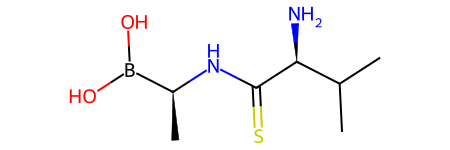

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)[C@H](N)C(=O)N[C@@H](C)B(O)O


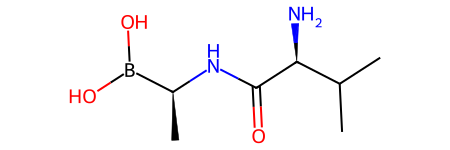

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11154_pic50.csv
Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@@H](CC(=O)NO)CC(C)C)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

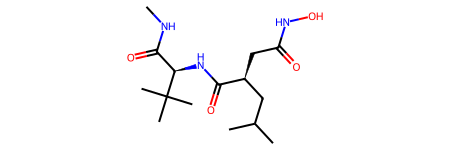

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


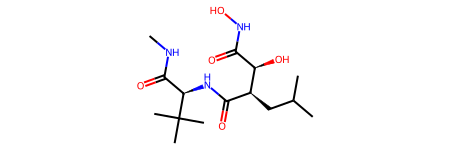

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11968_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

38_pic50.csv
Neobsahuje ring
CCCCCCCCNC(=O)NCCCCCC


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

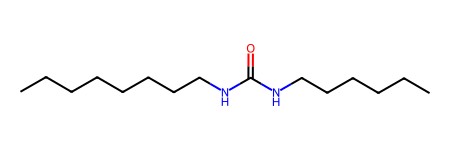

Neobsahuje ring
CCCCCCCCCCCCNC(=O)NCCCC


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

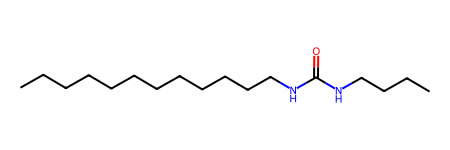

Neobsahuje ring
CCCCCCCCCCCCNC(=O)NCC(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

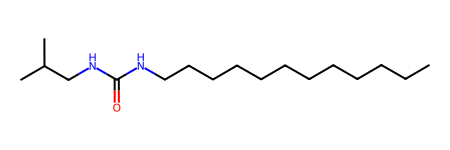

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCCCCCNC(=O)NCCCC


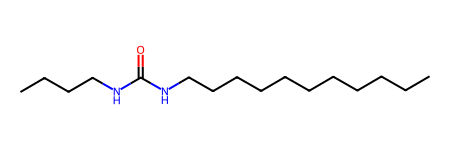

Neobsahuje ring
CCCCCCCCNC(=O)NCCCCC


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

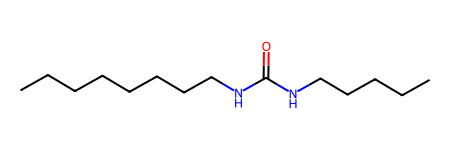

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCCNC(=O)OC


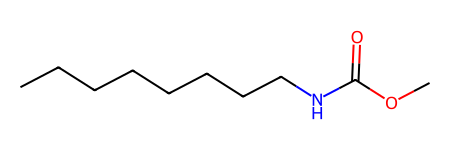

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCCNC(=O)NCCC


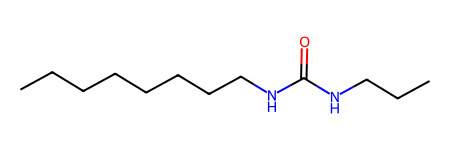

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

10131_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
COC(=O)N[C@H](C(=O)NC(CC(=O)O)C(=O)CF)C(C)C


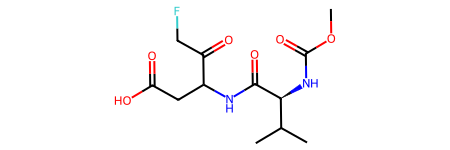

Neobsahuje ring
CC(=O)N[C@@H](CC(=O)O)C(=O)N[C@@H](CCC(=O)O)C(=O)N[C@H](C(=O)N[C@H](CC=O)CC(=O)O)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

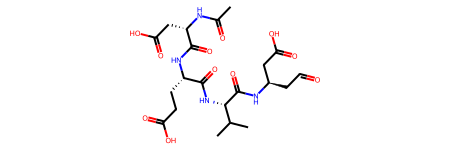

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(=O)N[C@H](C(=O)NC(CC(=O)O)C(=O)CF)C(C)C


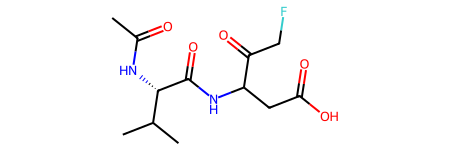

Neobsahuje ring
CC(C)COC(=O)N[C@H](C(=O)NC(CC(=O)O)C(=O)CF)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

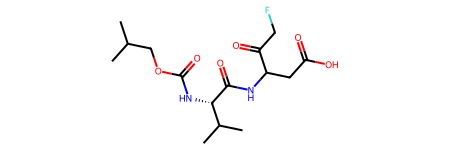

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCC(=O)N[C@H](C(=O)NC(CC(=O)O)C(=O)CF)C(C)C


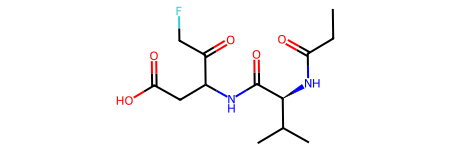

Neobsahuje ring
CC(=O)N[C@@H](CC(=O)O)C(=O)N[C@@H](CCC(=O)O)C(=O)N[C@H](C(=O)N[C@H](C=O)CC(=O)O)C(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

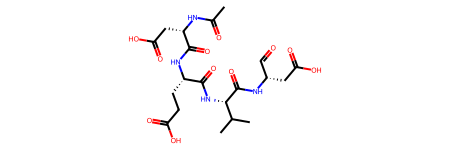

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)[C@H](NC(=O)CCC(=O)O)C(=O)NC(CC(=O)O)C(=O)CF


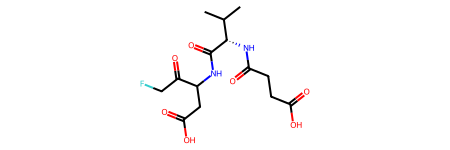

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

11110_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


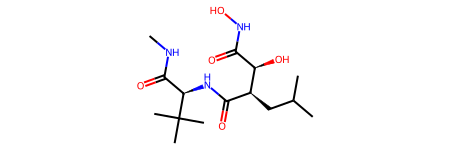

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)C(NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


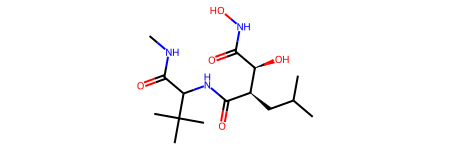

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

236_pic50.csv
Neobsahuje ring
CC(C)C[C@@H](CC(=O)N[C@@H](CO)C(=O)O)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

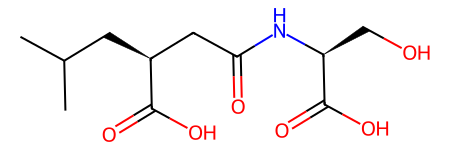

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@@H](CC(=O)O)C(=O)N[C@@H](CO)C(=O)O


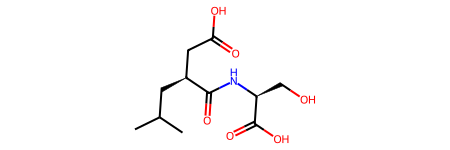

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

20154_pic50.csv
Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCC)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

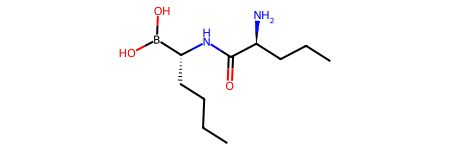

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)C(C)C)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

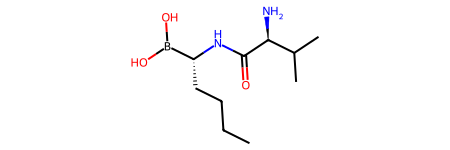

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCCN)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

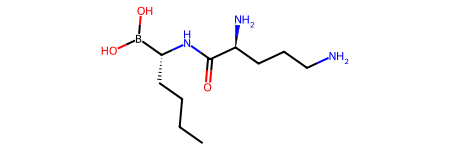

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCN)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

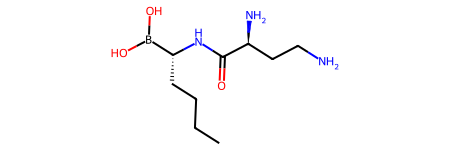

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCCC)B(O)O


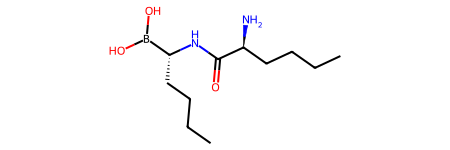

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CCCCN)B(O)O


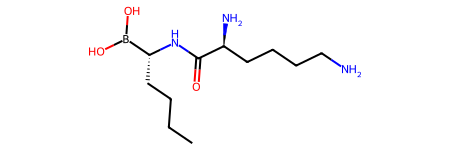

Neobsahuje ring
CCCC[C@@H](NC(=O)[C@@H](N)CC)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

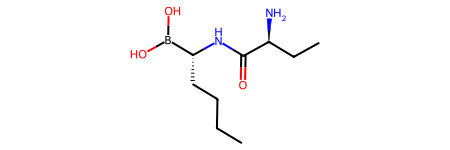

Neobsahuje ring
CCCC[C@H](NC(=O)[C@@H](N)CCN)B(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

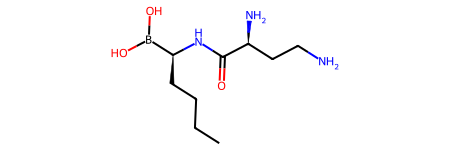

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

10323_pic50.csv
Neobsahuje ring
N=C(N)NCCCC(CS)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

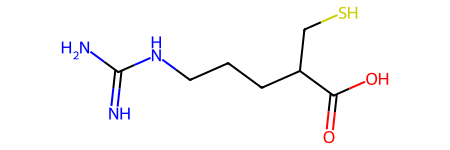

Neobsahuje ring
CCC(=O)[Se]CC(CCCCCN)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

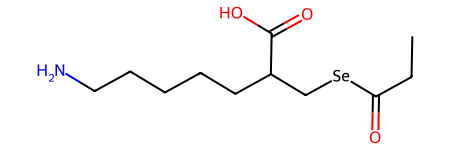

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
NCCCCCC(C[Se][Se]CC(CCCCCN)C(=O)O)C(=O)O


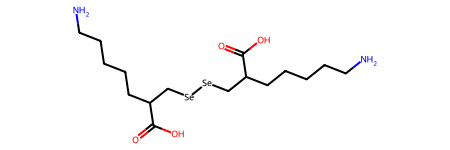

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCOC(=O)C(CCCCCN)C[Se]C(=O)CC


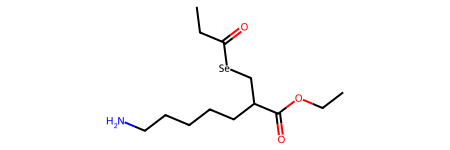

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
NC(N)=CCCSCC(CS)C(=O)O


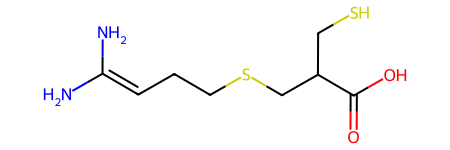

Neobsahuje ring
NCCCCCC(CS)C(=O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

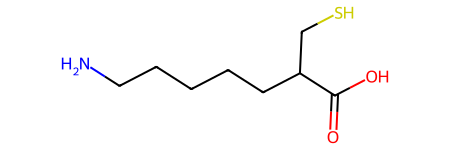

13001_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
C=CC[C@](C)(C(=O)NO)[C@@H](CC(C)C)C(=O)N[C@H](C(=O)NC)C(C)(C)C


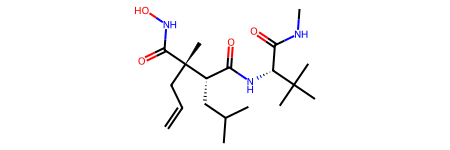

Neobsahuje ring
CCCCCCCCCCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

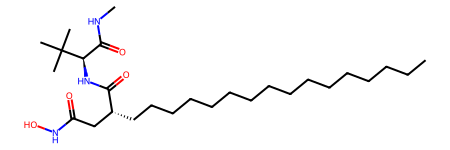

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)P(=O)(O)O


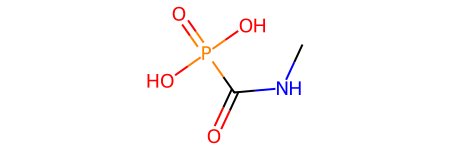

Neobsahuje ring
CNC(=O)C(NC(=O)C(CC(C)C)C(O)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

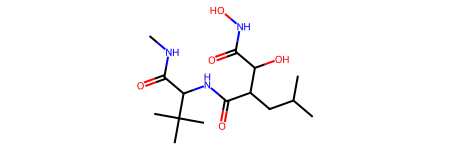

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@@H](CC(=O)NO)CC(C)C)C(C)(C)C


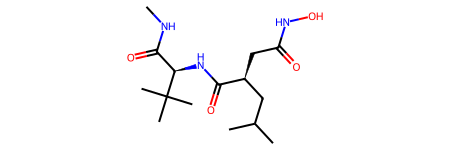

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCCCCCCCCC[C@H](CC(=O)O)C(=O)N[C@H](C(=O)NC)C(C)(C)C


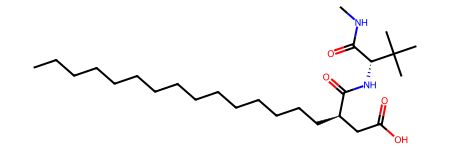

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CCCCCCCCCCCCCCO)CC(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

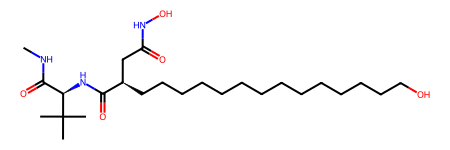

Neobsahuje ring
CCN(CC)C(=O)P(=O)(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

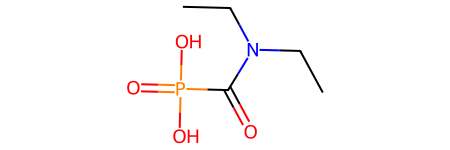

Neobsahuje ring
CCCCCCCCCCCCCCCC[C@H](CC(=O)O)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

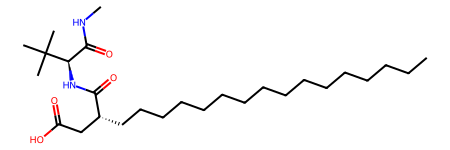

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


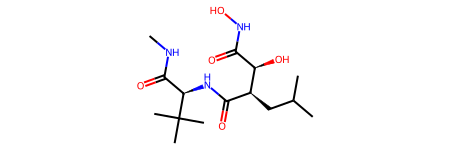

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCCCCCCCC[C@H](CC(=O)O)C(=O)N[C@H](C(=O)NC)C(C)(C)C


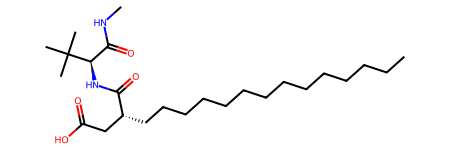

Neobsahuje ring
C=CC[C@H](C(=O)NO)[C@@H](CC(C)C)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

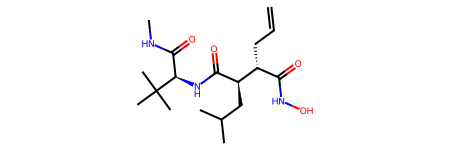

Neobsahuje ring
CNC(=O)C(NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

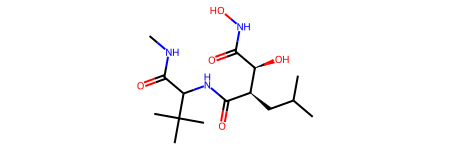

Neobsahuje ring
CCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

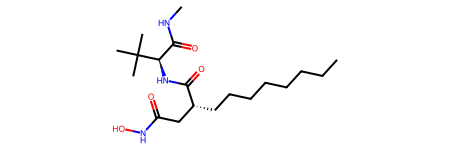

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCC[C@H](CC(=O)O)C(=O)N[C@H](C(=O)NC)C(C)(C)C


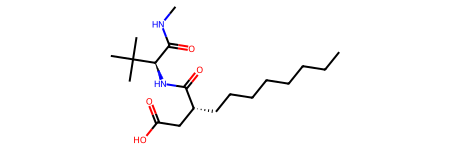

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


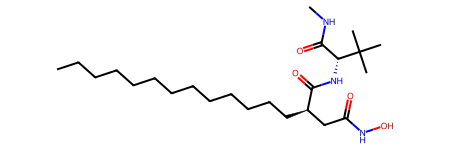

Neobsahuje ring
CC(C)NC(=O)P(=O)(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

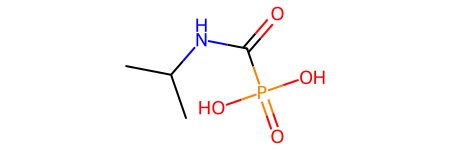

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


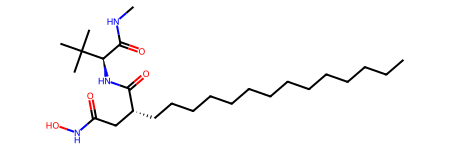

Neobsahuje ring
CCCNC(=O)P(=O)(O)O


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

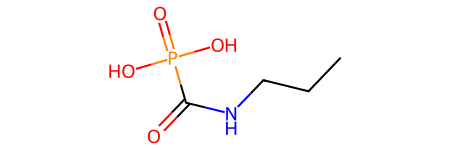

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CCCCCCCCCCCCC[C@H](CC(=O)O)C(=O)N[C@H](C(=O)NC)C(C)(C)C


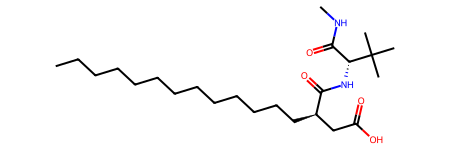

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

10498_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)C[C@H](CC(=O)NO)C(=O)N[C@@H](CC(C)C)C(=O)N[C@@H](C)C=O


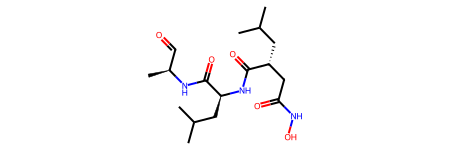

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CC(C)CC(=O)N[C@H](C(=O)N[C@H](C(=O)N[C@@H](CC(C)C)[C@@H](O)CC(=O)N[C@@H](C)C(=O)N[C@@H](CC(C)C)[C@@H](O)CC(=O)O)C(C)C)C(C)C


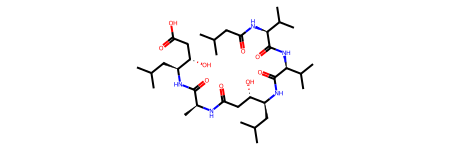

Neobsahuje ring
CC(=O)N[C@@H](CC(C)C)C(=O)N[C@@H](CC(C)C)C(=O)N[C@H](C=O)CCCNC(=N)N


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

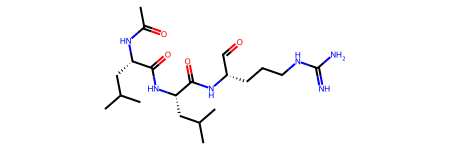

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

12738_pic50.csv
Neobsahuje ring
C=CC[C@H](C(=O)NO)[C@@H](CC(C)C)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

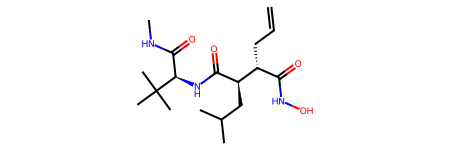

Neobsahuje ring
CNC(=O)C(NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

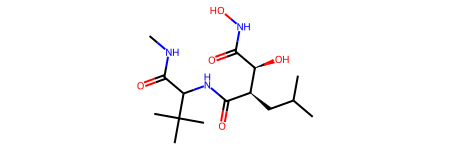

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CCCCCCCCCCCCCCO)CC(=O)NO)C(C)(C)C


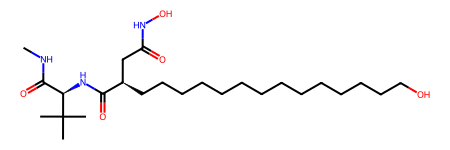

Neobsahuje ring
CCCCCCCC[C@H](CC(=O)NO)C(=O)N[C@H](C(=O)NC)C(C)(C)C


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

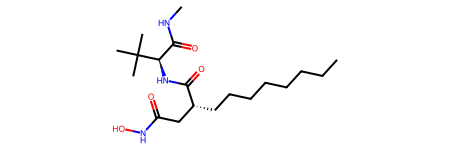

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

Neobsahuje ring
CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](O)C(=O)NO)C(C)(C)C


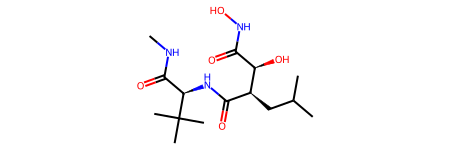

/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

10074_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

193_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

42_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

100155_pic50.csv


/tmp/ipykernel_11891/1112449295.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['canonical_smiles'][x] = Chem.MolToSmiles(res)
/tmp/ipykernel_11891/1112449295.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_murcko'].loc[x] = MurckoScaffoldSmiles(\
/tmp/ipykernel_11891/1112449295.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['scaffolds_generic'].loc[x] = Chem.MolToSmiles(MakeScaffoldGeneric\
/tmp/

In [84]:
proteazy_ic50,prumety_proteazy_ic50 = nacitani_dat_zpracovani\
('protease_threshold_1000nM_only_IC50')

## Funkce pro vypocet statistiky
V dataFrame nuclear_all,proteaz jsou vsechny slouceniny a ted z toho vypocitame statistiku obsazeni IC50,EC50,ki, Kd

In [85]:
def unique(list1):
     # initialize a null list
    unique_list = []
    list1.sort()
     # traverse for all elements
    for x in list1:
        # check if exists in unique_list or not
        if x not in unique_list:
            unique_list.append(x)
    return unique_list

In [86]:
def function_pro_statisticu(df, list_uniq_standd_type):
    
    statistic = pd.DataFrame(columns = list_uniq_standd_type)
    statistic.loc[len(statistic)] = 0
    
    statistic['pref_name'] = f"{df['pref_name'][0]}"
    list_uniq_chembl = pd.unique(pd.Series(df['chembl_id']))

    for x in list_uniq_chembl:
        a = df[df['chembl_id']==x]
        b = unique(a['stand_type'].tolist())
        b = str(b).replace("[", "")
        b = str(b).replace("]", "")
        b = str(b).replace("'", "")
        b = str(b).replace(", ", "+")        
        statistic[b].loc[0] += 1     
    return statistic

In [87]:
def vypocet_statistiky(names, all_data_set):
    #nejprve najdeme hodnoty unikatnich assay, ktere tam vznikaji a pak vypocitame statistiku
    #hodnoty unikatnich assay budou v list_uniq_stand_type
    list_uniq_chembl = pd.unique(pd.Series(all_data_set['chembl_id']))
    list_uniq_standd_type = []
    for x in list_uniq_chembl:
        a = all_data_set[all_data_set['chembl_id']==x]
        #print(a['stand_type'].tolist())
        b = unique(a['stand_type'].tolist())
        b = str(b).replace("[", "")
        b = str(b).replace("]", "")
        b = str(b).replace("'", "")
        b = str(b).replace(", ", "+")
    
        if b not in list_uniq_standd_type:
            list_uniq_standd_type.append(b)
    
    list_uniq_standd_type.sort(key=len)
    list_uniq_standd_type.insert(0,'pref_name')
    display(list_uniq_standd_type)

    df = pd.DataFrame(columns = ['molregno', 'stand_type', 
                                    'pchembl_value', 'stand_value',
                                    'canonical_smiles', 'stand_inchi',
                                   'chembl_id', 'tid','pref_name'])
    print(list_uniq_standd_type)
    statistica = pd.DataFrame(columns = list_uniq_standd_type)

    for root, dirs, files in os.walk(f"chembl_data/sets/{names}/", \
                                     topdown=False):
        for name in files:
            
            dff = pd.read_csv(f"{root}{name}",header=None)
            dff.columns =['molregno', 'stand_type', 
                                    'pchembl_value', 'stand_value',
                                    'canonical_smiles', 'stand_inchi',
                                   'chembl_id', 'tid','pref_name']
            
            for x in range(len(dff)):
                #print(x)
                if NumAromaticRings(Chem.MolFromSmiles(dff['canonical_smiles'][x])) == 0 and\
                NumAliphaticRings(Chem.MolFromSmiles(dff['canonical_smiles'][x])) == 0:
                    dff = dff.drop([x])
                     
            dff.reset_index(level=0, inplace=True)
            
            statistic = function_pro_statisticu(dff, list_uniq_standd_type)
            statistica = pd.concat([statistica, statistic])
    
            df = pd.concat([df, dff])
            
    df.reset_index(level=0, inplace=True)

    return statistica
    

In [88]:
statistika_all = vypocet_statistiky('all_together_nuclear_threshold_100nM',
                                                    nucler_all)

['pref_name',
 'Ki',
 'Kd',
 'IC50',
 'EC50',
 'IC50+Ki',
 'EC50+Kd',
 'EC50+Ki',
 'IC50+Kd',
 'EC50+IC50',
 'EC50+Kd+Ki',
 'EC50+IC50+Ki',
 'EC50+IC50+Kd']

['pref_name', 'Ki', 'Kd', 'IC50', 'EC50', 'IC50+Ki', 'EC50+Kd', 'EC50+Ki', 'IC50+Kd', 'EC50+IC50', 'EC50+Kd+Ki', 'EC50+IC50+Ki', 'EC50+IC50+Kd']


/tmp/ipykernel_11891/3728218880.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  statistic[b].loc[0] += 1
/tmp/ipykernel_11891/3728218880.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  statistic[b].loc[0] += 1
/tmp/ipykernel_11891/3728218880.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  statistic[b].loc[0] += 1
/tmp/ipykernel_11891/3728218880.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a sl

In [89]:
statistika_proteaz_all = vypocet_statistiky('all_together_protease_threshold_1000nM',
                                                    proteaz_all)

['pref_name',
 'Ki',
 'Kd',
 'IC50',
 'EC50',
 'Kd+Ki',
 'IC50+Ki',
 'EC50+Ki',
 'IC50+Kd',
 'EC50+IC50',
 'IC50+Kd+Ki',
 'EC50+IC50+Ki']

['pref_name', 'Ki', 'Kd', 'IC50', 'EC50', 'Kd+Ki', 'IC50+Ki', 'EC50+Ki', 'IC50+Kd', 'EC50+IC50', 'IC50+Kd+Ki', 'EC50+IC50+Ki']


/tmp/ipykernel_11891/3728218880.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  statistic[b].loc[0] += 1
/tmp/ipykernel_11891/3728218880.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  statistic[b].loc[0] += 1
/tmp/ipykernel_11891/3728218880.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  statistic[b].loc[0] += 1
/tmp/ipykernel_11891/3728218880.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a sl

/tmp/ipykernel_11891/3728218880.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  statistic[b].loc[0] += 1
/tmp/ipykernel_11891/3728218880.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  statistic[b].loc[0] += 1
/tmp/ipykernel_11891/3728218880.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  statistic[b].loc[0] += 1
/tmp/ipykernel_11891/3728218880.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a sl

/tmp/ipykernel_11891/3728218880.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  statistic[b].loc[0] += 1
/tmp/ipykernel_11891/3728218880.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  statistic[b].loc[0] += 1
/tmp/ipykernel_11891/3728218880.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  statistic[b].loc[0] += 1
/tmp/ipykernel_11891/3728218880.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a sl

# STATISTIKA

Statistika zastoupeni EC50,IC50,Ki,Kd pro jaderne receptory

In [90]:
statistika_all.sum()

pref_name       p53-binding protein Mdm-2 Retinoic acid recept...
Ki                                                           1458
Kd                                                            198
IC50                                                         6883
EC50                                                         3302
IC50+Ki                                                       421
EC50+Kd                                                        35
EC50+Ki                                                       650
IC50+Kd                                                       161
EC50+IC50                                                    1037
EC50+Kd+Ki                                                      0
EC50+IC50+Ki                                                  160
EC50+IC50+Kd                                                   24
dtype: object

Statistika zastoupeni EC50,IC50,Ki,Kd pro proteazy

In [91]:
statistika_proteaz_all.sum()

pref_name       Coagulation factor VII ADAM10 Beta secretase 2...
Ki                                                          23974
Kd                                                              5
IC50                                                        61904
EC50                                                           77
Kd+Ki                                                           2
IC50+Ki                                                      1465
EC50+Ki                                                        32
IC50+Kd                                                        38
EC50+IC50                                                     448
IC50+Kd+Ki                                                      9
EC50+IC50+Ki                                                   18
dtype: object

# Tanimotova similarity, pocet sloucenin, unikatni scaffoldy

ONLY IC50

Jaderny

In [49]:
prumery_ic50.sort_values(by=['Tanim_sim_csk'],ascending=True)[:5]

,pref_name,pocet_slouc,Tanim_sim_murc,unik_scaf_murc,Tanim_sim_gener,unik_scaf_gener,Tanim_sim_csk,unik_scaf_csk
9,Androgen Receptor,636,0.115706,197,0.171432,489,0.237702,105
16,Progesterone receptor,567,0.121039,191,0.177302,439,0.244397,99
0,Mineralocorticoid receptor,241,0.125105,95,0.172062,176,0.245829,61
5,Glucocorticoid receptor,1156,0.122074,408,0.163866,783,0.257478,206
8,Nuclear receptor ROR-gamma,1070,0.144833,413,0.178250,770,0.258292,242


PROTEAZY

In [34]:
prumety_proteazy_ic50.sort_values(by=['Tanim_sim_csk'],ascending=True)[:10]

,pref_name,pocet_slouc,Tanim_sim_murc,unik_scaf_murc,Tanim_sim_gener,unik_scaf_gener,Tanim_sim_csk,unik_scaf_csk
38,Beta-secretase 1,4651,0.120563,1593,0.163583,2917,0.223114,683
63,Carboxypeptidase B2 isoform A,157,0.120000,60,0.236452,117,0.251834,44
67,Chymase,263,0.161642,77,0.187230,199,0.264015,47
37,Epoxide hydratase,1676,0.155131,706,0.195846,1270,0.265107,373
0,Beta secretase 2,487,0.151356,196,0.196238,372,0.266654,106
21,Serine protease hepsin,49,0.163000,32,0.239420,44,0.267292,31
6,Cathepsin S,1385,0.130093,635,0.181755,1047,0.268234,363
8,Leukocyte elastase,1068,0.162548,439,0.222067,742,0.268785,217
55,Dipeptidyl peptidase IV,2998,0.144842,1076,0.165450,2129,0.271929,488
45,Urokinase-type plasminogen activator,126,0.151615,68,0.209181,115,0.275068,57


Jaderny

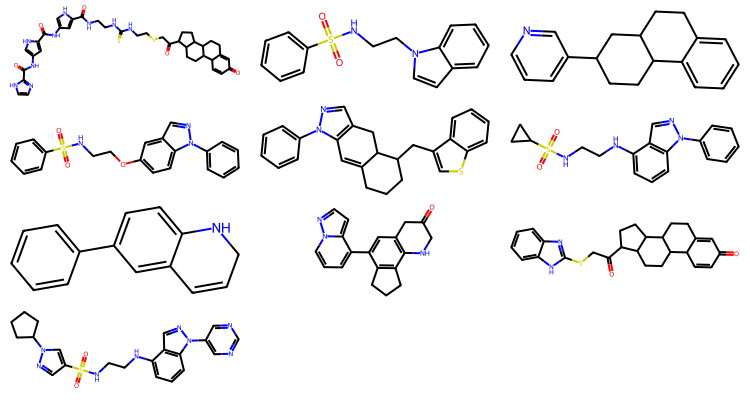

In [53]:
IPythonConsole.drawOptions.drawMolsSameScale=False
mol = [Chem.MolFromSmiles(x) for x in nucler_ic50[nucler_ic50['pref_name']=='Glucocorticoid receptor ']['scaffolds_murcko']]
Draw.MolsToGridImage(mol[:10],molsPerRow=3,subImgSize=(250, 100))

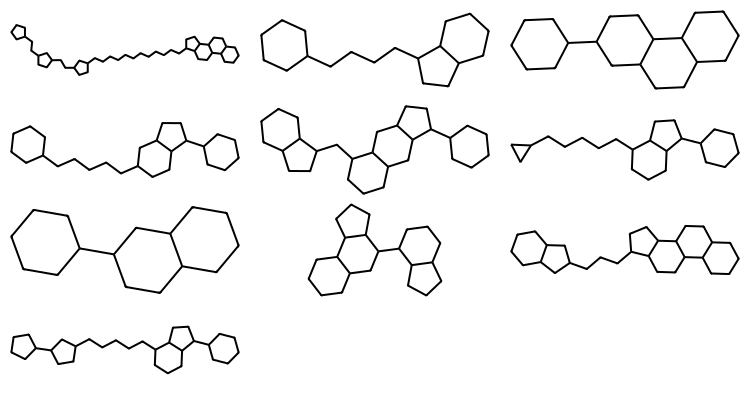

In [55]:
mol = [Chem.MolFromSmiles(x) for x in nucler_ic50[nucler_ic50['pref_name']=='Glucocorticoid receptor ']['scaffolds_csk']]
Draw.MolsToGridImage(mol[:10],molsPerRow=3,subImgSize=(250, 100))

PROTEAZY

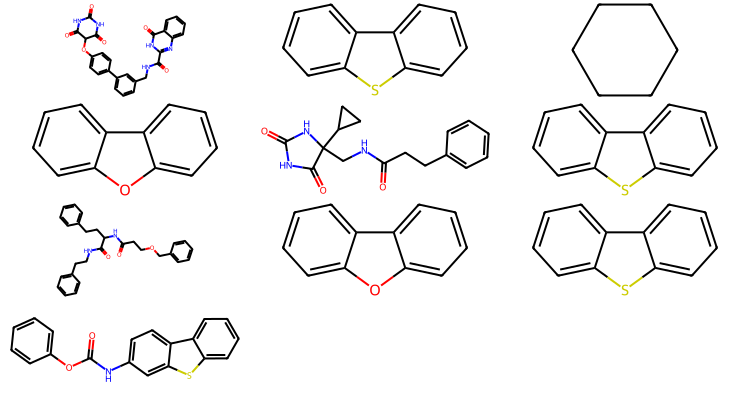

In [62]:
mol = [Chem.MolFromSmiles(x) for x in proteazy_ic50[proteazy_ic50['pref_name']=='Matrix metalloproteinase 12 ']\
       ['scaffolds_murcko']]
Draw.MolsToGridImage(mol[:10],molsPerRow=3,subImgSize=(250, 100))

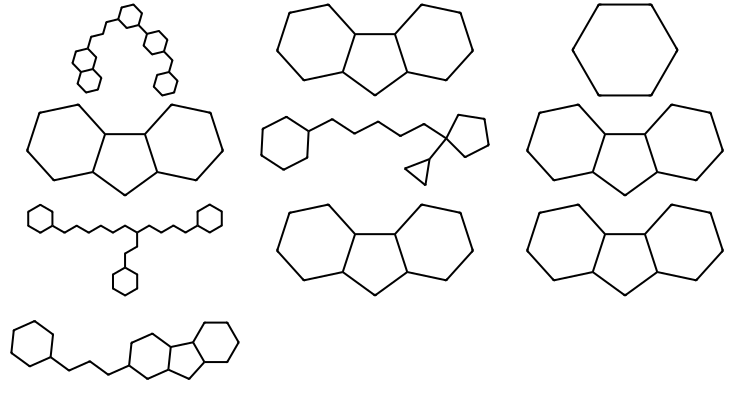

In [63]:
mol = [Chem.MolFromSmiles(x) for x in proteazy_ic50\
       [proteazy_ic50['pref_name']=='Matrix metalloproteinase 12 ']['scaffolds_csk']]
Draw.MolsToGridImage(mol[:10],molsPerRow=3,subImgSize=(250, 100))

In [64]:
nucler_all

,level_0,molregno,stand_type,pchembl_value,stand_value,canonical_smiles,stand_inchi,chembl_id,tid,pref_name,index,scaffolds_murcko,scaffolds_generic,scaffolds_csk
0,0,1979817,IC50,9.00,1.000,C[C@H]1CC[C@H](Cn2c(N3CCO[C@@H]4CCC[C@H]43)nc3...,FDBWTMMKIZGUEZ-IEGYKGNPSA-N,CHEMBL3647052,20131,p53-binding protein Mdm-2,1,O=c1[nH]c(-c2cc3nc(N4CCOC5CCCC54)n(CC4CCCCC4)c...,CC1CCC(CC2C(C3CCCC4CCCC43)CC3CC(C4CCC(C)C4)CC(...,C1CCC(CC2C(C3CCCC4CCCC43)CC3CC(C4CCCC4)CC(C4CC...
1,1,2020406,IC50,7.50,31.400,CC(C)CCn1nc2c(c1C(C)C)C(c1ccc(F)cc1)N(c1cccc(C...,XTRBDZDWKLQSPN-UHFFFAOYSA-N,CHEMBL3687235,20131,p53-binding protein Mdm-2,1,O=C1c2n[nH]cc2C(c2ccccc2)N1c1ccccc1,CC(C)CCC1CC2C(C)C(C3CCCC(C)C3C)C(C3CCC(C)CC3)C...,C1CCC(C2CC3CCCC3C2C2CCCCC2)CC1
2,2,1529222,IC50,7.16,70.000,COc1cccc2c1C1=C([C@H](c3ccc(Br)cc3)n3ncnc3N1C)...,CBAILBZVEPFBDC-UKILVPOCSA-N,CHEMBL2347394,20131,p53-binding protein Mdm-2,1,c1ccc(C2Oc3ccccc3C3=C2C(c2ccccc2)n2ncnc2N3)cc1,CCC1CCCC2CC(C3CCC(C)CC3)C3C(C4CCC(C)CC4)C4CCCC...,C1CCC(C2CC3CCCCC3C3CC4CCCC4C(C4CCCCC4)C23)CC1
3,3,1982618,IC50,9.00,1.000,C[C@H]1CC[C@H](Cn2c(N3CCCC3C3CC3)nc3cc(-c4noc(...,DWQOXULQKNQEPA-XEDXNJDHSA-N,CHEMBL3649825,20131,p53-binding protein Mdm-2,1,O=c1[nH]c(-c2cc3nc(N4CCCC4C4CC4)n(CC4CCCCC4)c3...,CC1CCC(CC2C(C3CCCC3C3CC3)CC3CC(C4CCC(C)C4)CC(C...,C1CCC(CC2C(C3CCCC3C3CC3)CC3CC(C4CCCC4)CC(C4CCC...
4,4,1986097,IC50,8.64,2.300,CCOC(=O)C1(c2ccc(Cl)cc2C)c2c(nc(-c3cnc(OC)nc3O...,XQNRGIAXRIHLJJ-UHFFFAOYSA-N,CHEMBL3653270,20131,p53-binding protein Mdm-2,1,O=C1c2nc(-c3cncnc3)[nH]c2C(c2ccccc2)N1c1ccccc1,CCCC(C)C1(C2CCC(C)CC2C)C(C2CC(C)CCC2C)C(C)C2CC...,C1CCC(C2CC3CC(C4CCCCC4)C(C4CCCCC4)C3C2)CC1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16996,309,2074435,Ki,8.22,6.000,CC1(C)OC(=S)Nc2ccc(S(=O)(=O)N3c4ccccc4COc4cc(F...,AXXQTTPUMYEBOV-UHFFFAOYSA-N,CHEMBL3775473,48,Mineralocorticoid receptor,1,O=S(=O)(c1ccc2c(c1)COC(=S)N2)N1c2ccccc2COc2ccc...,CC1CCC2C(CCC3CCCCC3C2C(C)(C)C2CCC3CC(C)CC(C)(C...,C1CCC2CC(CC3C4CCCCC4CCC4CCCCC43)CCC2C1
16997,310,2074423,Ki,7.85,14.000,OC1CCc2c(/C=C3\c4ccccc4COc4cc(F)ccc43)cccc21,UOJKBHZFSVNGQE-WSDLNYQXSA-N,CHEMBL3775383,48,Mineralocorticoid receptor,1,C(=C1c2ccccc2COc2ccccc21)c1cccc2c1CCC2,CC1CCC2C(CCC3CCCCC3C2CC2CCCC3C(C)CCC23)C1,C1CC2CCCC2C(CC2C3CCCCC3CCC3CCCCC32)C1
16998,311,1069933,Ki,7.06,86.800,COc1ccc(C(c2ccccc2)c2c[nH]c3ccccc23)cc1,BTEQZWJLBYEBLQ-UHFFFAOYSA-N,CHEMBL1672540,48,Mineralocorticoid receptor,1,c1ccc(C(c2ccccc2)c2c[nH]c3ccccc23)cc1,CCC1CCC(C(C2CCCCC2)C2CCC3CCCCC32)CC1,C1CCC(C(C2CCCCC2)C2CCC3CCCCC32)CC1
16999,312,2375681,Ki,8.70,1.995,CC(C)C[C@H]1COc2cc(F)ccc2N1C(=O)c1ccc2c(c1)NC(...,CERMKIOTMWNAGM-HNNXBMFYSA-N,CHEMBL4468672,48,Mineralocorticoid receptor,1,O=C1COc2ccc(C(=O)N3CCOc4ccccc43)cc2N1,CC(C)CC1CCC2CC(C)CCC2C1C(C)C1CCC2CCC(C)CC2C1,C1CCC2CC(CC3CCCC4CCCCC43)CCC2C1


In [117]:
def vizualiza_T_SNE(df,names):
    #mfp = []
    #mfp = [[df['mfp'][x]] for x in range(len(df))]
    #print(mfp)
    #print(mfp.shape)
    #pca = PCA(n_components=50)
    #pca.fit(mfp)
    #pca_ = pca.transform(dist_mat)
    #print(pca_.shape)
    #sparse_mat = distance.pdist(list(df["mfp"]),metric="jaccard")
    #dist_mat = distance.squareform(sparse_mat)
    #print(dist_mat.shape)
    #clf = manifold.TSNE(n_components=2, metric="precomputed")
    #X_tsne = clf.fit_transform(pca_)
    #df = df.join(pd.DataFrame(X_tsne, columns=["tsne_x_after_PCA", "tsne_y_after_PCA"]))
    mfp_un = [AllChem.GetMorganFingerprintAsBitVect\
              (Chem.MolFromSmiles(x), 3, nBits = 2048) for x in df['scaffolds_murcko']]
    pca = PCA(n_components=50)
    pca.fit(mfp_un)
    pca_ = pca.transform(mfp_un)
    print(np.shape(mfp_un))
    print(pca_.shape)
    simmat_un = GetTanimotoSimMat(mfp_un)
    sparse_mat = distance.pdist(pca_,metric="jaccard")
    #dist_mat = distance.squareform(simmat_un)
    dist_mat_ = distance.squareform(sparse_mat)
    print(simmat_un)
    print(sparse_mat)
    #print(dist_mat.shape)
    print(dist_mat_.shape)
    clf = manifold.TSNE(n_components=2, metric="precomputed")
    X_tsne = clf.fit_transform(dist_mat_)
    df = df.join(pd.DataFrame(X_tsne, columns=["tsne_x", "tsne_y"]))
    fig, ax = pyplot.subplots(figsize=(15,10))
    p=seaborn.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue="pref_name",
                      legend="brief",
                      ax=ax,
                      alpha=1
                     ).set(title=f't-SNE pro {names} biologicke cile')
    
   


(8686, 2048)
(8686, 50)
[0.07216495 0.10144928 0.04545455 ... 0.59433962 0.10294118 0.13333333]
[1. 1. 1. ... 1. 1. 1.]
(8686, 8686)


/home/filv/anaconda3/envs/rdkit-env/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/filv/anaconda3/envs/rdkit-env/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


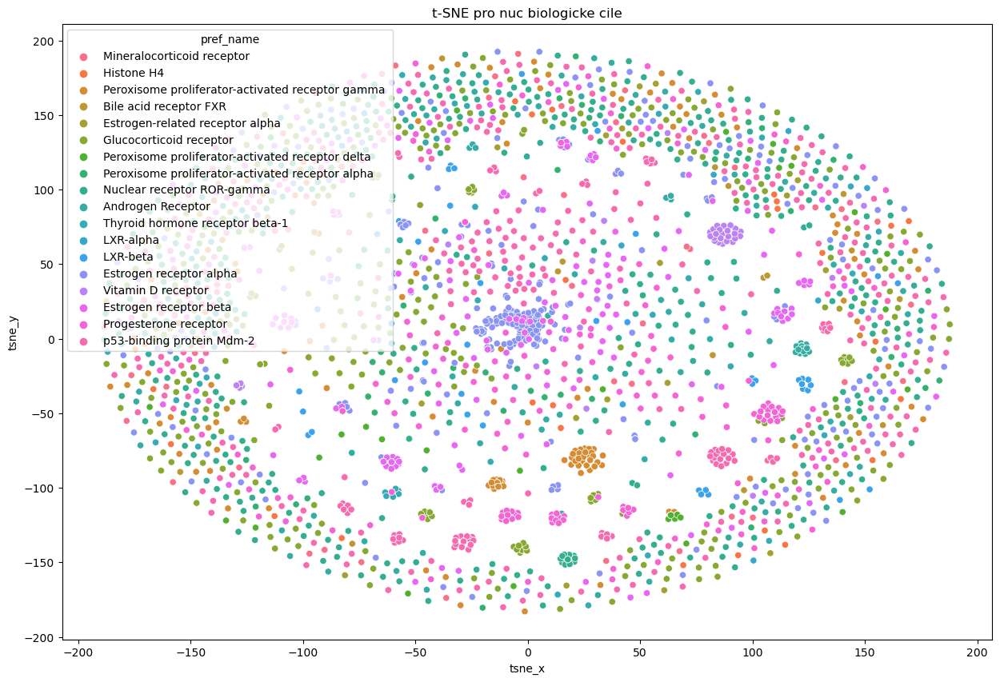

In [118]:
vizualiza_T_SNE(nucler_ic50, 'nuc')

(8686, 2048)
(8686, 50)
(37718955,)
(37718955,)
(8686, 8686)
(8686, 8686)


/home/filv/anaconda3/envs/rdkit-env/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/filv/anaconda3/envs/rdkit-env/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


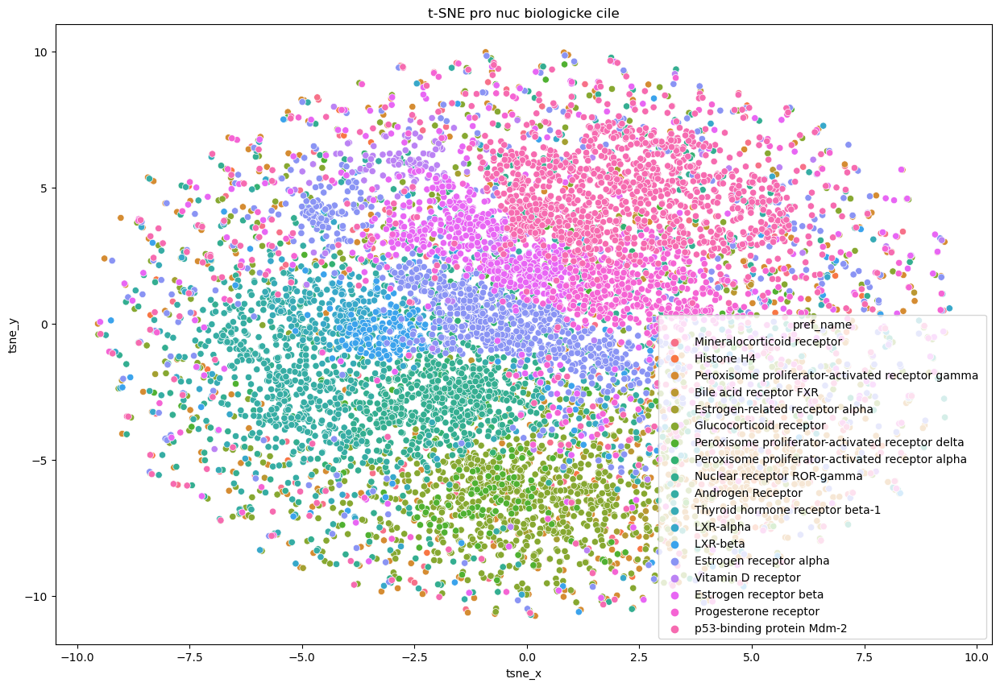

In [110]:
vizualiza_T_SNE(nucler_ic50, 'nuc')

(8686, 2048)
(8686, 50)
(37718955,)
(37718955,)
(8686, 8686)
(8686, 8686)


/home/filv/anaconda3/envs/rdkit-env/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/filv/anaconda3/envs/rdkit-env/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


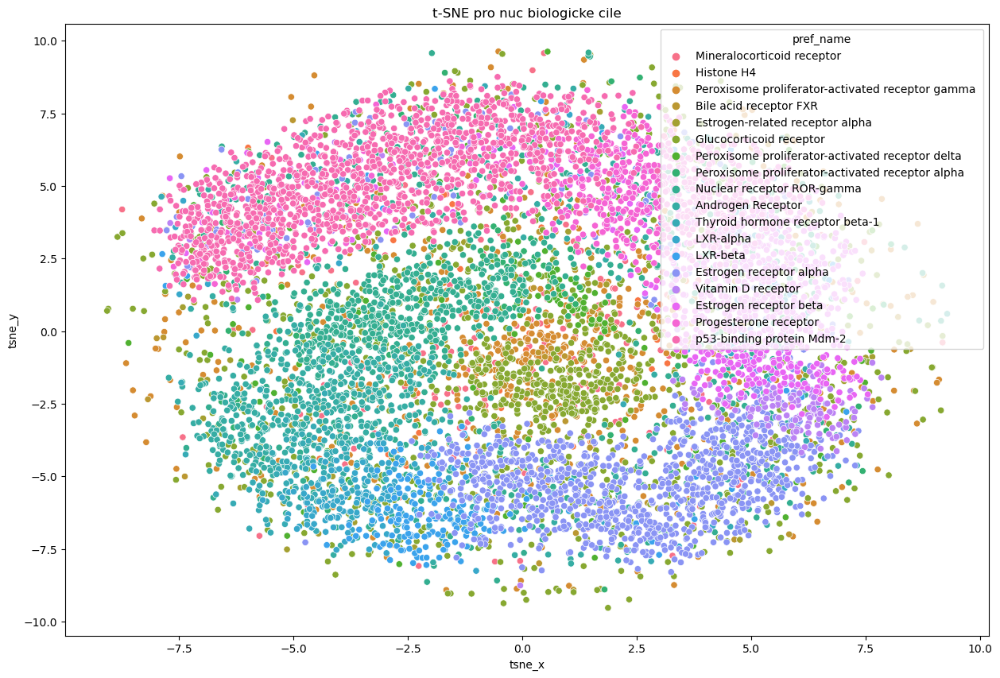

In [112]:
vizualiza_T_SNE(nucler_ic50, 'nuc')